**DATASET OVERVIEW**

The dataset used in this project is the Bank Marketing Dataset, which contains information about a bank's marketing campaigns conducted through direct mail and phone calls. The dataset was originally collected for predicting whether a customer would subscribe to a term deposit (a fixed-term investment) based on various attributes related to the customer and the marketing effort.


**Column Descriptions**:

***age***: The age of the client in years.

***job***: The type of job or occupation of the client (e.g., housemaid, services, admin, blue-collar, technician, retired).

***marital***: The marital status of the client (e.g., married, single, divorced).

***education***: The highest level of education attained by the client (e.g., basic, high school, university degree, professional course).

***default***: Indicates whether the client has credit in default (yes/no).

***housing***: Indicates whether the client has a housing loan (yes/no).

***loan***: Indicates whether the client has a personal loan (yes/no).

***contact***: The communication type used to contact the client (e.g., telephone, cellular).

***month***: The month when the last contact was made (e.g., may, nov).

***day_of_week***: The day of the week when the last contact was made (e.g., mon, fri).

***campaign***: The number of contacts performed during this campaign for this client (an integer).

***pdays***: The number of days since the client was last contacted (999 indicates no previous contact).

***previous***: The number of times the client was contacted before this campaign (an integer).

***poutcome***: The outcome of the previous marketing campaign (e.g., success, failure, nonexistent).

***emp.var.rate***: The variation rate of employment (an economic indicator).

***cons.price.idx***: The consumer price index (CPI), which measures changes in the price level of a basket of consumer goods and services.

***cons.conf.idx***: An index that measures the degree of optimism consumers feel about the overall state of the economy and their personal financial situation.

***euribor3m***: The 3-month Euro Interbank Offered Rate, which is the interest rate at which banks lend to each other.

***nr.employed***: The total number of people employed in the client’s region (an economic indicator).

***y***: The target variable indicating whether the client subscribed to a term deposit (yes/no).

**PURPOSE**

The goal of analyzing this dataset is to build predictive models that can identify potential customers who are likely to subscribe to a term deposit, helping the bank optimize its marketing strategies and increase customer engagement. The dataset serves as a valuable resource for exploring the application of machine learning techniques in classification tasks within the banking and finance sector.



## Import the required Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from warnings import filterwarnings
filterwarnings('ignore')
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
from sklearn.metrics import r2_score
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import plot_tree
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

### READ THE FILE

In [2]:
# reading the file
df = pd.read_csv(r"C:\Users\Shimoun\OneDrive\Documents\bank-additional\bank-additional\bank-additional-full.csv", delimiter=';')

# check for the first 10 rows of the dataset
df.head(10)

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
5,45,services,married,basic.9y,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
6,59,admin.,married,professional.course,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
7,41,blue-collar,married,unknown,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
8,24,technician,single,professional.course,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
9,25,services,single,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [3]:
# getting the onformation about the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

In [4]:
# check for the null values
df.isnull().sum()

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64

In [5]:
# renaming some of the columns
df.rename(columns ={
    'emp.var.rate': 'employment_variation_rate',
    'cons.price.idx': 'consumer_price_index',
    'cons.conf.idx': 'consumer_confidence_index',
    'euribor3m': 'euribor_3_month',
    'nr.employed': 'number_of_employed'
}, inplace=True)
print(df.columns)

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'employment_variation_rate',
       'consumer_price_index', 'consumer_confidence_index', 'euribor_3_month',
       'number_of_employed', 'y'],
      dtype='object')


In [6]:
# correction of anomalies in categorical columns
df['job'] = df['job'].replace({'admin.' : 'admin'})
df['education'] = df['education'].replace({'basic.4y' : 'basic 4 years'})
df['education'] = df['education'].replace({'high.school' : 'high school'})
df['education'] = df['education'].replace({'basic.6y' : 'basic 6 years'})
df['education'] = df['education'].replace({'basic.9y' : 'basic 9 years'})
df['education'] = df['education'].replace({'professional.course' : 'professional course'})
df['education'] = df['education'].replace({'university.degree' : 'university degree'})

In [7]:
# decribe the dataset
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,41188.0,40.024060,10.421250,17.000,32.000,38.000,47.000,98.000
duration,41188.0,258.285010,259.279249,0.000,102.000,180.000,319.000,4918.000
campaign,41188.0,2.567593,2.770014,1.000,1.000,2.000,3.000,56.000
pdays,41188.0,962.475454,186.910907,0.000,999.000,999.000,999.000,999.000
previous,41188.0,0.172963,0.494901,0.000,0.000,0.000,0.000,7.000
employment_variation_rate,41188.0,0.081886,1.570960,-3.400,-1.800,1.100,1.400,1.400
consumer_price_index,41188.0,93.575664,0.578840,92.201,93.075,93.749,93.994,94.767
consumer_confidence_index,41188.0,-40.502600,4.628198,-50.800,-42.700,-41.800,-36.400,-26.900
euribor_3_month,41188.0,3.621291,1.734447,0.634,1.344,4.857,4.961,5.045
number_of_employed,41188.0,5167.035911,72.251528,4963.600,5099.100,5191.000,5228.100,5228.100


**KEY INFRENCES**

***Age Distribution***: The average age of clients is approximately 40 years, with a range from 17 to 98 years. This indicates a relatively broad demographic that could influence marketing strategies.

***Duration of Calls***: The average duration of calls (around 258 seconds) suggests that more engaged conversations may correlate with subscription decisions. The maximum duration is significantly higher (4918 seconds), indicating that some clients may require extensive interaction.

***Campaign Characteristics***: On average, campaigns involve about 2.57 contacts per client. This metric can help assess whether increasing contact frequency might lead to higher conversion rates.

***Previous Interactions***: The previous feature shows that many clients had no prior contacts (0), with a small number having multiple previous interactions. Understanding the impact of previous engagements on current campaigns will be vital.

***Pdays (days since last contact)***: Many entries have a value of 999, which typically indicates that there was no previous contact. This could reflect either new prospects or clients who were not contacted in the previous campaign cycle.

***Economic Indicators***: Features like employment variation rate, consumer price index, and euribor 3 month can provide insights into external economic factors affecting client behavior. For instance, fluctuations in these indicators may correlate with increased or decreased subscription likelihood.

***Employment***: The average number of employees (nr.employed) is about 5167, suggesting the dataset might focus on clients who are economically active, potentially influencing their ability to subscribe to a term deposit.

**SOME INSIGHTS ABOUT THE ECONOMIC INDICATORS**  

***Employment Variation Rate*** - This indicator reflects the changes in employment levels within a given period. A negative value suggests a decline in employment, indicating potential job losses or economic downturns. This can affect consumer spending and overall economic health.

***Consumer Price Index*** - This measures the average change over time in the prices paid by consumers for a basket of goods and services. A negative value here might indicate deflation, where prices decrease over time. Deflation can lead to decreased consumer spending as people anticipate lower prices in the future, potentially harming the economy.

***Consumer Confidence Index*** - This measures the consumer behaviour and the spending patterns of consumer. A high CCI value in the dataset suggests that consumers felt optimistic about economic stability during that period, potentially making them more receptive to offers like term deposits. Conversely, a low CCI could imply economic concerns, possibly affecting subscription rates negatively.

***Euribor 3 Month*** - The Euribor 3-Month (Euro Interbank Offered Rate) is the average interest rate at which eurozone banks are willing to lend funds to one another for a period of three months. It is a key benchmark for short-term interest rates in the Eurozone and is widely used in financial markets and economic analysis.In our dataset, the Euribor 3-Month rate serves as a financial indicator that might correlate with clients' willingness to subscribe to term deposits. For instance, a lower Euribor rate could make term deposits appear more attractive compared to other investments, potentially increasing subscription rates.


In [8]:
# describe categorical columns
df.describe(include = 'object').T

,count,unique,top,freq
job,41188,12,admin,10422
marital,41188,4,married,24928
education,41188,8,university degree,12168
default,41188,3,no,32588
housing,41188,3,yes,21576
loan,41188,3,no,33950
contact,41188,2,cellular,26144
month,41188,10,may,13769
day_of_week,41188,5,thu,8623
poutcome,41188,3,nonexistent,35563


**Inferences from Categorical Features**:

***Job Distribution***: The most common job type is "admin," with 10,422 occurrences. This indicates that administrative roles are prevalent among the clients, which may influence targeted marketing strategies.

***Marital Status***: The majority of clients are "married" (24,928), suggesting that marketing efforts could be tailored to address the needs and interests of married individuals, potentially focusing on family-oriented financial products.

***Education Level***: "University degree" is the most common education level (12,168), indicating a generally educated client base. This could allow for more sophisticated messaging and product offerings.

***Credit Default***: A significant majority (32,588) of clients have no credit default, which is a positive indicator for financial products. Marketing campaigns can highlight benefits for clients with good credit histories.

***Housing Loans***: Many clients (21,576) have housing loans, suggesting a potential market for financial products that cater to homeowners, such as investment opportunities or additional credit lines.

***Personal Loans***: A substantial number (33,950) of clients do not have personal loans, indicating an opportunity to market personal loan products to this group.

***Contact Type***: The most frequent contact method is "cellular" (26,144), suggesting that mobile communication may be the most effective way to reach clients.

***Contact Month***: May is the most common month for contact (13,769), which may reflect the timing of marketing campaigns. Analyzing seasonal trends could enhance future campaign effectiveness.

***Day of the Week***: Thursday is the most common day for contact (8,623). This insight could help optimize outreach schedules.

***Previous Outcome***: The most frequent previous outcome is "nonexistent" (35,563), indicating that many clients have not been part of prior campaigns. This could imply a focus on new client acquisition rather than re-engagement.

***Target Variable (y)***: The majority of clients did not subscribe to a term deposit (36,548), which highlights the challenge in converting leads and indicates that the campaigns need refinement to improve conversion rates.

In [9]:
# checking for the duplicates
df.duplicated().sum()

12

In [10]:
# deletion of dulpicates
df.drop_duplicates()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,employment_variation_rate,consumer_price_index,consumer_confidence_index,euribor_3_month,number_of_employed,y
0,56,housemaid,married,basic 4 years,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin,married,basic 6 years,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,retired,married,professional course,no,yes,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes
41184,46,blue-collar,married,professional course,no,no,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41185,56,retired,married,university degree,no,yes,no,cellular,nov,fri,...,2,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41186,44,technician,married,professional course,no,no,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes


## ***Distribution and Skewness of Numerical Features in the Dataset***

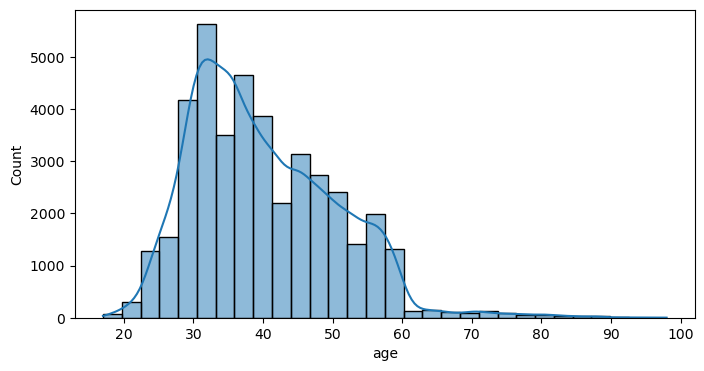

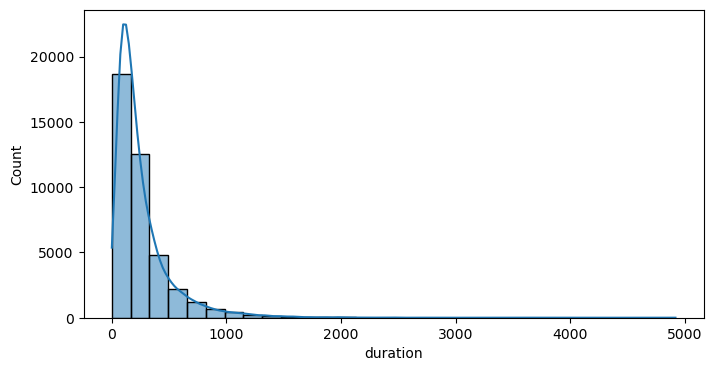

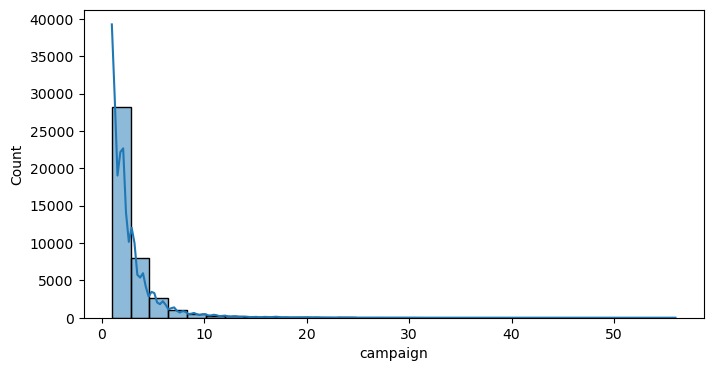

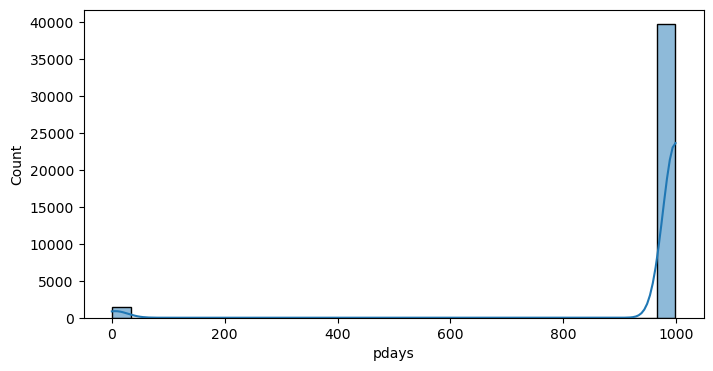

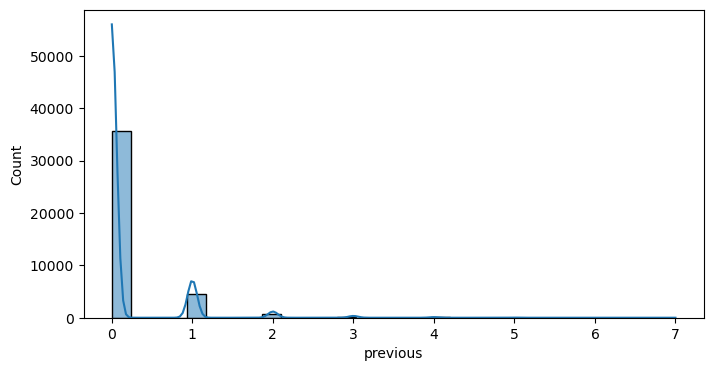

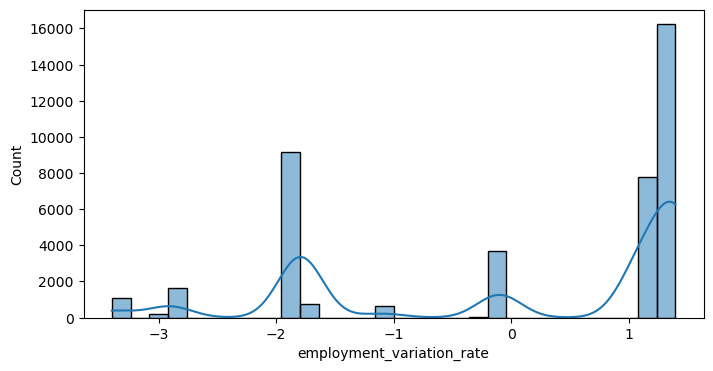

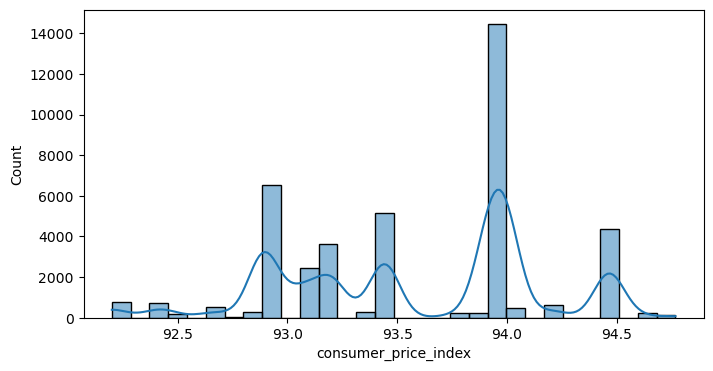

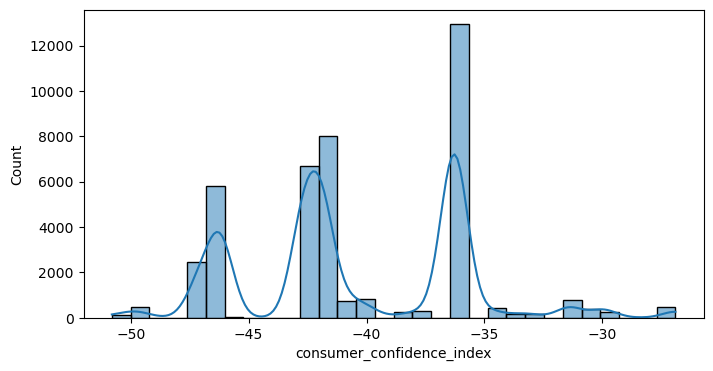

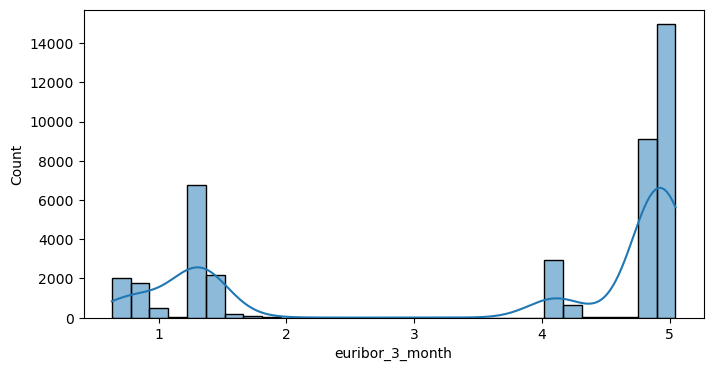

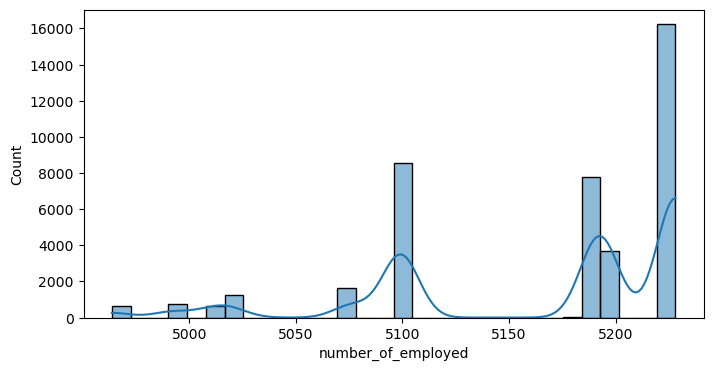

In [11]:
# checking for the skewness of the data
numerical_cols = df.select_dtypes(include=['float64', 'int64'])

for col in numerical_cols.columns:
    plt.figure(figsize=(8, 4))
    sns.histplot(df[col], kde=True, bins=30)
    skewness_value = df[col].skew()
    plt.show()

## **OUTLIER ANALYSIS**

**AGE OUTLIER ANALYSIS**

In [12]:
#The counts for each value of age
df['age'].value_counts()

age
31    1947
32    1846
33    1833
36    1780
35    1759
      ... 
89       2
91       2
94       1
87       1
95       1
Name: count, Length: 78, dtype: int64

In [13]:
# checking the unique age values
df['age'].unique()

array([56, 57, 37, 40, 45, 59, 41, 24, 25, 29, 35, 54, 46, 50, 39, 30, 55,
       49, 34, 52, 58, 32, 38, 44, 42, 60, 53, 47, 51, 48, 33, 31, 43, 36,
       28, 27, 26, 22, 23, 20, 21, 61, 19, 18, 70, 66, 76, 67, 73, 88, 95,
       77, 68, 75, 63, 80, 62, 65, 72, 82, 64, 71, 69, 78, 85, 79, 83, 81,
       74, 17, 87, 91, 86, 98, 94, 84, 92, 89], dtype=int64)

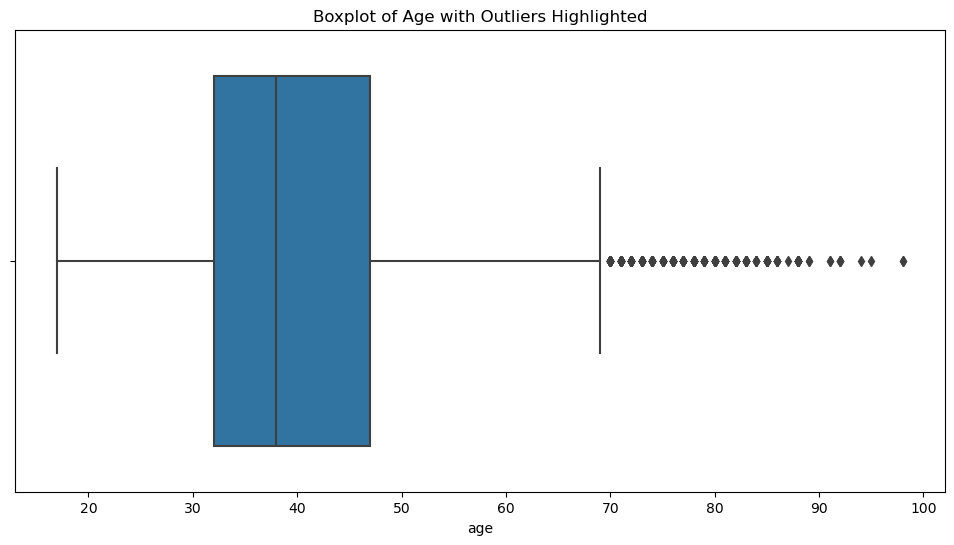

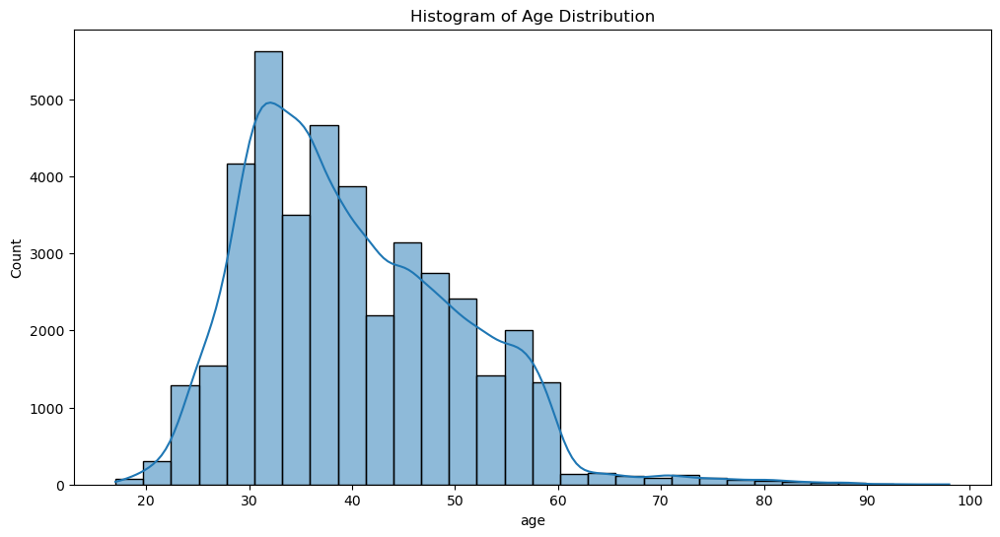

In [14]:
# boxplot and histplot of variable age
plt.figure(figsize=(12, 6))
sns.boxplot(x=df['age'])
plt.title('Boxplot of Age with Outliers Highlighted')
plt.show()

plt.figure(figsize=(12, 6))
sns.histplot(df['age'], bins=30, kde=True)
plt.title('Histogram of Age Distribution')
plt.show()

In [15]:
# calculating the lower and upper bounds
Q1 = df['age'].quantile(0.25)
Q3 = df['age'].quantile(0.75)
IQR = Q3 - Q1

# Define the outlier thresholds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identify outliers
outliers = df[(df['age'] < lower_bound) | (df['age'] > upper_bound)]
print("Outliers:")
print(outliers.age.value_counts())

Outliers:
age
71    53
70    47
73    34
72    34
76    34
74    32
80    31
78    27
75    24
88    22
77    20
81    20
83    17
82    17
85    15
79    14
86     8
84     7
92     4
91     2
98     2
89     2
95     1
87     1
94     1
Name: count, dtype: int64


In [16]:
# Filter out outliers directly within the original DataFrame (df)
df = df[(df['age'] >= lower_bound) & (df['age'] <= upper_bound)]

# Print the summary of the original and filtered data
print("Data without outliers:")
print(df.describe().T)

Data without outliers:
                             count         mean         std       min  \
age                        40719.0    39.599008    9.674971    17.000   
duration                   40719.0   258.107493  259.582836     0.000   
campaign                   40719.0     2.574818    2.779474     1.000   
pdays                      40719.0   964.446033  181.982267     0.000   
previous                   40719.0     0.167096    0.483559     0.000   
employment_variation_rate  40719.0     0.110067    1.555365    -3.400   
consumer_price_index       40719.0    93.580967    0.574207    92.201   
consumer_confidence_index  40719.0   -40.549267    4.568686   -50.800   
euribor_3_month            40719.0     3.652601    1.719296     0.634   
number_of_employed         40719.0  5168.608770   71.008345  4963.600   

                                25%       50%       75%       max  
age                          32.000    38.000    47.000    69.000  
duration                    102.000  

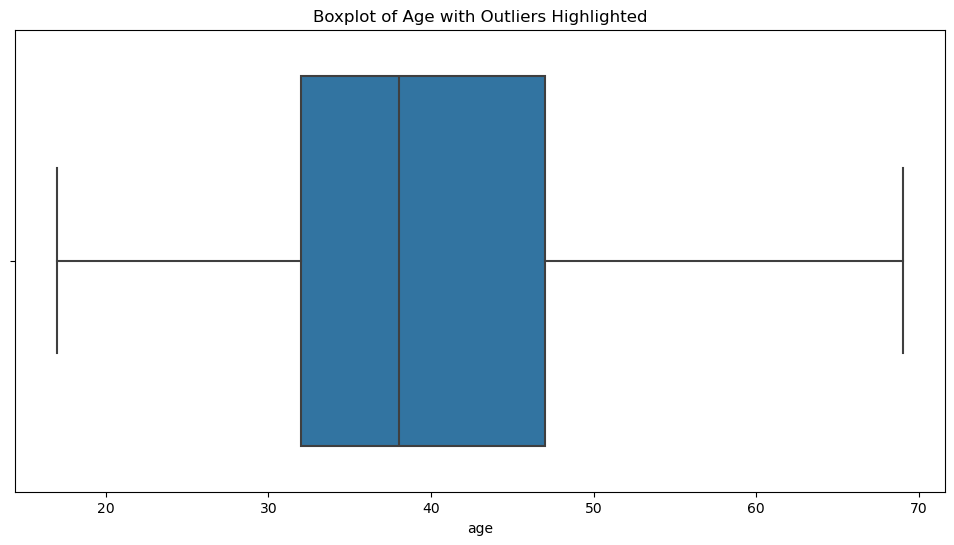

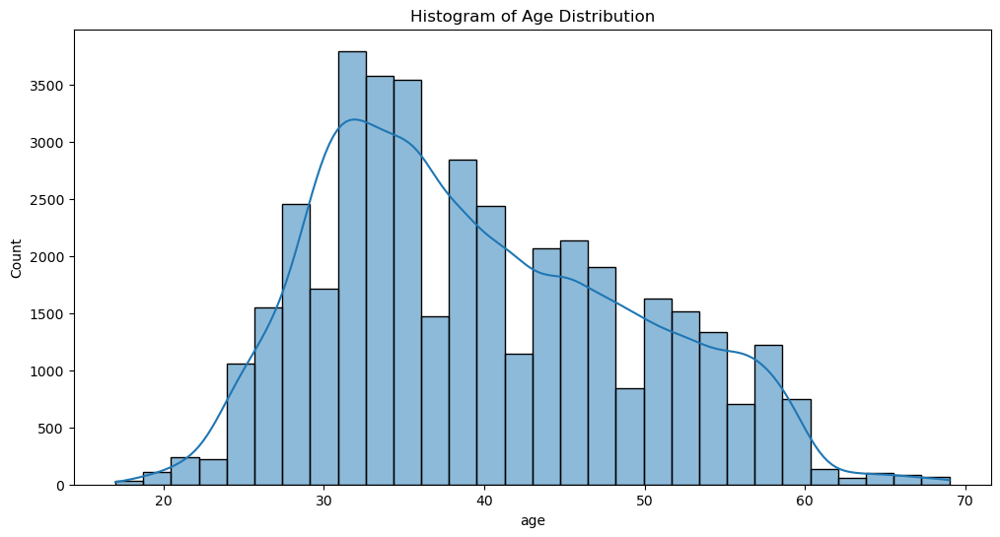

In [17]:
# boxplot and histplot of age after outliers
plt.figure(figsize=(12, 6))
sns.boxplot(x=df['age'])
plt.title('Boxplot of Age with Outliers Highlighted')
plt.show()

plt.figure(figsize=(12, 6))
sns.histplot(df['age'], bins=30, kde=True)
plt.title('Histogram of Age Distribution')
plt.show()

The detected outliers consist of older clients, primarily in the age range of 70-88 years. This trend suggests a potential aging population within your dataset.
The fact that there are multiple entries with the same age implies that this age group is not just rare but possibly indicative of a specific demographic segment.

The majority of ages cluster around the mid-30s to late-60s, which aligns with expectations for financial products like term deposits. Individuals in this age range often seek stable investment options for retirement planning.

Understanding the presence of younger clients could lead to tailored marketing strategies that engage this demographic, promoting financial education and investment products.

**DURATION ANOMALIES**

In [18]:
def detect_duration_anomalies(df):
    # Calculate IQR
    Q1 = df['duration'].quantile(0.25)
    Q3 = df['duration'].quantile(0.75)
    IQR = Q3 - Q1
    # Define the bounds for acceptable values
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    # Identify anomalies
    anomalies = df[(df['duration'] < lower_bound) | (df['duration'] > upper_bound)]
    return anomalies

duration_anomalies = detect_duration_anomalies(df)

# Display anomalies in DataFrame format
print("Anomalies in Duration:")
pd.DataFrame(duration_anomalies)

Anomalies in Duration:


,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,employment_variation_rate,consumer_price_index,consumer_confidence_index,euribor_3_month,number_of_employed,y
37,52,technician,married,basic 9 years,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
57,45,services,married,high school,unknown,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
61,51,blue-collar,married,basic 9 years,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
75,41,blue-collar,divorced,basic 4 years,unknown,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,yes
83,49,entrepreneur,married,university degree,unknown,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41147,25,technician,single,professional course,no,yes,no,cellular,nov,fri,...,2,19,1,success,-1.1,94.767,-50.8,1.040,4963.6,yes
41153,67,housemaid,divorced,professional course,no,yes,no,cellular,nov,mon,...,2,5,5,success,-1.1,94.767,-50.8,1.039,4963.6,yes
41160,33,admin,married,university degree,no,no,no,cellular,nov,tue,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.035,4963.6,yes
41164,54,admin,married,professional course,no,no,no,cellular,nov,tue,...,2,10,1,success,-1.1,94.767,-50.8,1.035,4963.6,yes


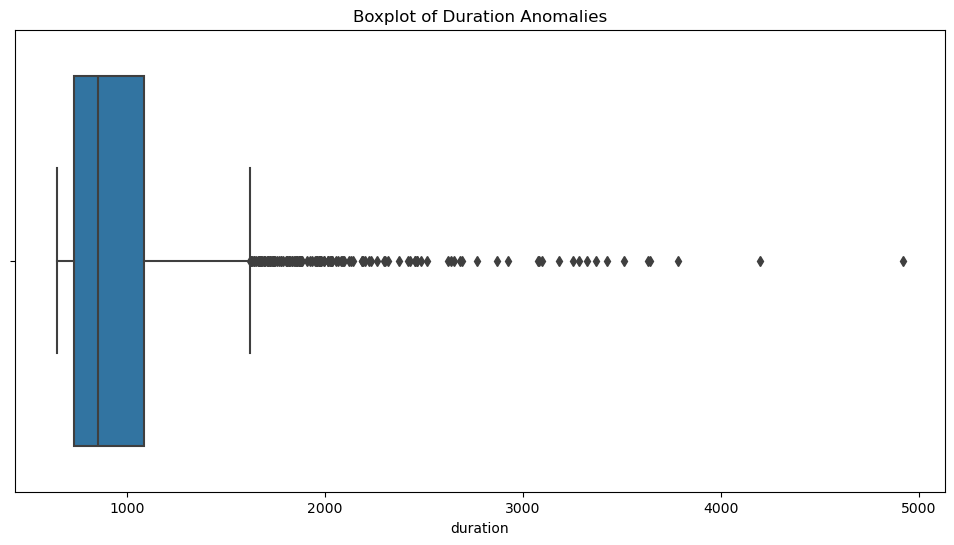

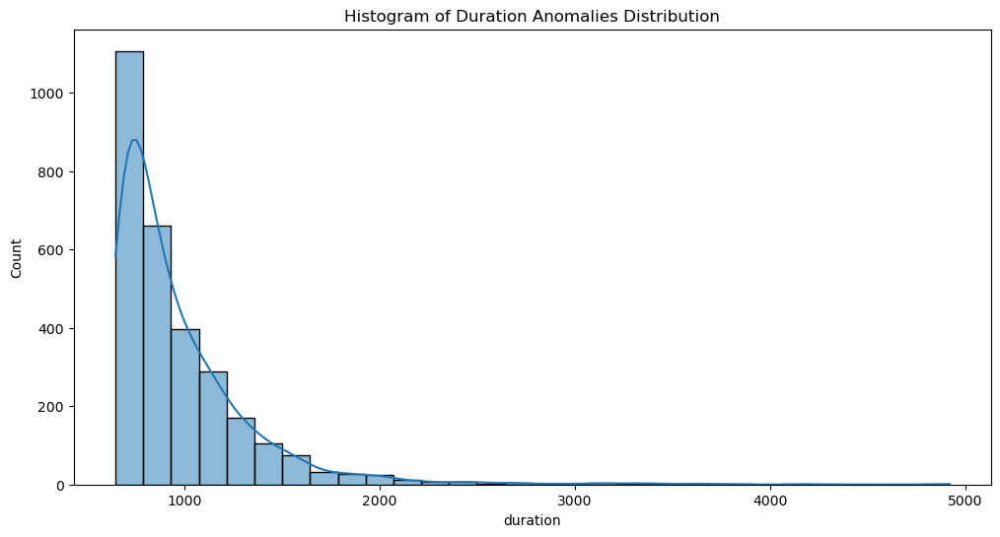

In [19]:
# boxplot and hostogram for duration outliers
plt.figure(figsize=(12, 6))
# Extract the 'duration' column from the anomalies DataFrame
anomalies_duration = detect_duration_anomalies(df)['duration']
sns.boxplot(x=anomalies_duration)  # Pass the Series to boxplot
plt.title('Boxplot of Duration Anomalies')  # Update title for clarity
plt.show()

plt.figure(figsize=(12, 6))
sns.histplot(anomalies_duration, bins=30, kde=True)  # Pass the Series to histplot
plt.title('Histogram of Duration Anomalies Distribution')  # Update title
plt.show()

In [20]:
# Cap the anomalies
df['duration'] = df['duration'].apply(lambda x: upper_bound if x > upper_bound else (lower_bound if x < lower_bound else x))

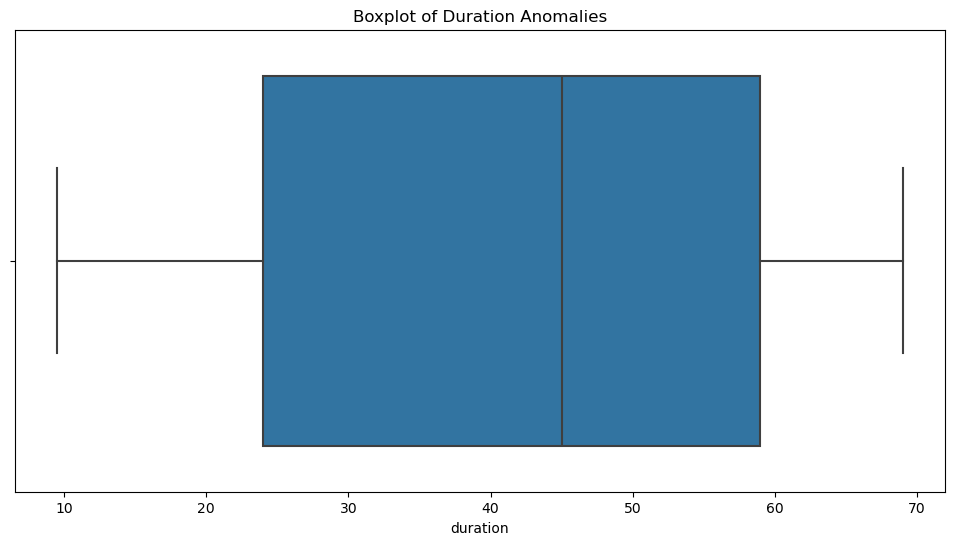

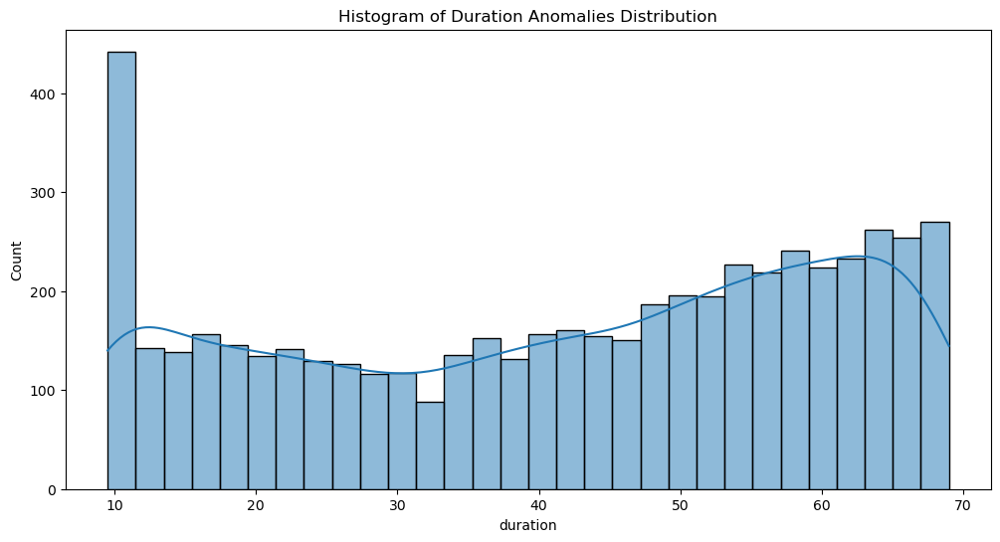

In [21]:
# boxplot and histplot of duration after outlliers
plt.figure(figsize=(12, 6))
df['duration'] = detect_duration_anomalies(df)['duration']
# Extract the 'duration' column from the anomalies DataFrame
sns.boxplot(x=df['duration'])  # Pass the Series to boxplot
plt.title('Boxplot of Duration Anomalies')  # Update title for clarity
plt.show()

plt.figure(figsize=(12, 6))
sns.histplot(df['duration'], bins=30, kde=True)  # Pass the Series to histplot
plt.title('Histogram of Duration Anomalies Distribution')  # Update title
plt.show()

**Unusual Duration Values:**


The anomalies identified in the duration column appear to have values that may suggest either unusually short or long contact durations. If the context is known, you can assess whether these durations align with what is expected in your marketing context.

**CAMPAIGN OUTLIERS**

In [22]:
def detect_campaign_outliers(df):
    # Calculate Q1, Q3, and IQR
    Q1 = df['campaign'].quantile(0.25)
    Q3 = df['campaign'].quantile(0.75)
    IQR = Q3 - Q1

    # Define the bounds for outliers
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Identify outliers
    outliers = df[(df['campaign'] < lower_bound) | (df['campaign'] > upper_bound)]

    return outliers, lower_bound, upper_bound

# Apply the function
campaign_outliers, lower_bound, upper_bound = detect_campaign_outliers(df)

# Display results
print(f"Lower Bound: {lower_bound}")
print(f"Upper Bound: {upper_bound}")
print(f"Number of Outliers in 'campaign': {len(campaign_outliers)}")


Lower Bound: -2.0
Upper Bound: 6.0
Number of Outliers in 'campaign': 2392


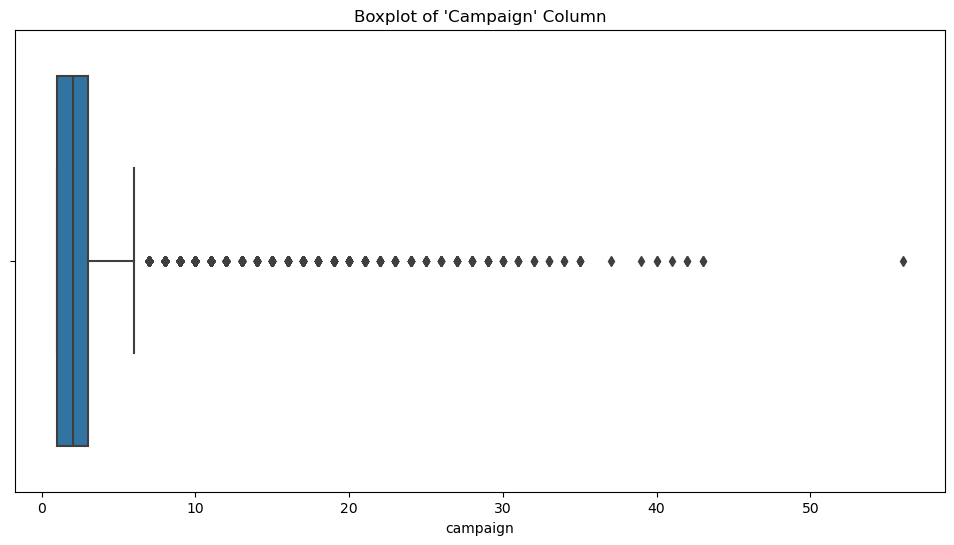

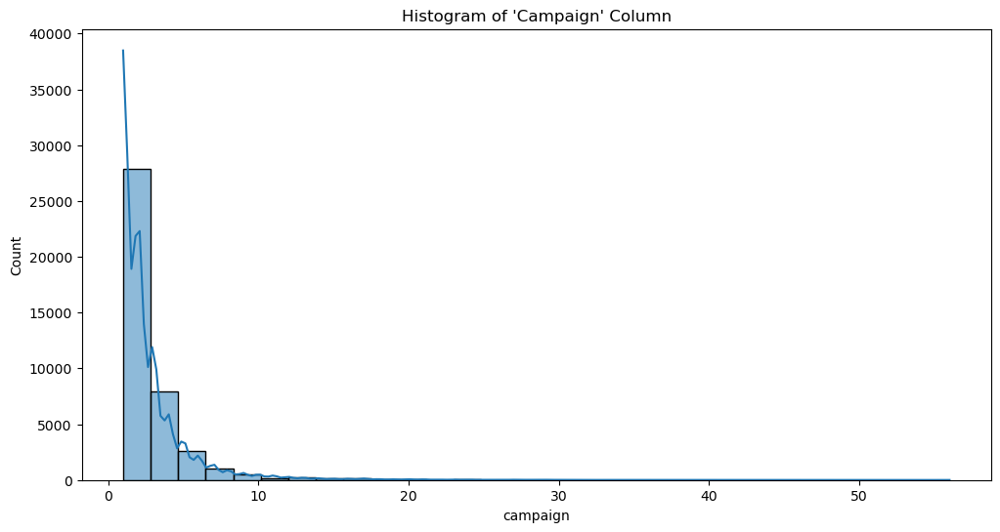

In [23]:
# boxplot and histplot for outliers of camapign column
plt.figure(figsize=(12, 6))
sns.boxplot(x=df['campaign'])
plt.title("Boxplot of 'Campaign' Column")
plt.show()

plt.figure(figsize=(12, 6))
sns.histplot(df['campaign'], bins=30, kde=True)
plt.title("Histogram of 'Campaign' Column")
plt.show()

In [24]:
# Cap/Floor the outliers
df['campaign'] = df['campaign'].apply(lambda x: upper_bound if x > upper_bound else (lower_bound if x < lower_bound else x))

# Check changes
print("Outliers capped/floored to the nearest bounds.")


Outliers capped/floored to the nearest bounds.


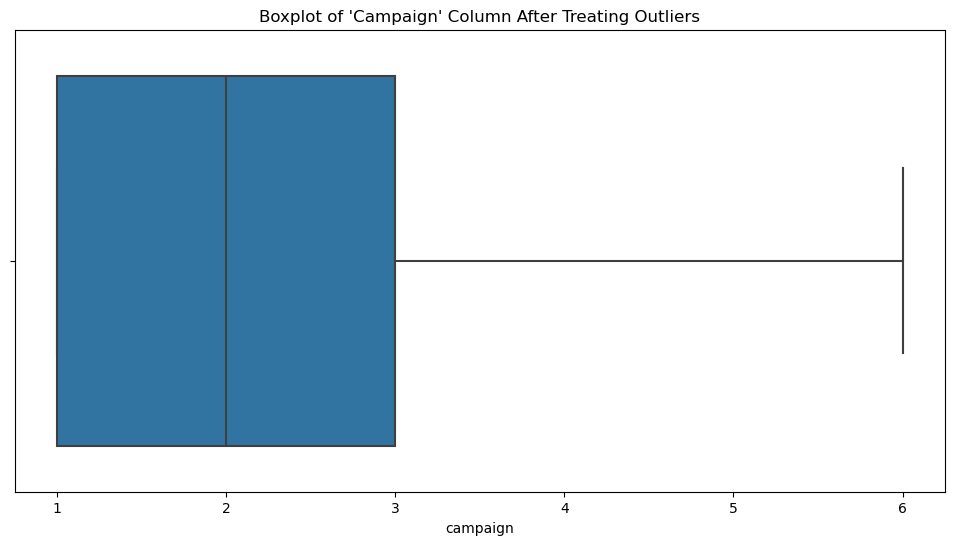

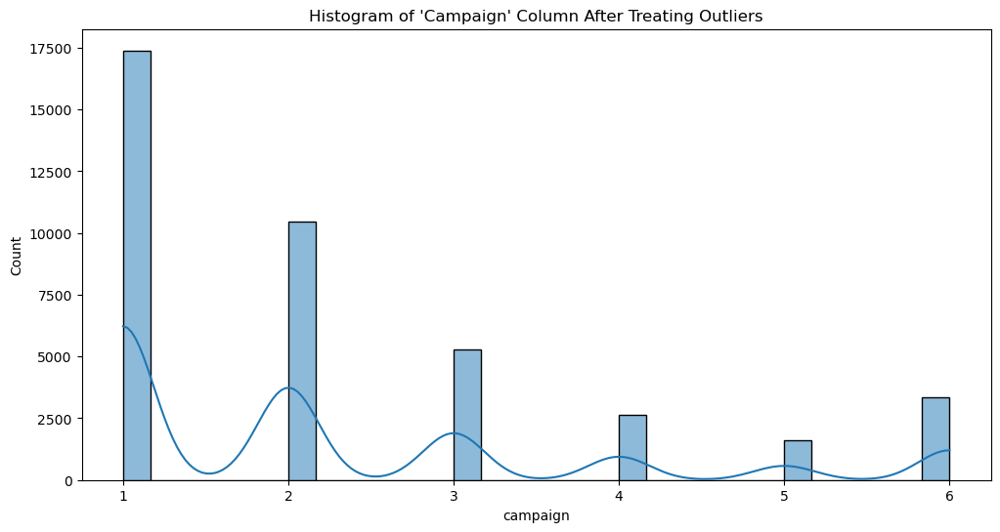

In [25]:
# boxplot and histplot of camapign column after outliers treatment
plt.figure(figsize=(12, 6))
sns.boxplot(x=df['campaign'])  # Change to 'campaign_log' for log-transformed visualization
plt.title("Boxplot of 'Campaign' Column After Treating Outliers")
plt.show()

plt.figure(figsize=(12, 6))
sns.histplot(df['campaign'], bins=30, kde=True)  # Change to 'campaign_log' for log-transformed visualization
plt.title("Histogram of 'Campaign' Column After Treating Outliers")
plt.show()


Since, the campaign column represents the number of calls made to a client during a marketing campaign, it should be a numerical data type. Treating it as numerical allows for straightforward calculations, like finding averages or totals, which can provide insights into campaign effectiveness.

**PDAYS OUTLIER**

In [26]:
df['pdays'].value_counts()

pdays
999    39302
3        399
6        382
4        111
9         60
2         60
12        56
7         55
10        51
5         45
13        34
11        28
1         26
15        22
14        18
8         17
0         15
16        11
17         8
18         7
22         3
19         3
21         2
25         1
26         1
27         1
20         1
Name: count, dtype: int64

In [27]:
# preview the dataset to check 'pdays' column
print("Initial 'pdays' column preview:")
print(df['pdays'].head(10))

Initial 'pdays' column preview:
0    999
1    999
2    999
3    999
4    999
5    999
6    999
7    999
8    999
9    999
Name: pdays, dtype: int64


In [28]:
# Convert 'pdays' to binary indicator
df['previous_contact'] = (df['pdays'] != 999).astype(int)

# Verify the transformation
print(df[['pdays', 'previous_contact']].head())

# Check the counts of binary values
print("Counts of Binary Values in 'previous_contact':")
print(df['previous_contact'].value_counts())


   pdays  previous_contact
0    999                 0
1    999                 0
2    999                 0
3    999                 0
4    999                 0
Counts of Binary Values in 'previous_contact':
previous_contact
0    39302
1     1417
Name: count, dtype: int64


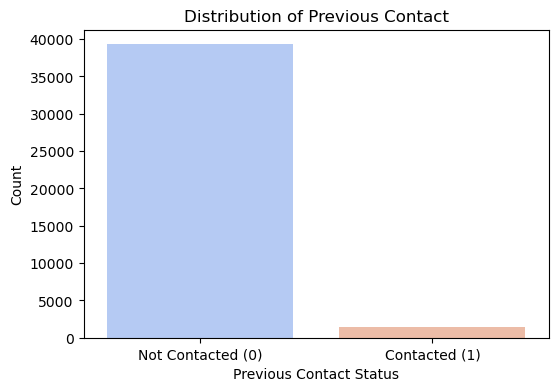

In [29]:
# plot for the pdays column
plt.figure(figsize=(6, 4))
sns.countplot(x='previous_contact', data=df, palette='coolwarm')
plt.title("Distribution of Previous Contact")
plt.xticks([0, 1], ['Not Contacted (0)', 'Contacted (1)'])
plt.xlabel('Previous Contact Status')
plt.ylabel('Count')
plt.show()


In [30]:
df.drop(columns=['pdays'], inplace=True)
print(df.columns)

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'previous',
       'poutcome', 'employment_variation_rate', 'consumer_price_index',
       'consumer_confidence_index', 'euribor_3_month', 'number_of_employed',
       'y', 'previous_contact'],
      dtype='object')


***Advantages of Converting pdays to Binary***

**Simplifies Analysis:**

Instead of dealing with numerical outliers or skewed distributions, it focuses on a straightforward yes/no representation.

**Reduces Noise:**

The exact number of days might not add significant value to the prediction and could introduce noise into the model.

**Improves Model Interpretability:**

Binary variables are easier to interpret in models like logistic regression or decision trees.

**INSIGHTS**

***No Previous Contact*** - The value of 999 serves as a placeholder indicating that there are no historical records of previous marketing interactions with that particular client. This means that the marketing team has not reached out to the client before the current campaign or that the client is new to the database.


pdays column, the values represent the number of days since the client was last contacted in a previous marketing campaign. Here's a breakdown of the values and their implications:

**Breakdown of pdays Values**: **Value of 999**: This value indicates that the client has never been contacted before in any prior campaign. It is a placeholder used to signify that there is no valid "last contact" date. In the dataset, 39,673 instances (about 96% of the data) fall into this category, suggesting that a significant portion of clients are being approached for the first time.

**Other Values (0-27)**: These values indicate the actual number of days since the last contact:
For example, a pdays value of 3 means the client was last contacted 3 days ago.
A value of 0 indicates the client was contacted on the same day of the current campaign.
Values range from 1 to 27, showing that a smaller number of clients have had previous interactions within that timeframe.

**ECONOMIC INDICATORS OUTLIER**

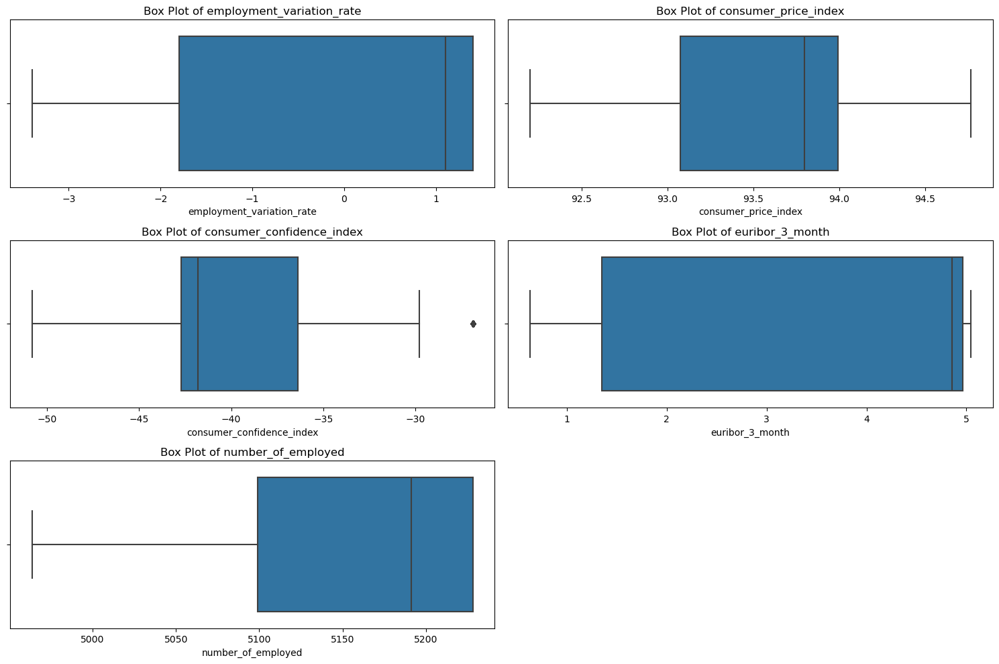

In [31]:
economic_indicators = ['employment_variation_rate', 'consumer_price_index',
                       'consumer_confidence_index', 'euribor_3_month',
                       'number_of_employed']

plt.figure(figsize=(15, 10))
for i, indicator in enumerate(economic_indicators, 1):
    plt.subplot(3, 2, i)
    sns.boxplot(x=df[indicator])
    plt.title(f'Box Plot of {indicator}')
plt.tight_layout()
plt.show()

In [32]:
from scipy import stats
def detect_anomalies_zscore(df, column):

    z_scores = stats.zscore(df[column])

    anomalies = np.where(np.abs(z_scores) > 3)[0]
    return anomalies


for indicator in economic_indicators:
    anomalies = detect_anomalies_zscore(df, indicator)
    print(f"Anomalies detected in {indicator}: {df.iloc[anomalies]}")

Anomalies detected in employment_variation_rate: Empty DataFrame
Columns: [age, job, marital, education, default, housing, loan, contact, month, day_of_week, duration, campaign, previous, poutcome, employment_variation_rate, consumer_price_index, consumer_confidence_index, euribor_3_month, number_of_employed, y, previous_contact]
Index: []

[0 rows x 21 columns]
Anomalies detected in consumer_price_index: Empty DataFrame
Columns: [age, job, marital, education, default, housing, loan, contact, month, day_of_week, duration, campaign, previous, poutcome, employment_variation_rate, consumer_price_index, consumer_confidence_index, euribor_3_month, number_of_employed, y, previous_contact]
Index: []

[0 rows x 21 columns]
Anomalies detected in consumer_confidence_index: Empty DataFrame
Columns: [age, job, marital, education, default, housing, loan, contact, month, day_of_week, duration, campaign, previous, poutcome, employment_variation_rate, consumer_price_index, consumer_confidence_index, e

The results indicate that no anomalies were detected in the economic indicators—namely, employment_variation_rate, consumer_price_index, consumer_confidence_index, euribor_3_month, and number_of_employed. This could imply that the values in these columns are within acceptable ranges or that the detection method did not flag any outliers based on the criteria established.

In [33]:
def detect_anomalies_iqr(df, column):
    # Calculate IQR
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    # Define bounds
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    # Identify anomalies
    anomalies = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    return anomalies


for indicator in economic_indicators:
    anomalies = detect_anomalies_iqr(df, indicator)
    print(f"Anomalies detected in {indicator} using IQR: {anomalies}")

Anomalies detected in employment_variation_rate using IQR: Empty DataFrame
Columns: [age, job, marital, education, default, housing, loan, contact, month, day_of_week, duration, campaign, previous, poutcome, employment_variation_rate, consumer_price_index, consumer_confidence_index, euribor_3_month, number_of_employed, y, previous_contact]
Index: []

[0 rows x 21 columns]
Anomalies detected in consumer_price_index using IQR: Empty DataFrame
Columns: [age, job, marital, education, default, housing, loan, contact, month, day_of_week, duration, campaign, previous, poutcome, employment_variation_rate, consumer_price_index, consumer_confidence_index, euribor_3_month, number_of_employed, y, previous_contact]
Index: []

[0 rows x 21 columns]
Anomalies detected in consumer_confidence_index using IQR:        age         job   marital          education default housing loan  \
38154   50  management   married  university degree      no     yes   no   
38155   37       admin    single  university

***No Anomalies Detected***:

**Employment Variation Rate**: No anomalies detected.

**Consumer Price Index**: No anomalies detected.

**Euribor 3-Month Rate**: No anomalies detected.

**Number of Employed**: No anomalies detected.

***Anomalies Detected:***

**Consumer Confidence Index**: Detected 447 rows of anomalies, indicating values that significantly deviate from the norm based on the IQR method.


**Negatives In Dataset**

***EMPLOYMENT VARIATION RATE***

A negative Employment Variation Rate indicates a decline in employment, often suggesting an economic downturn or weakening labor market. Fewer people are employed, which can reduce consumer spending and affect demand for financial products.

In [34]:
# Count negative values
negative_count = (df['employment_variation_rate'] < 0).sum()
print(f"\nNumber of negative values in 'employment_variation_rate': {negative_count}")


Number of negative values in 'employment_variation_rate': 16722


In [35]:
negative_employments = df[df['employment_variation_rate'] < 0]
sector_count = negative_employments['job'].value_counts()
sector_count

job
admin            4529
blue-collar      3357
technician       2445
services         1560
management       1425
student           703
entrepreneur      655
self-employed     615
retired           577
unemployed        494
housemaid         282
unknown            80
Name: count, dtype: int64

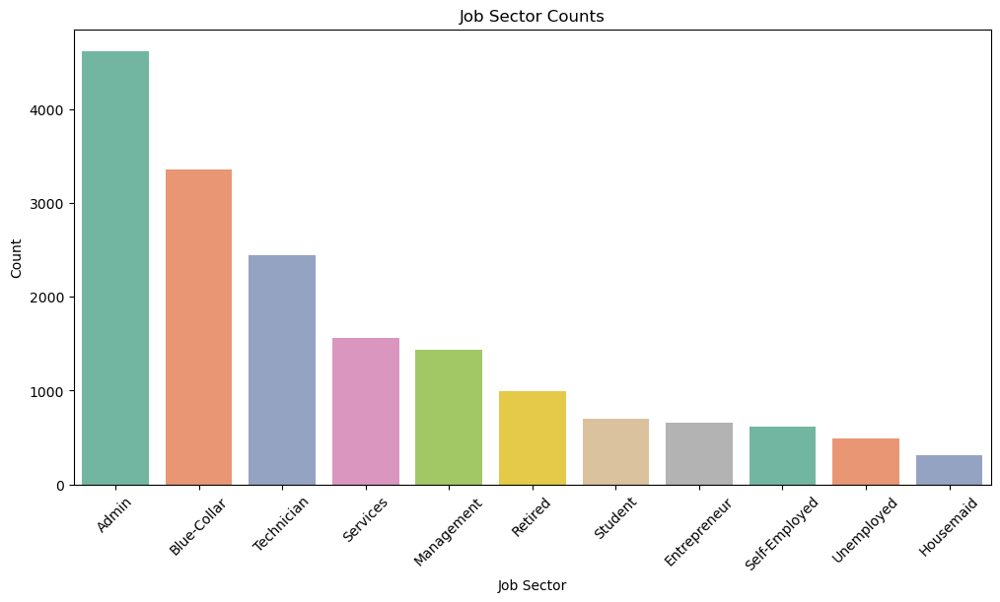

In [36]:
sectors = ['Admin', 'Blue-Collar', 'Technician', 'Services', 'Management',
           'Retired', 'Student', 'Entrepreneur', 'Self-Employed', 'Unemployed',
           'Housemaid']

counts = [4623, 3360, 2446, 1560, 1431, 996, 703, 655, 616, 494, 307]

plt.figure(figsize=(12, 6))
sns.barplot(x=sectors, y=counts, palette='Set2')
plt.title('Job Sector Counts')
plt.xlabel('Job Sector')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

In [37]:
# Calculate mean employment variation rate for subscribers vs non-subscribers
evr_means = df.groupby('y')['employment_variation_rate'].mean()
print("Mean EVR for non-subscribers:", evr_means['no'])
print("Mean EVR for subscribers:", evr_means['yes'])

Mean EVR for non-subscribers: 0.2669669421487603
Mean EVR for subscribers: -1.178796107716678


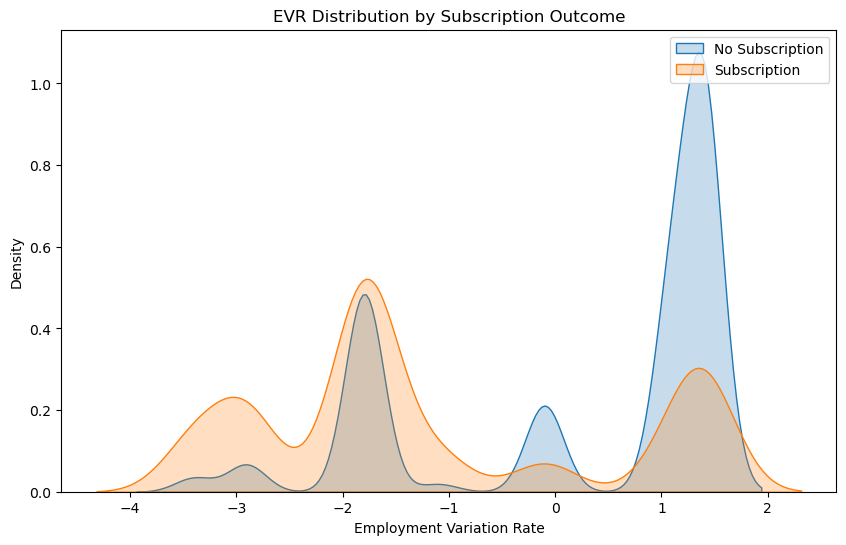

In [38]:
plt.figure(figsize=(10, 6))
sns.kdeplot(df[df['y'] == 'no']['employment_variation_rate'], label='No Subscription', shade=True)
sns.kdeplot(df[df['y'] == 'yes']['employment_variation_rate'], label='Subscription', shade=True)
plt.title('EVR Distribution by Subscription Outcome')
plt.xlabel('Employment Variation Rate')
plt.ylabel('Density')
plt.legend()
plt.show()

**Subscription Likelihood**:

 In periods of negative EVR, customers may be more cautious and less likely to commit to term deposits or financial products, particularly those perceived as less liquid. Conversely, during positive EVR, customers may be more receptive to investment opportunities.

 **Segmented Marketing**:

  Marketing strategies could adjust based on EVR values. For instance, in negative EVR periods, campaigns might emphasize savings accounts or conservative financial products, which appeal to risk-averse customers. In positive EVR times, the focus could shift to growth-oriented products like term deposits or investment accounts.

  **Financial Security Concerns**:
  
  Customers might prioritize building emergency funds or maintaining liquidity during high employment decline periods. This insight could lead to product bundles that offer a balance of growth and safety.

***CONSUMER CONFIDENCE INDEX***

A negative CCI indicates consumer pessimism, meaning consumers are less confident in the economy and more likely to reduce spending, save more, or avoid investments.

In [39]:
count_negatives = (df['consumer_confidence_index'] < 0).sum()
print(f"Number of negative consumer_confidence_index: {count_negatives}")

Number of negative consumer_confidence_index: 40719


In [40]:
negative_employment = df[df['consumer_confidence_index'] < 0]
sector_counts = negative_employment['job'].value_counts()
sector_counts

job
admin            10414
blue-collar       9251
technician        6742
services          3969
management        2918
entrepreneur      1456
self-employed     1420
retired           1301
housemaid         1035
unemployed        1014
student            875
unknown            324
Name: count, dtype: int64

**Identify Vulnerable Sectors**:

Sectors with higher counts (like Admin and Blue-Collar) may be more vulnerable to economic downturns, especially when consumer confidence is low.

**Evaluate Impact:**

Analyze how consumer spending patterns and confidence levels might directly impact these sectors. For instance, administrative roles might be more secure in a downturn compared to service roles.

**Cross-Reference with Consumer Confidence Data:**

Combine this job data with the consumer confidence index to see correlations. Are sectors with higher job counts seeing more negative confidence?

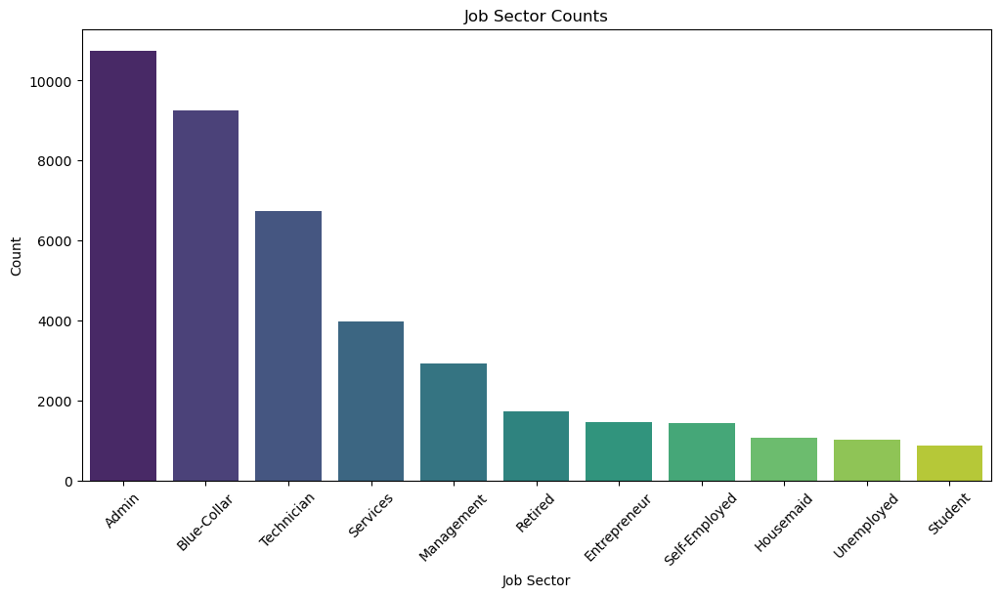

In [41]:
sectors = ['Admin', 'Blue-Collar', 'Technician', 'Services', 'Management',
           'Retired', 'Entrepreneur', 'Self-Employed', 'Housemaid',
           'Unemployed', 'Student']
counts = [10752, 9254, 6743, 3969, 2924, 1720, 1456, 1421, 1060, 1014, 875]

plt.figure(figsize=(12, 6))
sns.barplot(x=sectors, y=counts, palette='viridis')
plt.title('Job Sector Counts')
plt.xlabel('Job Sector')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

**Impact on Spending**:

When consumer confidence is low, households tend to cut back on discretionary spending, which can negatively affect businesses across various sectors. This can lead to lower sales, reduced profits, and potentially job losses.


**Sector Vulnerability:**

Sectors such as retail, services, and hospitality may be more directly affected by consumer confidence fluctuations. For instance, if consumers are unsure about their financial futures, they might avoid non-essential purchases, hitting these sectors harder.

**Job Security**:

Negative confidence can lead to job insecurity, as companies might respond to decreased consumer spending by laying off employees, freezing hiring, or reducing hours.

**Investment Decisions**:

Low consumer confidence can also impact business investments, as companies may delay or reduce investments due to uncertainty about future demand.

**Analyze CCI Impact on Subscription Rates**

In [42]:
# Calculate mean CCI for subscribers vs non-subscribers
cci_means = df.groupby('y')['consumer_confidence_index'].mean()
print("Mean CCI for non-subscribers:", cci_means['no'])
print("Mean CCI for subscribers:", cci_means['yes'])

Mean CCI for non-subscribers: -40.62000275482094
Mean CCI for subscribers: -39.96820547635212


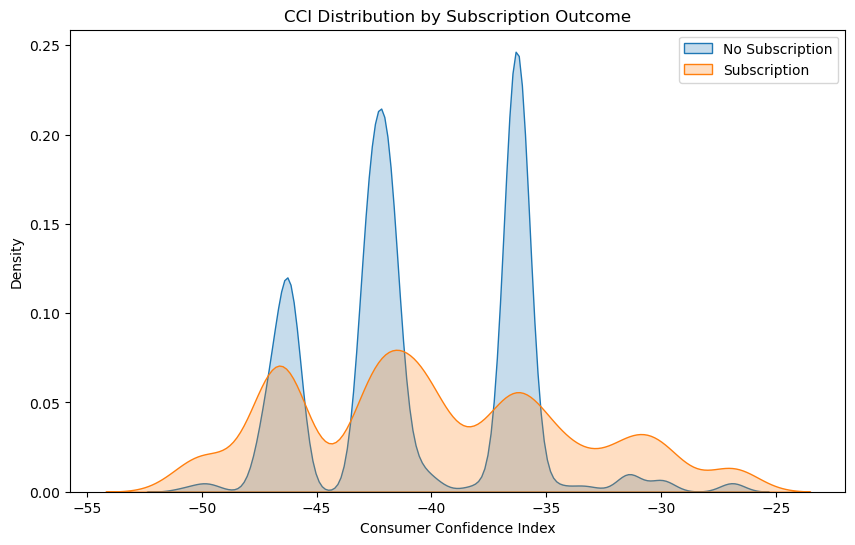

In [43]:
plt.figure(figsize=(10, 6))
sns.kdeplot(df[df['y'] == 'no']['consumer_confidence_index'], label='No Subscription', shade=True)
sns.kdeplot(df[df['y'] == 'yes']['consumer_confidence_index'], label='Subscription', shade=True)
plt.title('CCI Distribution by Subscription Outcome')
plt.xlabel('Consumer Confidence Index')
plt.ylabel('Density')
plt.legend()
plt.show()

***CONSUMER PRICE INDEX***

While uncommon, a negative CPI would indicate deflation, meaning average prices are decreasing. This is typically a sign of weak demand or economic instability, as prices generally rise over time.

In [44]:
count_negatives = (df['consumer_price_index'] < 0).sum()
print(f"Number of negative consumer_price_index:: {count_negatives}")

Number of negative consumer_price_index:: 0


In [45]:
Q1 = df['consumer_price_index'].quantile(0.25)
Q3 = df['consumer_price_index'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
anomalies_iqr = df[(df['consumer_price_index'] < lower_bound) | (df['consumer_price_index'] > upper_bound)]
anomalies_iqr

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,previous,poutcome,employment_variation_rate,consumer_price_index,consumer_confidence_index,euribor_3_month,number_of_employed,y,previous_contact


Consumer Price Index : Values are stable

***EURIBOR 3-MONTH***

 A negative Euribor rate often reflects highly accommodative monetary policy, where central banks aim to stimulate the economy by making borrowing cheaper. This can indicate a period of economic uncertainty or low growth.

In [46]:
negative_euribor = df[df['euribor_3_month'] < 0]
negative_euribor

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,previous,poutcome,employment_variation_rate,consumer_price_index,consumer_confidence_index,euribor_3_month,number_of_employed,y,previous_contact


In [47]:
Q1 = df['euribor_3_month'].quantile(0.25)
Q3 = df['euribor_3_month'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
anomalies_iqr = df[(df['euribor_3_month'] < lower_bound) | (df['euribor_3_month'] > upper_bound)]
anomalies_iqr

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,previous,poutcome,employment_variation_rate,consumer_price_index,consumer_confidence_index,euribor_3_month,number_of_employed,y,previous_contact


**Economic Events**:

Sudden changes in the interest rate due to economic crises, policy changes, or significant market movements. Client Behavior: If clients with unusually high or low euribor_3_month values tend to show different subscription behaviors, this could highlight specific market conditions affecting their decision-making.

### **CHECKING UNKNOWN VALUES IN CATEGORICAL COLUMNS AND TREATING THEM**

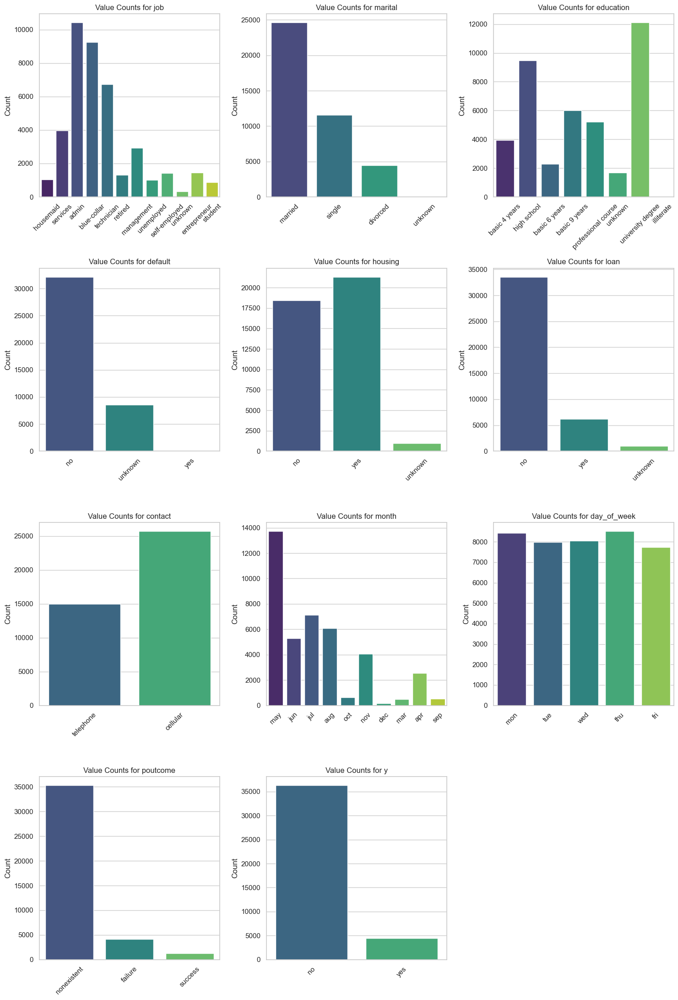

In [48]:
# Set the plot style
sns.set(style="whitegrid")

# Get the list of categorical columns
categorical_columns = df.select_dtypes(include='object').columns

# Set up the figure with subplots for each categorical variable
num_plots = len(categorical_columns)
fig, axes = plt.subplots(nrows=(num_plots // 3) + 1, ncols=3, figsize=(15, num_plots * 2))

# Flatten axes for easy iteration
axes = axes.flatten()

# Plot each categorical column's value counts as a bar plot
for i, col in enumerate(categorical_columns):
    sns.countplot(x=col, data=df, ax=axes[i], palette="viridis")
    axes[i].set_title(f'Value Counts for {col}')
    axes[i].set_xlabel('')
    axes[i].set_ylabel('Count')
    axes[i].tick_params(axis='x', rotation=45)  # Rotate x-axis labels by 45 degrees

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

Impute **"unknown"** values in categorical columns with the **mode**, as the number of "unknown" entries is small compared to other values

In [49]:
# Replace 'unknown' with the mode of each column
for col in categorical_columns:
    mode = df.loc[df[col] != 'unknown', col].mode()[0]
    df[col] = df[col].replace('unknown', mode)

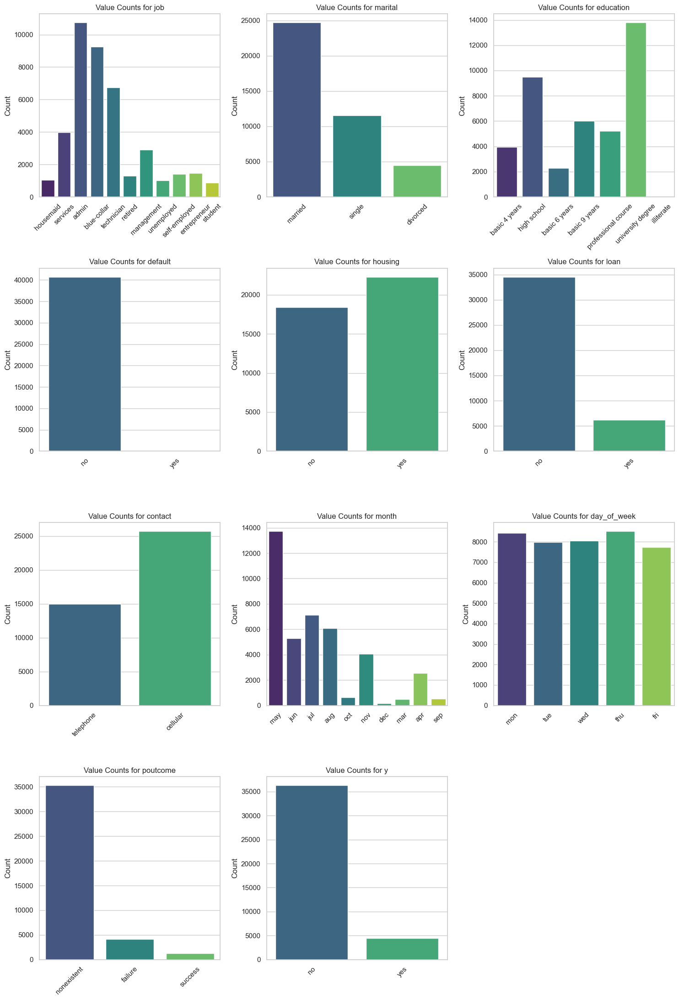

In [50]:
# Rechecking the "unknown" values
# Set the plot style
sns.set(style="whitegrid")

# Get the list of categorical columns
categorical_columns = df.select_dtypes(include='object').columns

# Set up the figure with subplots for each categorical variable
num_plots = len(categorical_columns)
fig, axes = plt.subplots(nrows=(num_plots // 3) + 1, ncols=3, figsize=(15, num_plots * 2))

# Flatten axes for easy iteration
axes = axes.flatten()

# Plot each categorical column's value counts as a bar plot
for i, col in enumerate(categorical_columns):
    sns.countplot(x=col, data=df, ax=axes[i], palette="viridis")
    axes[i].set_title(f'Value Counts for {col}')
    axes[i].set_xlabel('')
    axes[i].set_ylabel('Count')
    axes[i].tick_params(axis='x', rotation=45)  # Rotate x-axis labels by 45 degrees

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

**INSIGHTS**

In categorical variables, the label unknown generally represents missing, unavailable, or ambiguous information about that specific feature.

Since the unknown data in our dataset is not much, we are replacing it with the mode of the column.

## **UNIVARIATE ANALYSIS**

In [51]:
# Function for boxplot
def box_plot(attribute):
    plt.figure(figsize=(8, 6))
    sns.boxplot(x=df[attribute], color='green')
    plt.title(f'Boxplot of {attribute}', fontsize=14)
    plt.xlabel(f'{attribute}', fontsize=12)
    plt.show()

# Function for histogram
def hist_plot(attribute):
    plt.figure(figsize=(10, 8))
    sns.histplot(df[attribute], bins=30, kde=True, color='skyblue', edgecolor='black')
    plt.title(f'Distribution of {attribute}', fontsize=14)
    plt.xlabel(f'{attribute}', fontsize=12)
    plt.ylabel('Frequency', fontsize=12)
    plt.show()


Visualizing age:


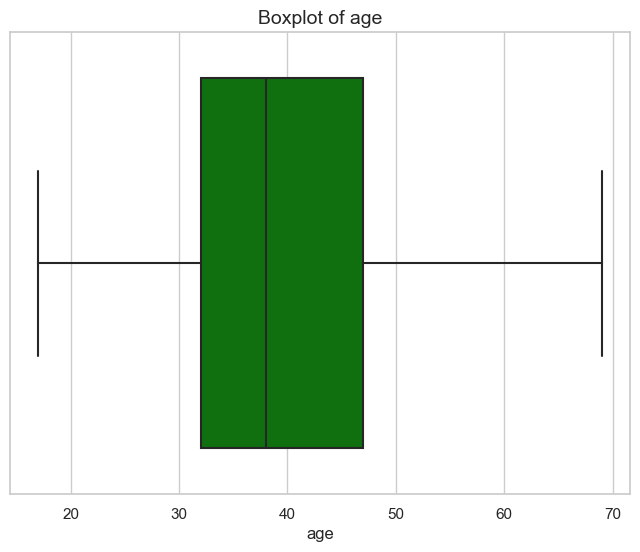

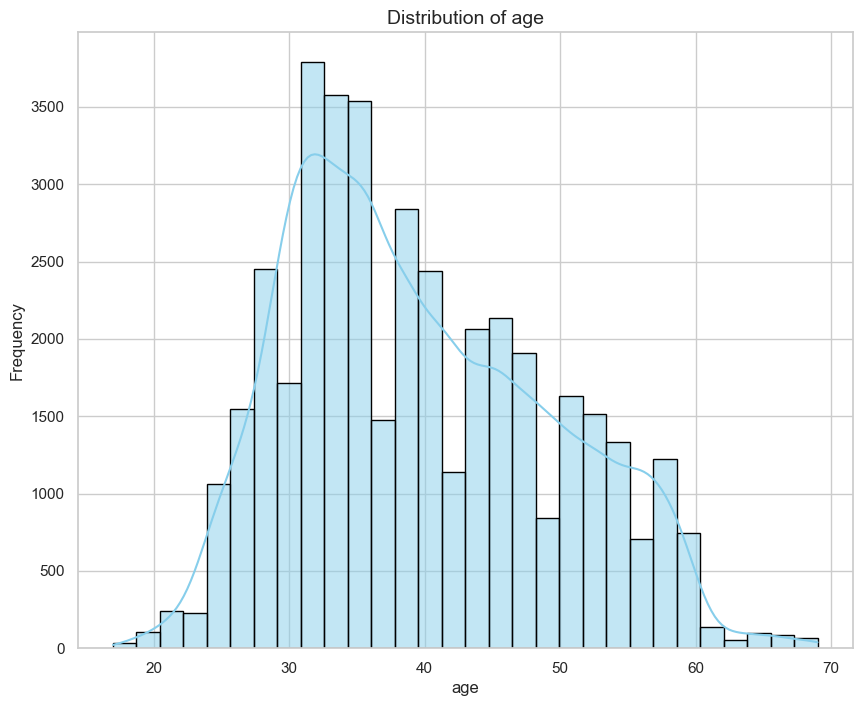

Visualizing duration:


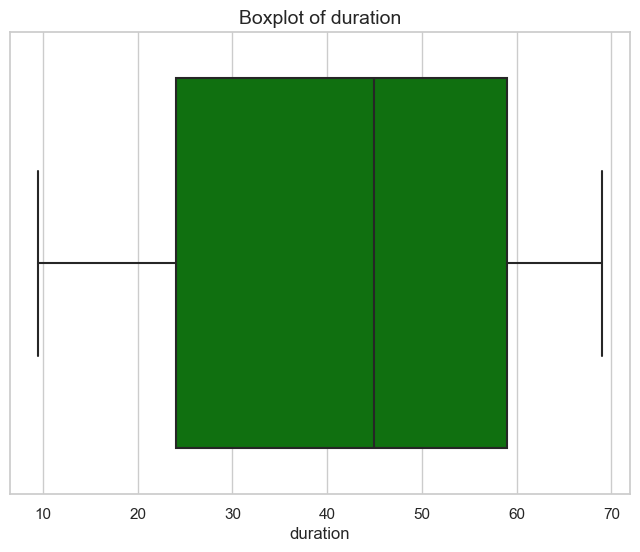

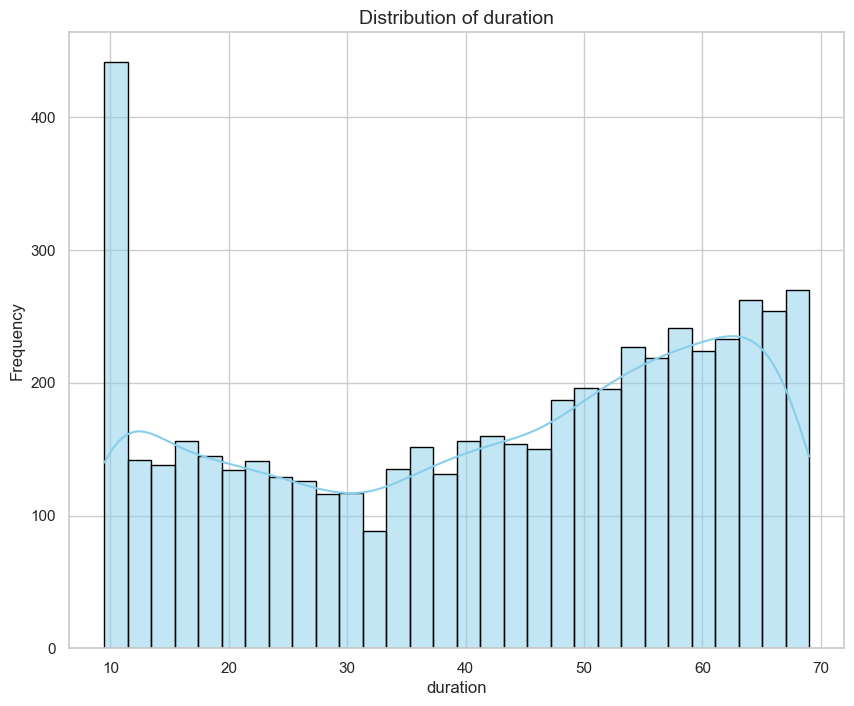

Visualizing campaign:


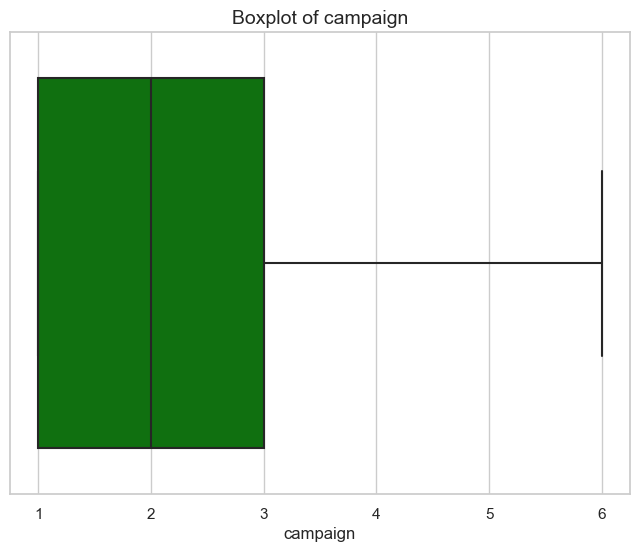

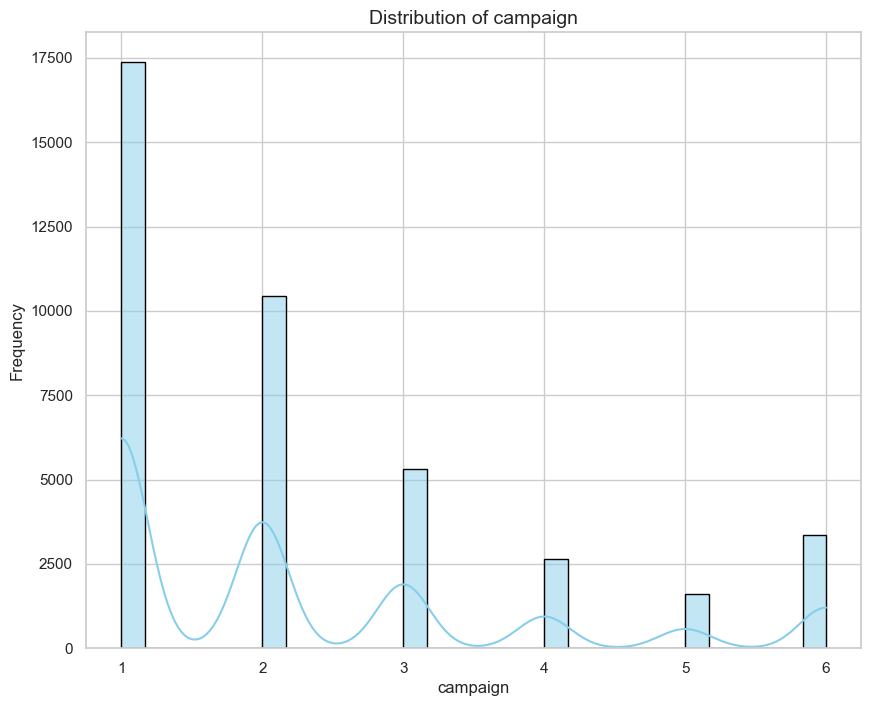

Visualizing previous:


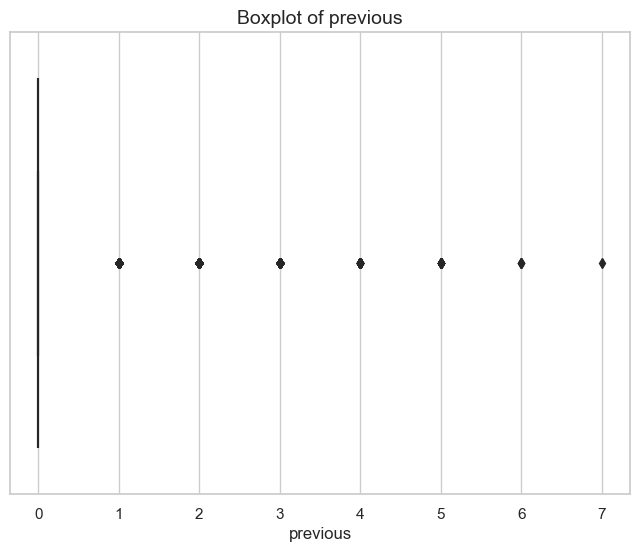

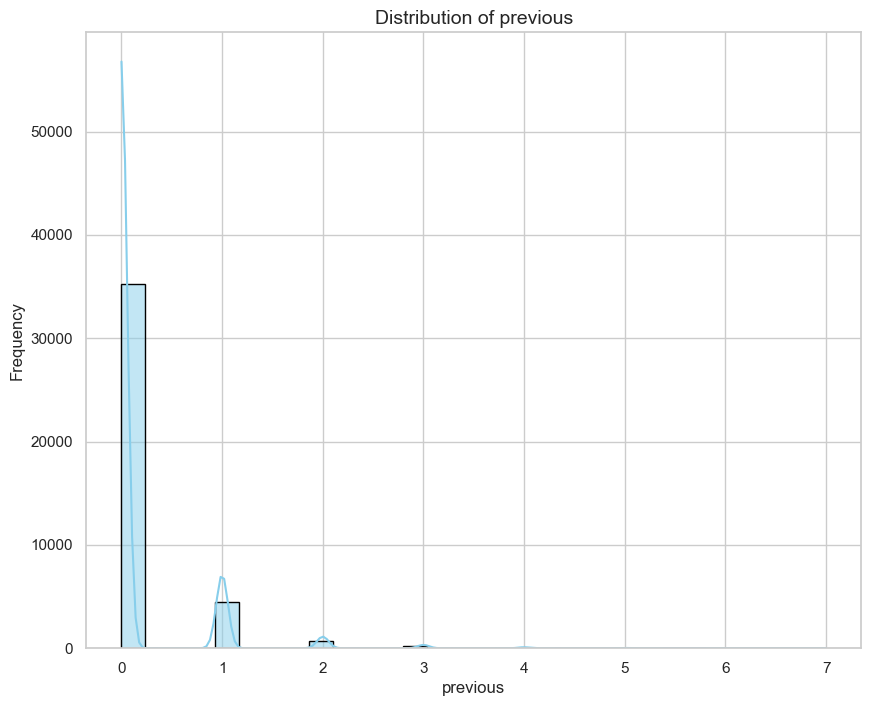

Visualizing employment_variation_rate:


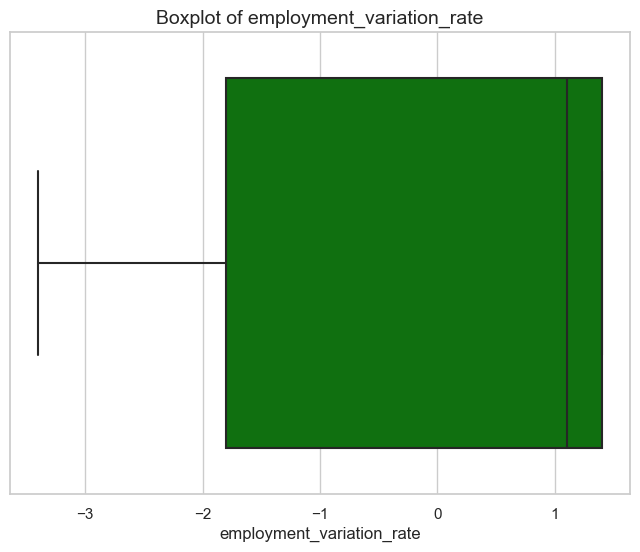

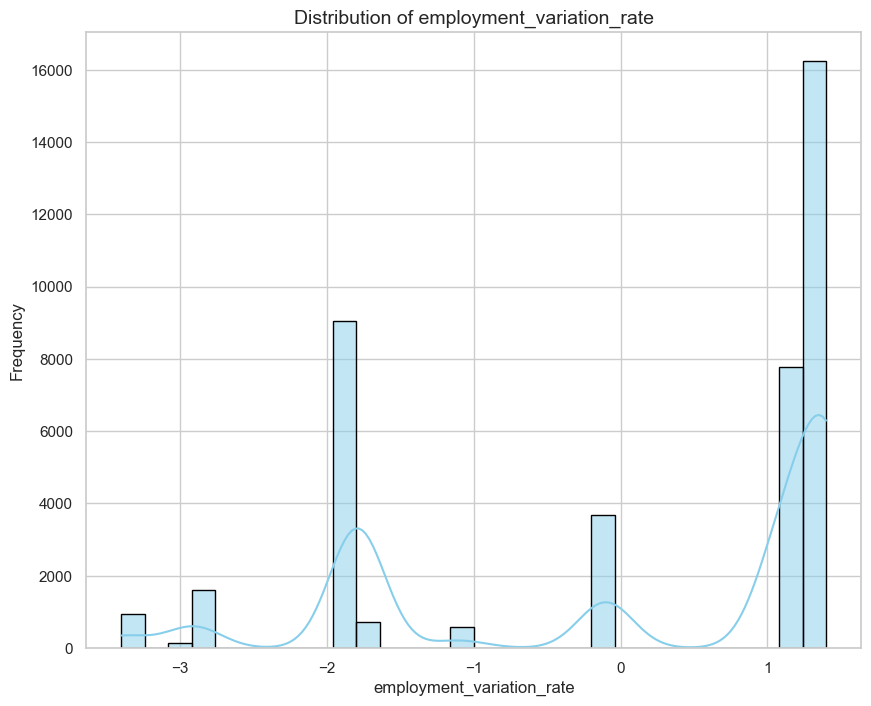

Visualizing consumer_price_index:


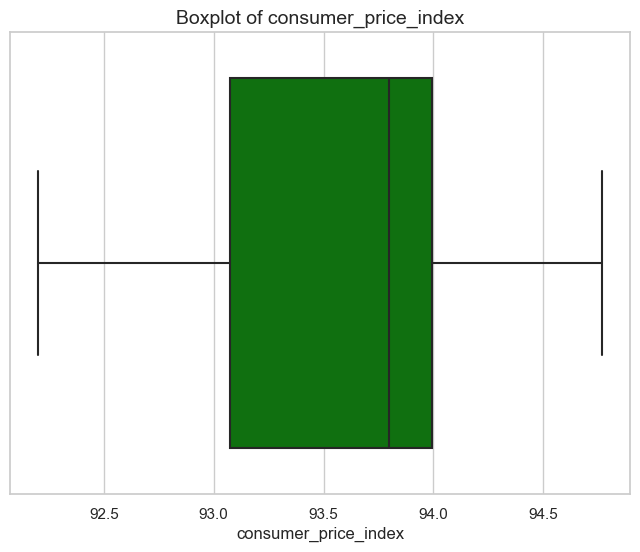

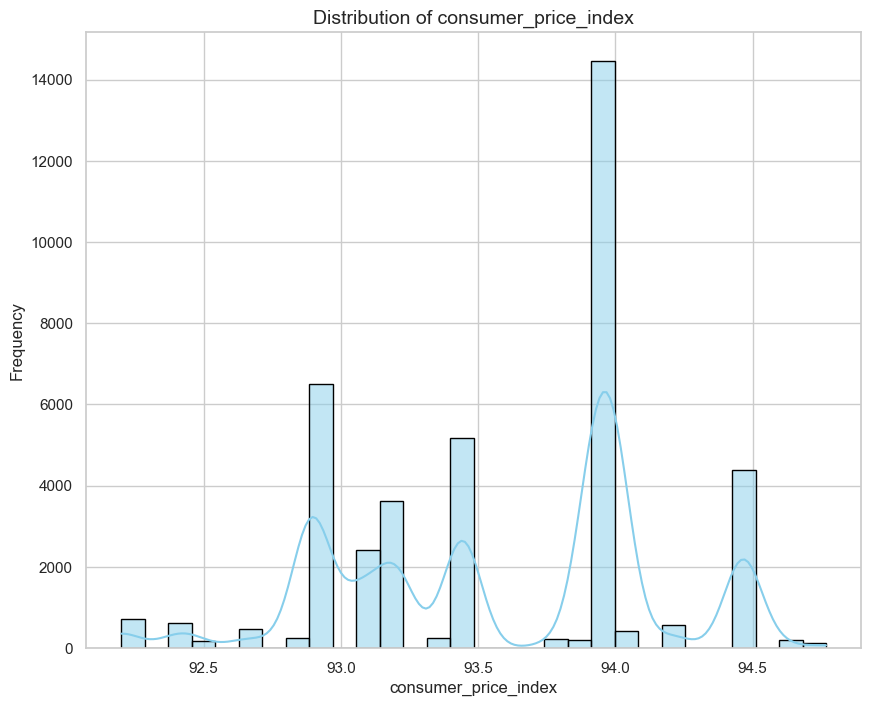

Visualizing consumer_confidence_index:


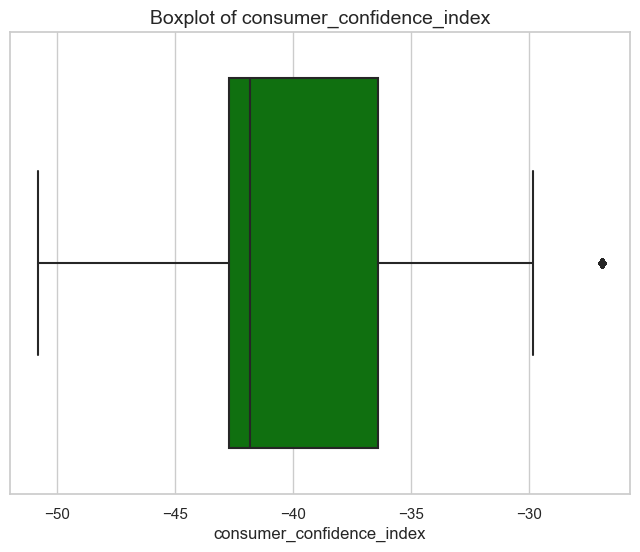

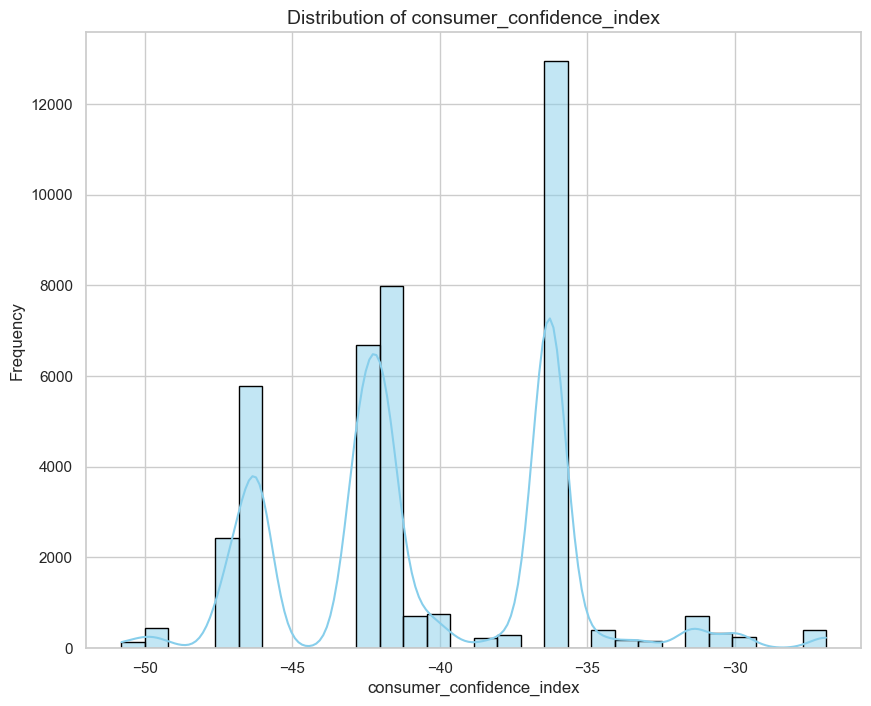

Visualizing euribor_3_month:


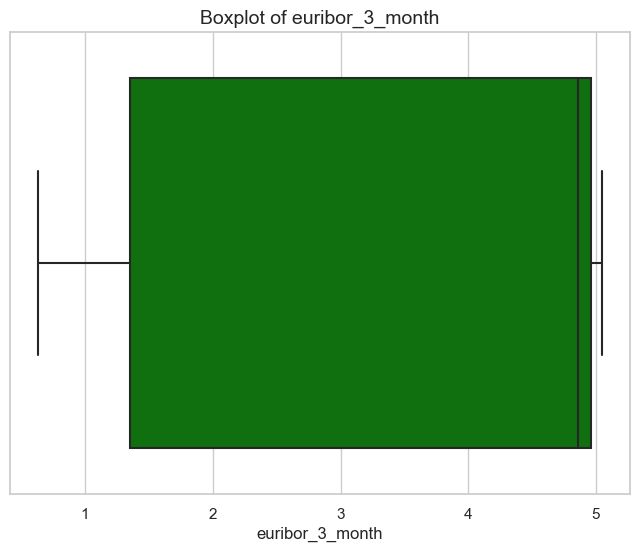

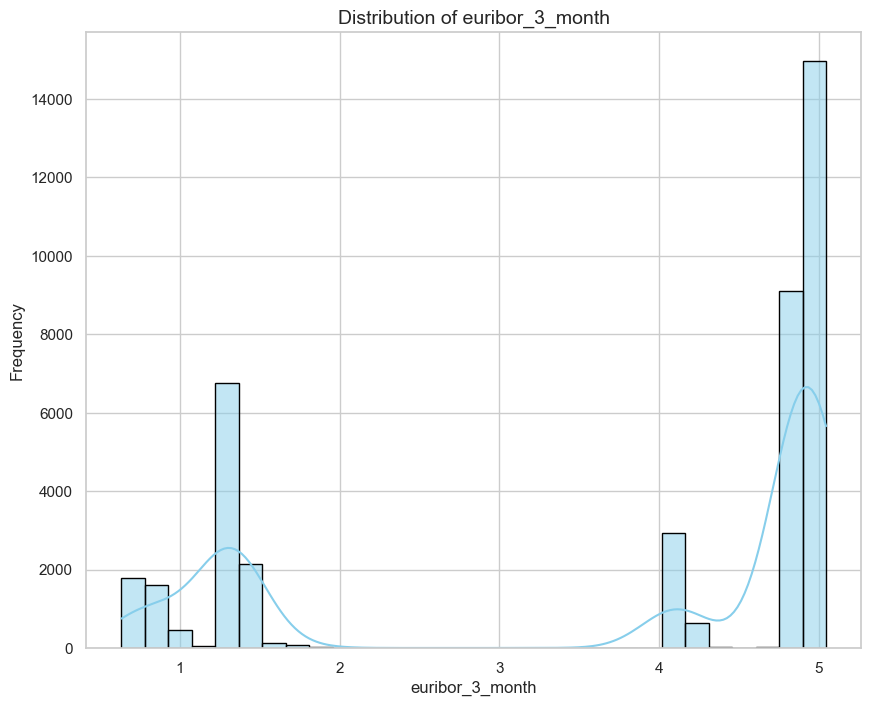

Visualizing number_of_employed:


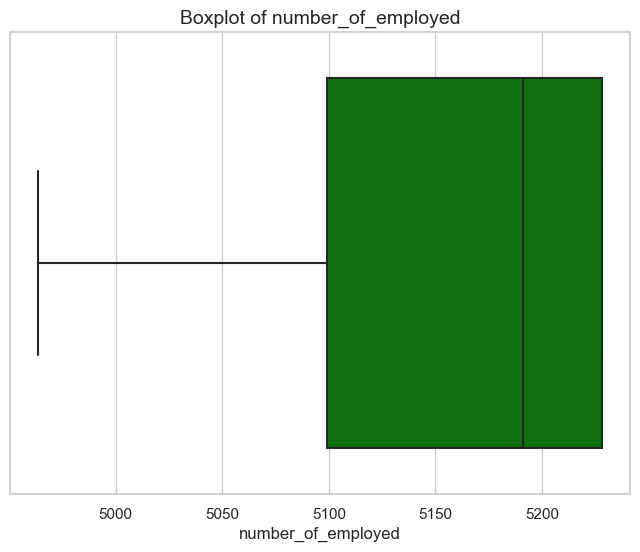

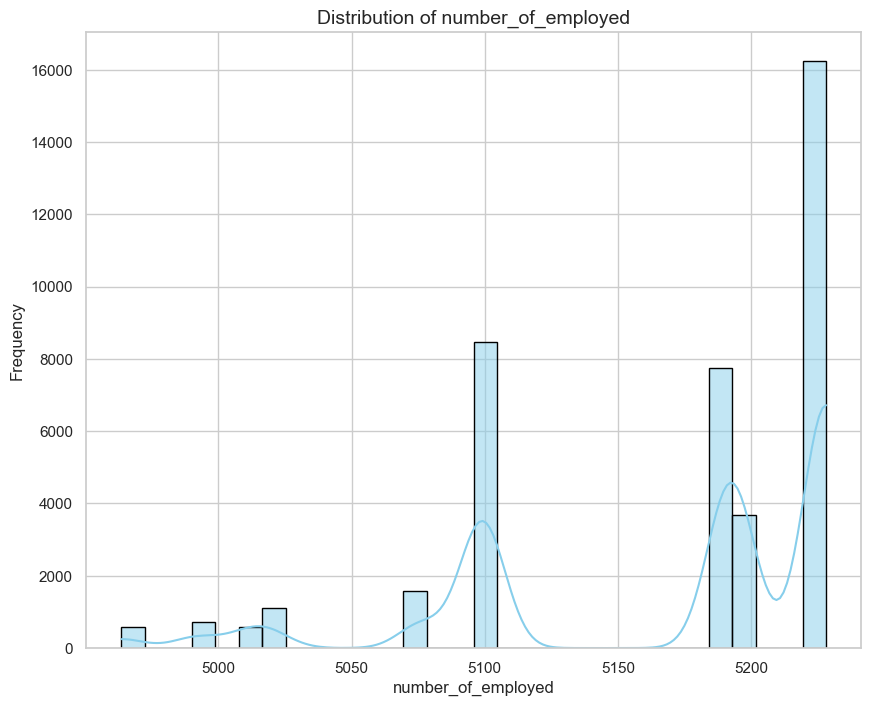

In [52]:
# List of numerical columns to visualize
numerical_features = df.select_dtypes(include=['int64', 'float64']).columns

# Plot boxplots and histograms for each feature
for feature in numerical_features:
    print(f"Visualizing {feature}:")
    box_plot(feature)  # Boxplot
    hist_plot(feature)  # Histogram


In [53]:
# check the categorical attributes
categorical_attributes = ['job','marital','education','default','housing','loan','contact','month','day_of_week','poutcome']

In [54]:
# defining a function to plot the categorical variables
def plot_categorical_variables(df, categorical_attributes):
    for col in categorical_attributes:
        plt.figure(figsize=(8,4))
        sns.countplot(x=col, data=df, palette='Set2', order=df[col].value_counts().index)
        plt.title(f'Distribution of {col}', fontsize=14)
        plt.xlabel(col.capitalize(), fontsize=12)
        plt.ylabel('Count',fontsize=12)
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

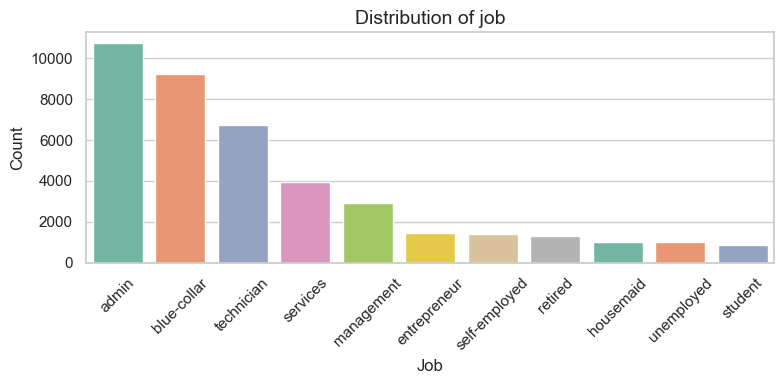

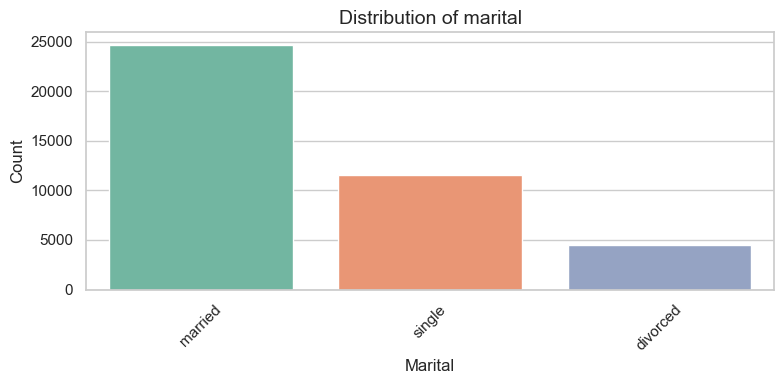

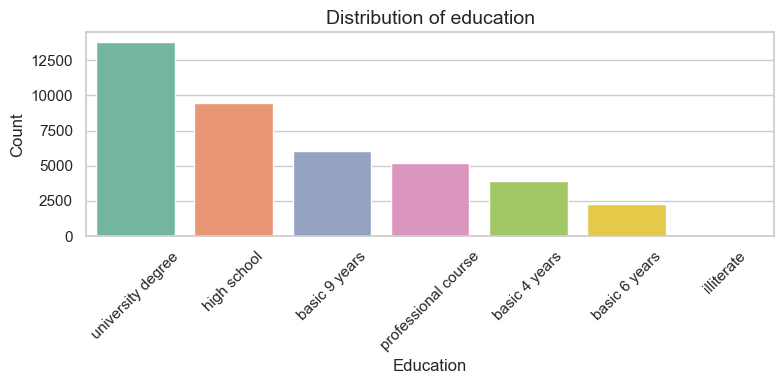

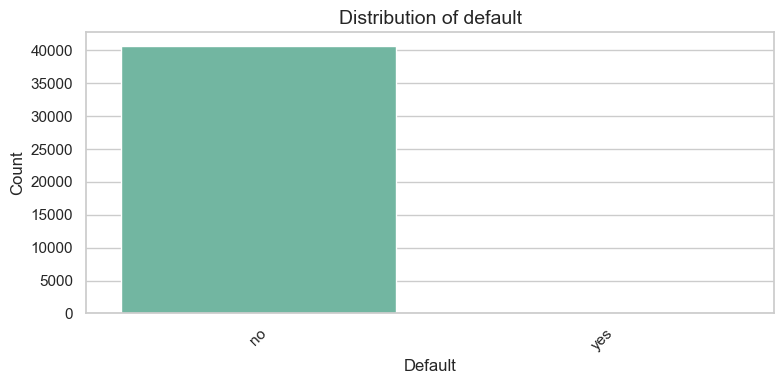

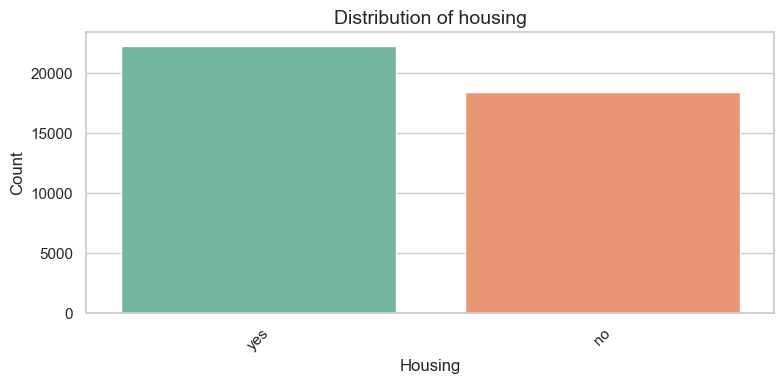

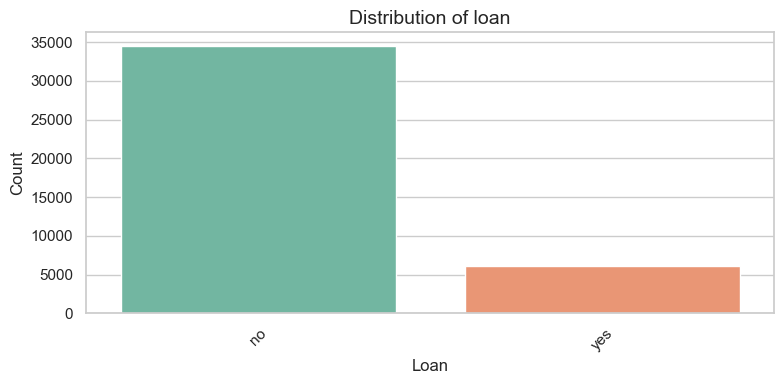

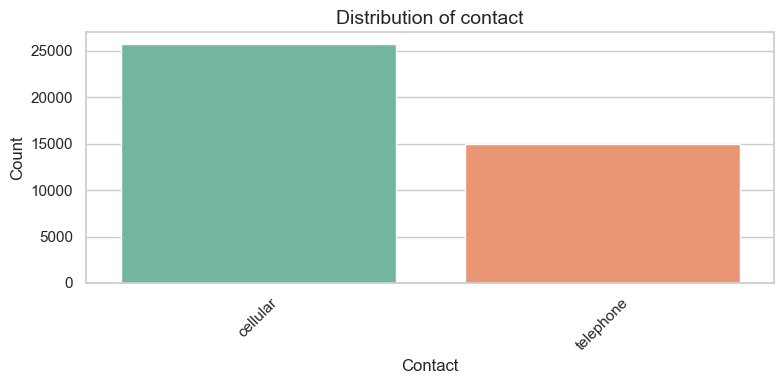

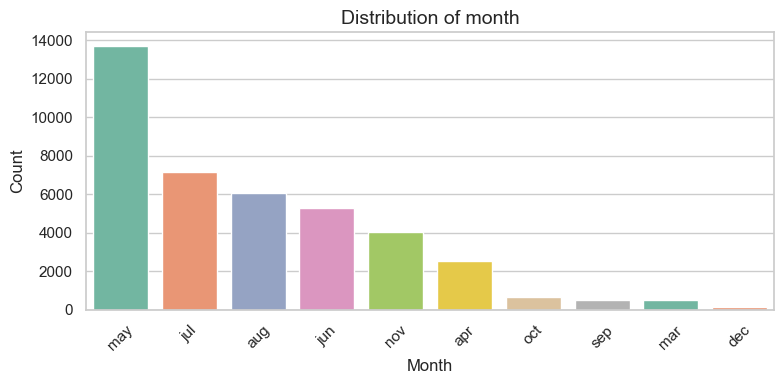

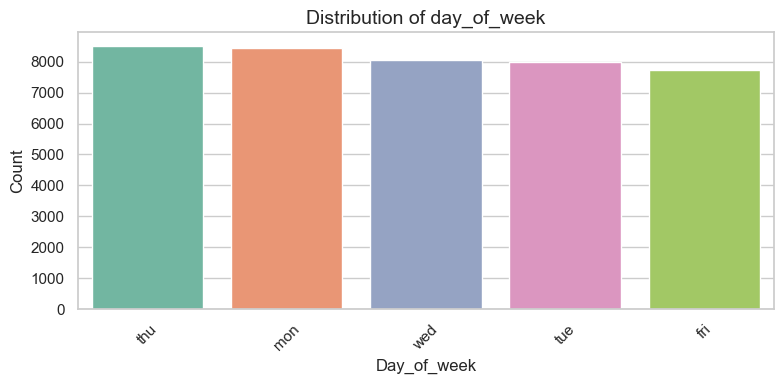

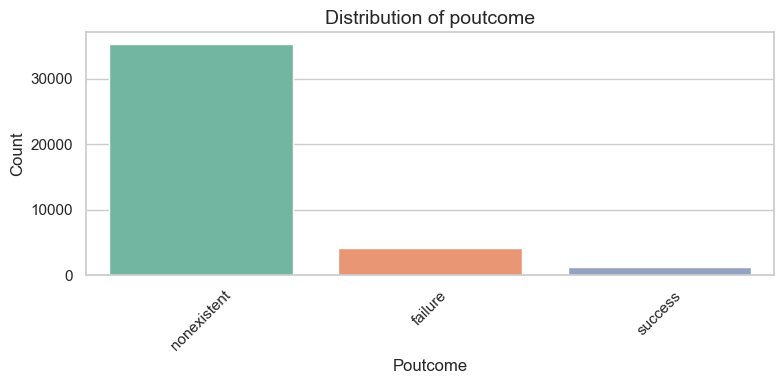

In [55]:
# calling out the function
plot_categorical_variables(df, categorical_attributes)

***Job Distribution*** - **Most Common Jobs**: The most prevalent job category is "admin." (25.3%), followed by "blue-collar" (22.5%) and "technician" (16.4%). **Less Common Jobs**: The least represented categories are "illiterate" and "unknown," which may warrant further investigation.

***Marital Status*** -  **Marital Breakdown**: The majority of individuals are "married" (60.5%), followed by "single" (28.1%) and "divorced" (11.2%). **Very Few Unknowns**: Only 80 respondents are categorized as "unknown," suggesting this is a minor issue.

***Education Levels*** - **Higher Education**: A significant portion of individuals hold a "university degree" (29.5%), with "high school" graduates making up 23.1%. Minimal Illiteracy: The "illiterate" category is negligible (0.04%), which could indicate a generally educated population.

***Default Status*** - **Low Default Rate**: A large majority (79.1%) have no default on their credit. The "yes" category is nearly non-existent (0.01%), indicating very few individuals with a history of default.

***Housing Loan Status*** - **Housing Loan Ownership**: More respondents have a housing loan ("yes" at 52.4%) than those who do not (45.2%), with a very small unknown category (2.4%).

***Personal Loan Status*** - **Loan Distribution**: A substantial majority (82.4%) do not have a personal loan, while a smaller proportion (15.2%) do. The "unknown" status is also small (2.4%).

***Contact Methods*** - **Preferred Contact**: Most contacts are made via "cellular" (63.5%), compared to "telephone" (36.5%), reflecting modern communication preferences.

***Monthly Contact Trends*** - **Contact Frequency**: The month of "May" has the highest contact count (33.4%), with "July" and "August" following. The months with the least contact are "December" (0.4%) and "March" (1.3%).

***Day of the Week*** - **Weekday Contact Patterns**: "Thursday" has the highest contact frequency (20.9%), followed closely by "Monday" and "Wednesday." There is a relatively even distribution across the days.

***Previous Outcome*** -  **Outcome Distribution**: The vast majority of previous outcomes are "nonexistent" (86.3%), with very few having a "success" (3.3%). This may indicate a low success rate in past campaigns

## **BIVARIATE ANALYSIS**

In [56]:
# defining a scatterplot function for numerical features for bivariate analysis
def plot_numerical_bivariate(df, numerical_columns):
    for i, col1 in enumerate(numerical_columns):
        for col2 in numerical_columns[i+1:]:
            plt.figure(figsize=(8,4))
            sns.scatterplot(x=col1, y=col2, data=df, palette='Set2')
            plt.title(f'{col1.capitalize()} vs {col2.capitalize()}', fontsize=14)
            plt.xlabel(col1.capitalize(), fontsize=12)
            plt.ylabel('Count', fontsize=12)
            plt.xticks(rotation=45)
            plt.tight_layout()
            plt.show()

numerical_columns = ['age', 'duration', 'campaign', 'previous', 'employment_variation_rate', 'consumer_price_index', 'consumer_confidence_index', 'euribor_3_month', 'number_of_employed']

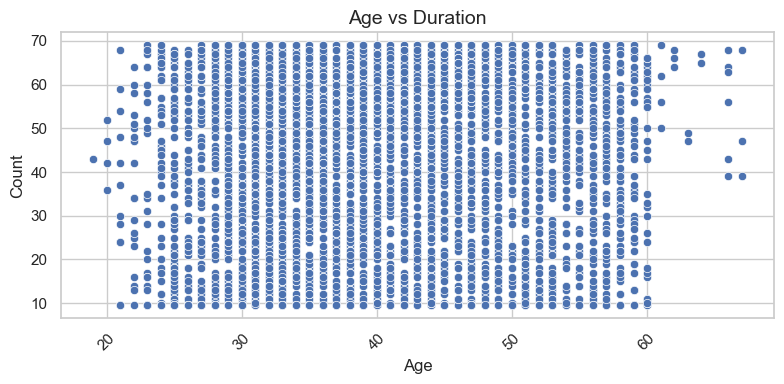

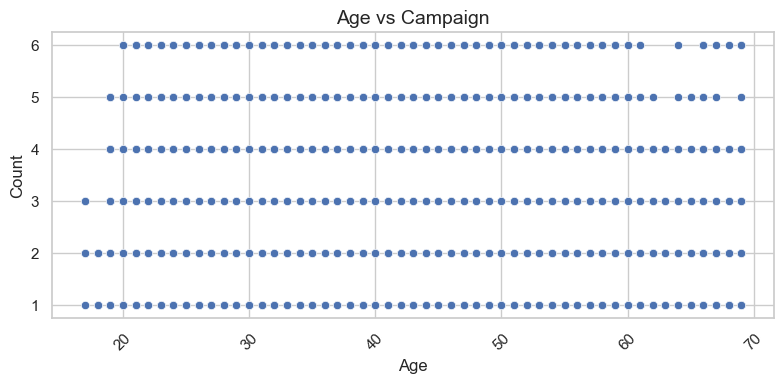

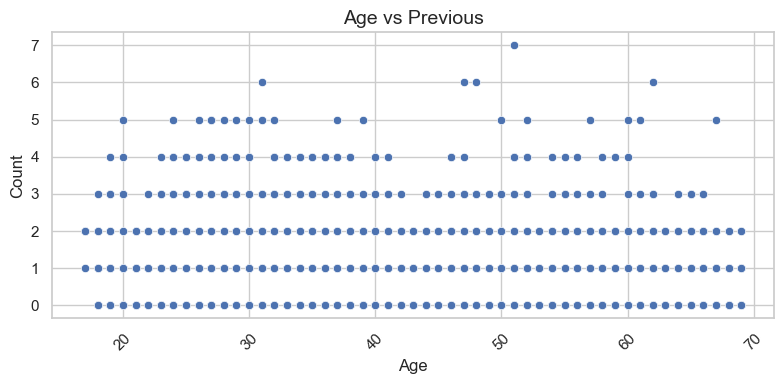

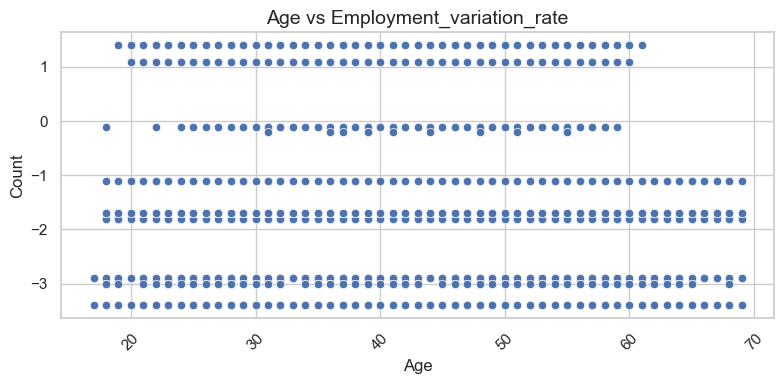

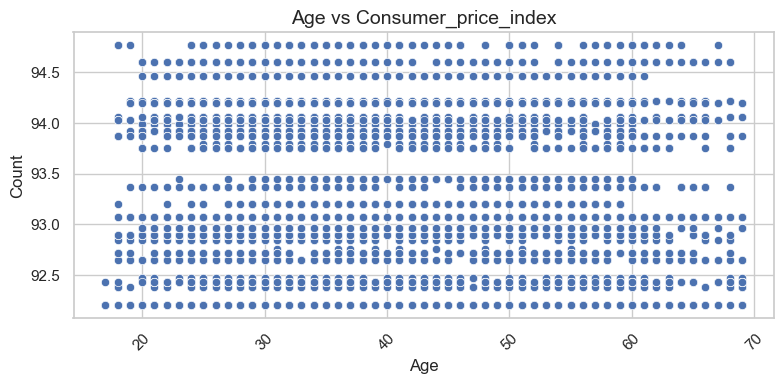

...

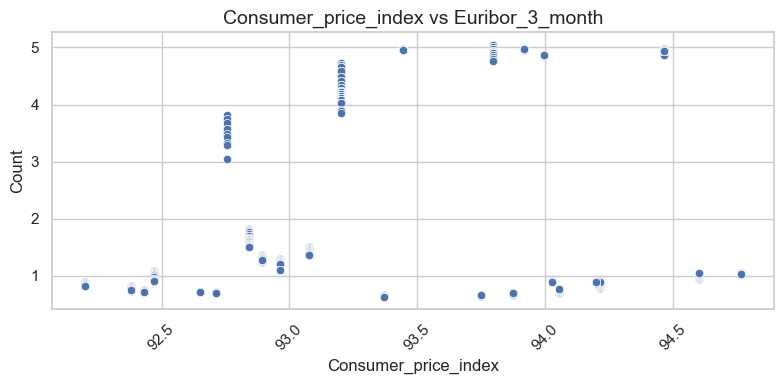

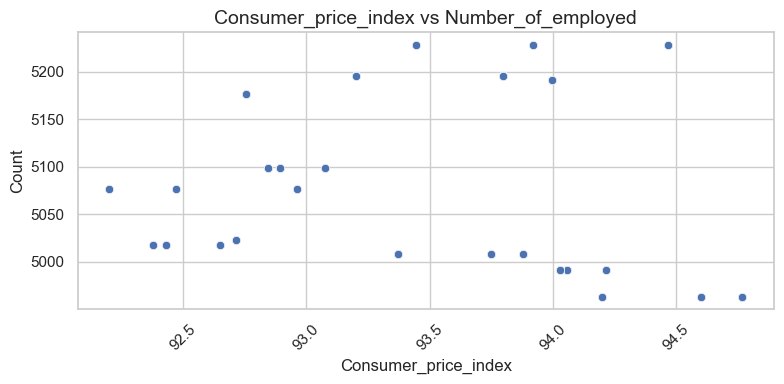

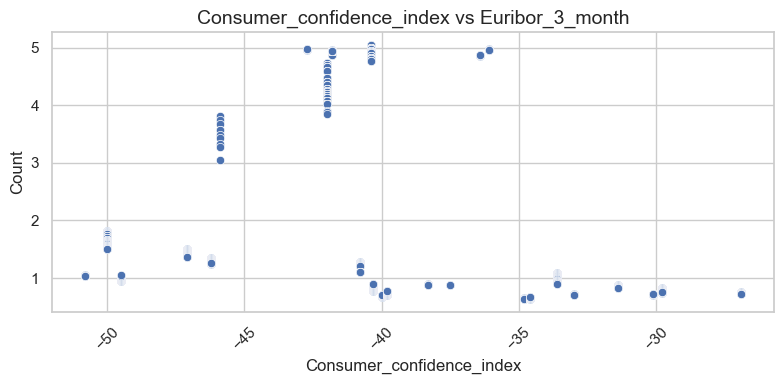

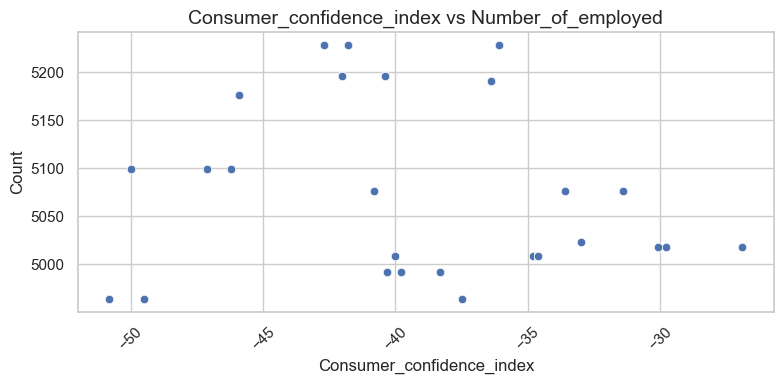

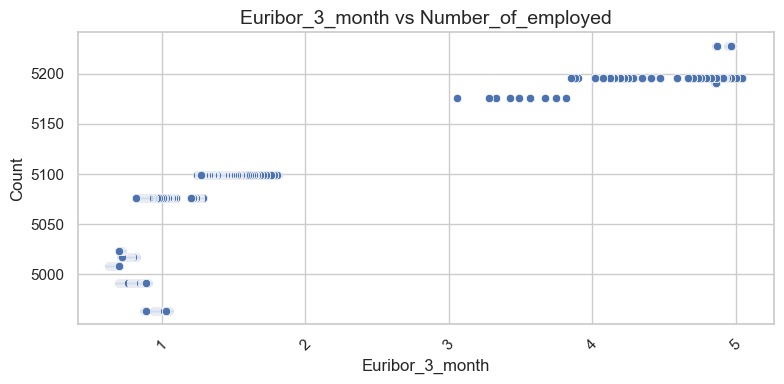

In [57]:
# calling the plot_scatter_all_numeric function
plot_numerical_bivariate(df, numerical_columns)

In [58]:
# defining a correlation matrix function for the numerical features for bivariate analysis
def plot_numeric_heatmap(df, numeric_columns):
    plt.figure(figsize=(10,8))
    corr_matrix = df[numeric_columns].corr()
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
    plt.title('Correlation Heatmap for Numeric Variables', fontsize=16)
    plt.tight_layout()
    plt.show()

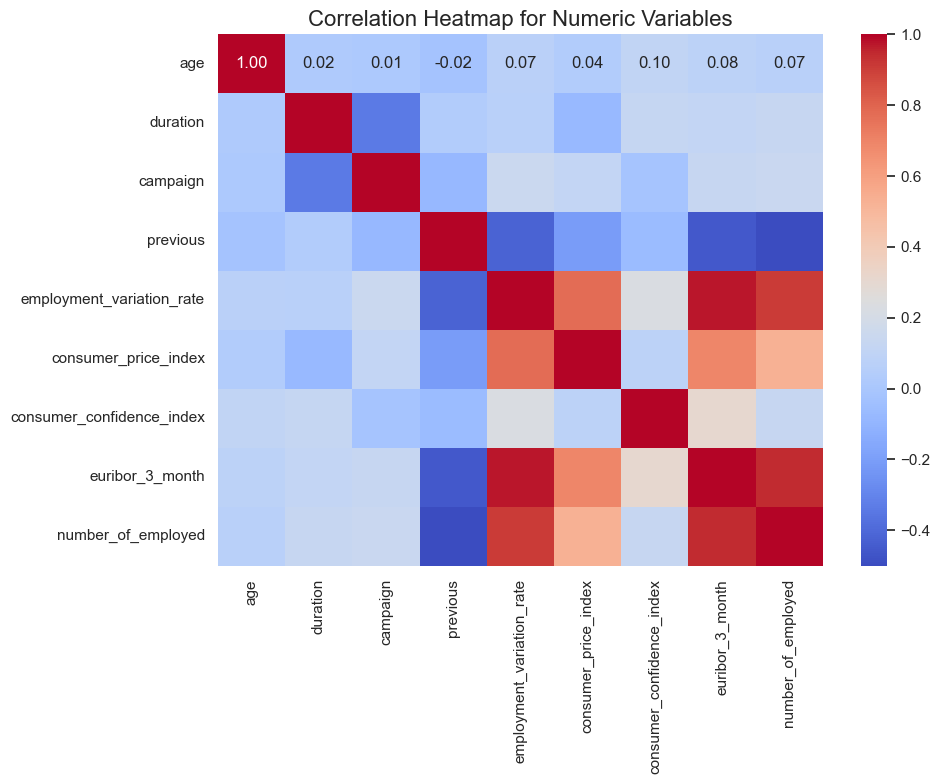

In [59]:
# calling out the plot_numeric_heatmap function
plot_numeric_heatmap(df, numerical_columns)

From the correlation matrix we can see that there are multiple correlations -
1. strong relationship between Employment Variation rate and Consumer Price index
2. Euribor 3 month and Number of Employed
3. We can also see some positive correlation between pdays and previous

In [60]:
# # Define a function to plot bivariate analysis for categorical features
def plot_categorical_bivariate(df, categorical_columns):
    for i, col1 in enumerate(categorical_columns):
        for col2 in categorical_columns[i+1:]:
            plt.figure(figsize=(8,4))
            sns.countplot(x=col1, hue=col2, data=df, palette='Set2')
            plt.title(f'{col1.capitalize()} vs {col2.capitalize()}', fontsize=14)
            plt.xlabel(col1.capitalize(), fontsize=12)
            plt.ylabel('Count', fontsize=12)
            plt.xticks(rotation=45)
            plt.tight_layout()
            plt.show()

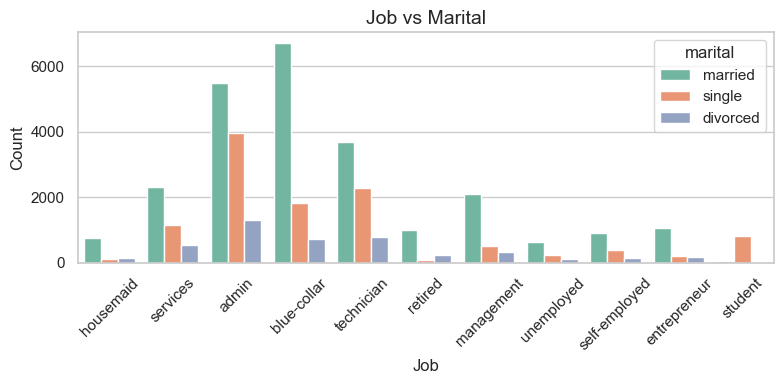

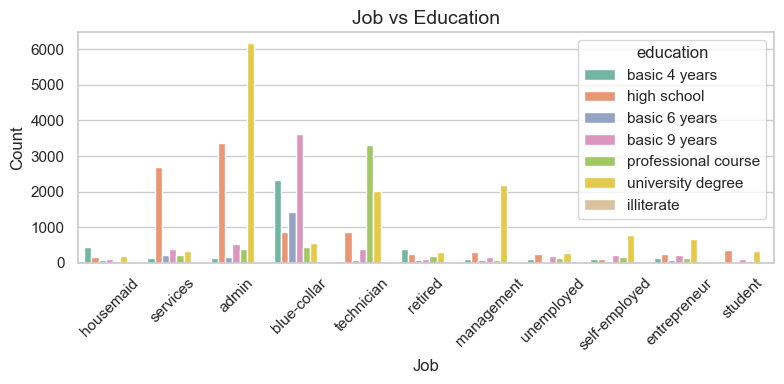

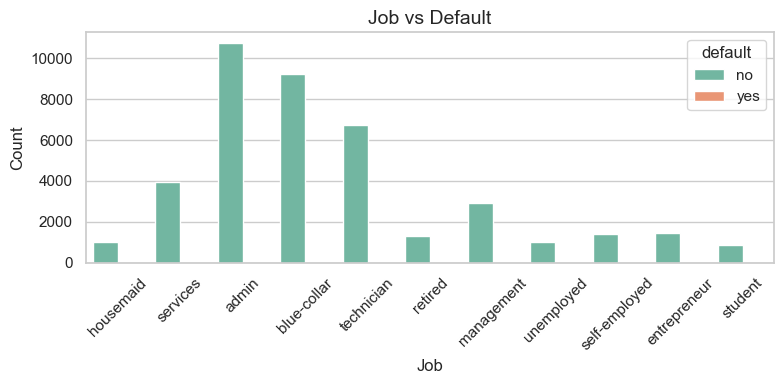

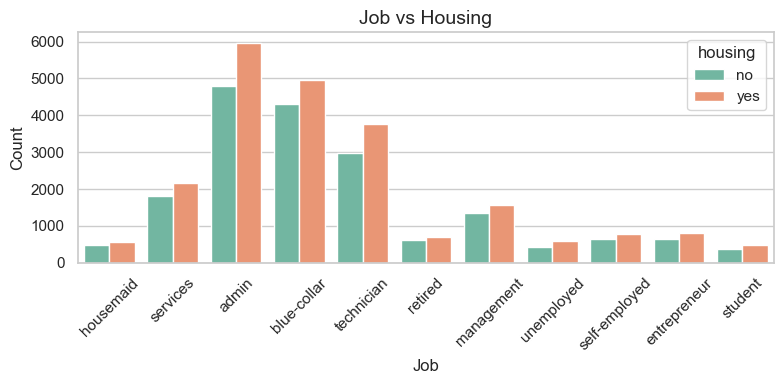

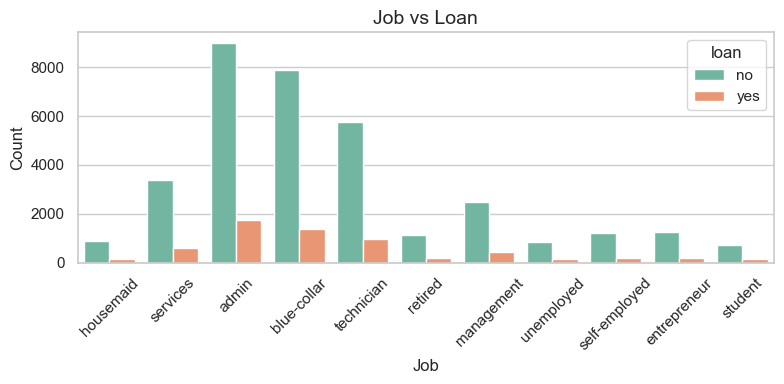

...

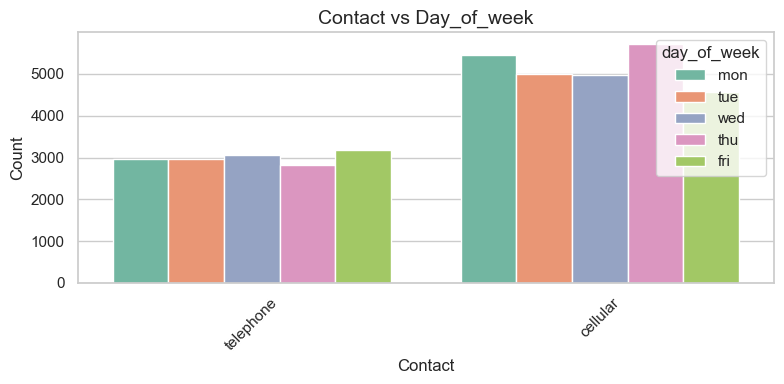

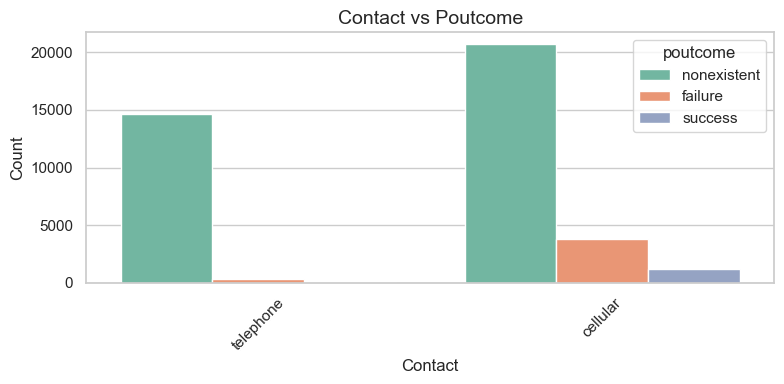

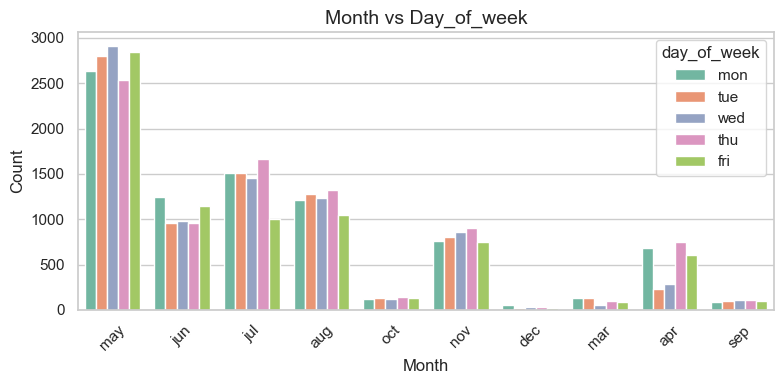

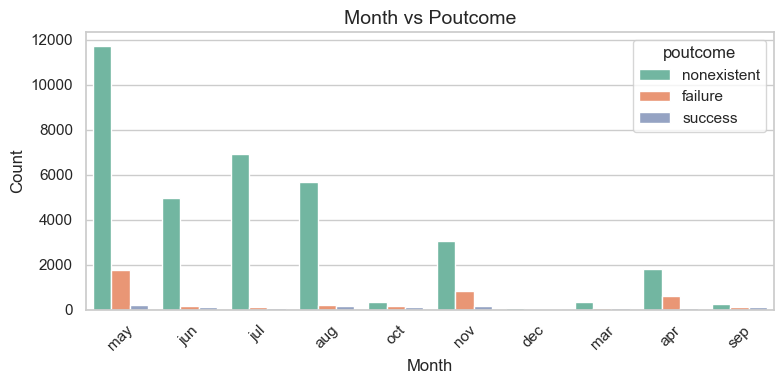

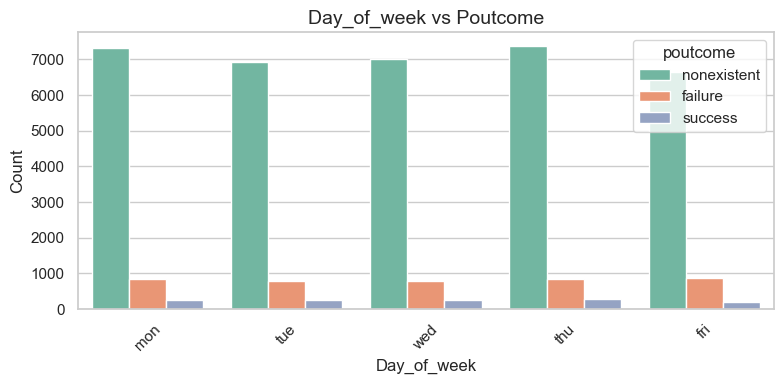

In [61]:
# calling out the plot_categorical_bivariate function
plot_categorical_bivariate(df, categorical_attributes)

***Job vs Marital***

**Marital Status Distribution**: The majority of individuals across all job types are either married or single.
The divorced category is less populated compared to the other two, and the unknown status also appears infrequently.

**Type Insights**:

**Administrative Roles**: This job type has the highest number of married individuals (5,253), suggesting stability or longevity in these positions.

**Blue-Collar Jobs**: This category has a high number of married (6,687) and single (1,825) individuals, indicating a possibly younger workforce that is still building their careers or lives.

**Management**: A significant number of married individuals (2,089) also indicates that management positions may attract or retain people in stable personal situations.

**Student**: The student category has a notable number of single individuals (824), which is expected as students are often in transitional life stages.


***Job Vs Education*****

**Educational Attainment**: The highest educational level observed is university degree, particularly prevalent among roles such as admin and management.
The basic education levels (4y, 6y, 9y) dominate among job types like blue-collar and housemaid.

**Job Type Insights**

**Admin Roles**: A significant number of individuals with a university degree (5,753) indicates a highly educated workforce in administrative positions, suggesting that these roles require higher education.

**Blue-Collar Jobs**: A mix of educational backgrounds is evident, but the numbers for basic education levels are high, with 2,318 individuals having only basic.4y education.

**Technician**: This job type has a notable number of individuals with professional courses (3,320), indicating that specialized training is important in this field.

***Job Vs Default***

**"Default"** typically refers to whether an individual has defaulted on a loan or credit obligation. A "yes" value indicates that the individual has defaulted, while "no" indicates that they have not, and "unknown" signifies that the information about default status is not available.

**Overall Default Rates**: The dataset shows that the majority of individuals across job types do not have a default status, as indicated by the high counts in the "no" column.

**Job Type Analysis**:

**Blue-Collar Workers**: This category has a significant number of individuals who have not defaulted (6,088), but the number of those marked as "unknown" (3,166) is quite high. This might suggest a lack of information or potential financial instability within this group.

**Administrative Roles**: Similarly, admin roles show a low count of defaults (9,129) and no individuals marked as "yes," indicating financial stability in this job sector.

**Technician Jobs**: This job type has a moderate number of defaults (2) but also a notable count of "unknown" statuses (976), indicating potential gaps in data collection or financial issues.

**Students and Unemployed**: Both categories have very low default counts. This might reflect the financial challenges students face, as they may not have taken on significant debt yet.


***Job Vs Housing***

**Overall Housing Stability**: The majority of individuals across most job types have housing stability ("no"), but a notable number also have "yes" responses, indicating a range of housing situations.

**Job Type Analysis**:

**Administrative Roles**: A high number of individuals (4,636) have stable housing, but 5,559 have "yes," suggesting that many in admin roles may rely on housing support or subsidies.

**Blue-Collar Workers**: This group has a balanced number of stable housing individuals (4,304) but also a substantial count in "yes" (4,710). The "unknown" count (240) is relatively low, indicating more reliable data for this job type.

**Technician Jobs**: This job type shows a significant number of stable housing (2,980) and a very high count of "yes" (3,616), suggesting that many technicians may have housing support or benefits that help them secure stable housing.

**Students**: With 381 having stable housing and 471 indicated as "yes," students may face challenges in housing stability, as many are likely living in temporary or shared arrangements.

**High Counts of "Yes"**: Sectors like services (2,050) and technician (3,616) show a higher count of individuals affirming they have housing, which could indicate support programs or communal living arrangements that provide housing assistance.


***Job Vs Loan***

**Overall Loan Status**: The majority of individuals across most job types have not taken out loans ("no"), but there is also a significant number who have ("yes"). This suggests varying financial behaviors and needs across different job categories.

**Job Type Analysis**:

**Administrative Roles**: A high number of individuals (8,485) have not taken out loans, while 1,710 have, indicating that some may rely on loans for larger expenses, potentially due to lifestyle choices or financial needs.

**Blue-Collar Workers**: This group has a significant count of non-loan holders (7,648) but also a substantial number of individuals with loans (1,366). This may reflect a common need for financing in this sector, possibly for housing or vehicle purchases.

**Technician Jobs**: This job type shows a high number of non-loan holders (5,607) and a notable count of those with loans (989), suggesting that while many technicians manage without loans, a significant portion may be using loans for investments or purchases.

**ervices Sector**: With 3,267 individuals without loans and 601 with loans, this sector might show a trend towards more financial stability, although loans are still prevalent.

Sectors such as admin and services show significant numbers of individuals with loans. This could indicate a reliance on credit for significant purchases, suggesting that financial education or support might be beneficial.

***Job Vs Contact***

**Overall Contact Preferences**: The majority of individuals across all job types primarily use cellular contact. This reflects broader trends in society where mobile phones have largely replaced landline telephones for personal and professional communication.

**Job Type Analysis**:

**Administrative Roles**: This job category has a high number of cellular contacts (7,126) compared to telephone contacts (3,296), indicating a preference for mobile communication likely due to flexibility and accessibility.

**Blue-Collar Workers**: A significant number of blue-collar workers also prefer cellular contacts (5,090), although telephone usage (4,164) is notably high as well. This could suggest a mix of communication styles, possibly due to varying levels of technology access.

**Technician Jobs**: Technicians show a strong preference for cellular contact (4,637) over telephone (2,106), aligning with the tech-savvy nature of this job sector.

**Students**: This group has a moderate count for cellular (671) but relatively low for telephone (204), which is typical for younger demographics that often favor mobile communication.

**Low Telephone Usage**: Across all job types, telephone usage is relatively low compared to cellular contact. This trend highlights the diminishing role of traditional landlines in modern communication.

***Job Vs Month***

**Seasonal Trends**:

**Peak Months**:

**April**: The admin job category shows a notable number (644), while blue-collar and technician roles also see significant activity (565 and 368, respectively). This might suggest a seasonal uptick in hiring or engagement during this month.

**July**: A high number of transactions for both admin (1,815) and blue-collar (1,789) workers indicates that summer might be a busy period, potentially due to seasonal employment or project ramp-ups.
May: The services sector stands out with 1,666, suggesting a spike in service-related activities leading into summer.

**Low Activity Periods**:

**December**: Generally low counts across job categories, especially for blue-collar (12) and entrepreneur (1), suggesting a drop in activity likely due to holidays and year-end closures.

**August**: Mixed results, with blue-collar showing 582 but several job types like entrepreneur and housemaid reporting very low counts (74 and 208, respectively), which might indicate a typical vacation period.

***Job Type Analysis***:

**Admin Jobs**: Consistently high activity across most months, particularly in April and July. This role likely involves ongoing processes that sustain engagement throughout the year.

**Blue-Collar Workers**: Peaks in July and May indicate a strong link to seasonal work, perhaps driven by agriculture or construction projects.

**Service Sector**: Highest engagement in May suggests that service-oriented roles see a lot of activity during the spring, possibly linked to tourism or events.

**Retired and Self-Employed**: More stable but lower overall engagement compared to other job types, indicating less variability in their activities.

***Job Vs Day of Week***

**Weekly Trends**:

**Admin Jobs**: The activity is fairly consistent throughout the week, with a slight peak on Thursday (2,153) and Monday (2,149), suggesting a strong start to the week and sustained engagement through to Thursday.

**Blue-Collar Workers**: Activity is highest on Wednesday (1,969), indicating mid-week productivity, with lower numbers on Tuesday (1,771).

**Management**: Similar to admin roles, management sees higher activity early in the week, peaking on Monday (640).

**Technician Roles**: The highest activity is noted on Thursday (1,494), indicating possible project completions or evaluations towards the week's end.

**Lower Activity Days**:

**Entrepreneurs and Housemaids**: Both job categories report relatively low interactions overall, with entrepreneurs peaking slightly on Monday (322) and housemaids on Tuesday (238).


Monday and Thursday are strong days for most job types, suggesting these are optimal days for engagement or action.

Friday tends to show a drop in activity across several categories, which might indicate winding down for the weekend.

***Job Vs Poutcome***

**Success Rates:** The admin job category has a notable success rate with 428 successful outcomes, but the number of failures (1,091) suggests there is room for improvement.

For blue-collar workers, the success is considerably lower, with only 119 successful outcomes compared to 886 failures.

Retired individuals show a higher success rate (158), which could suggest more effective targeting or higher receptiveness among this group.
Failures and Nonexistent Outcomes:

The nonexistent outcomes (e.g., marketing not reaching individuals) are significantly high across all categories, particularly in admin (8,903) and blue-collar (8,249) jobs, indicating potential issues with targeting or communication strategies.

The entrepreneur category has a high number of nonexistent outcomes relative to successes, highlighting challenges in engagement or awareness.

**Comparative Success**: Technicians report 211 successful outcomes, suggesting that this group is relatively more responsive to previous marketing efforts compared to other job categories.

The services sector has 70 successful outcomes, suggesting moderate engagement but also a high count of nonexistent outcomes (3,451).


***Martial Vs Education***

**Married Individuals**: The married group has the highest numbers across nearly all education categories, particularly:

**University Degree: 6,394 individuals, indicating a strong correlation between marriage and higher education.

**High School**: 5,158, suggesting that a significant portion of married individuals have completed secondary education.

The numbers are notably high for basic education levels as well, reflecting that many married individuals possess foundational educational qualifications.

**Divorced Individuals**: Divorced individuals also show a substantial presence in educational attainment, especially in:

**Basic 9 years**: 565 individuals, which suggests that a notable number have completed secondary education but not beyond.

**High School**: 1,193 individuals, indicating that many divorced individuals have at least completed secondary education.

**Single Individuals**: Single individuals have a varied educational distribution but show high numbers in:

**Basic 9 years**: 1,316 individuals, indicating a common level of education for this group.

**University Degree**: 4,406 individuals, which suggests that many single individuals are pursuing or have achieved higher education, possibly due to a focus on career advancement.

In [62]:
# Define a function to plot bivariate analysis for categorical vs numeric variables
def plot_categorical_numerical_bivariate(df, categorical_columns, numeric_columns):
    for cat_col in categorical_columns:
        for num_col in numeric_columns:
            plt.figure(figsize=(8,4))
            sns.barplot(x=cat_col, y=num_col, data=df, palette='Set1')
            plt.title(f'{cat_col.capitalize()} vs {num_col.capitalize()}', fontsize=14)
            plt.xlabel(cat_col.capitalize(), fontsize=12)
            plt.ylabel(num_col.capitalize(), fontsize=12)
            plt.xticks(rotation=45)
            plt.tight_layout()
            plt.show()

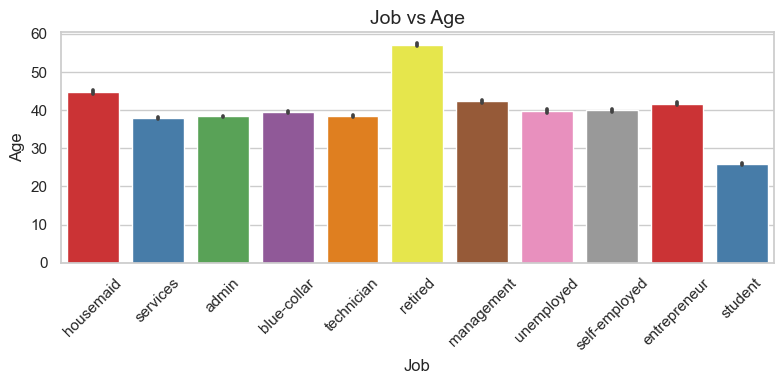

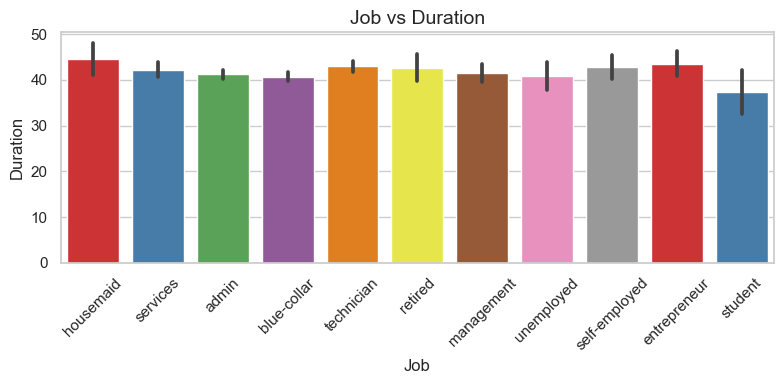

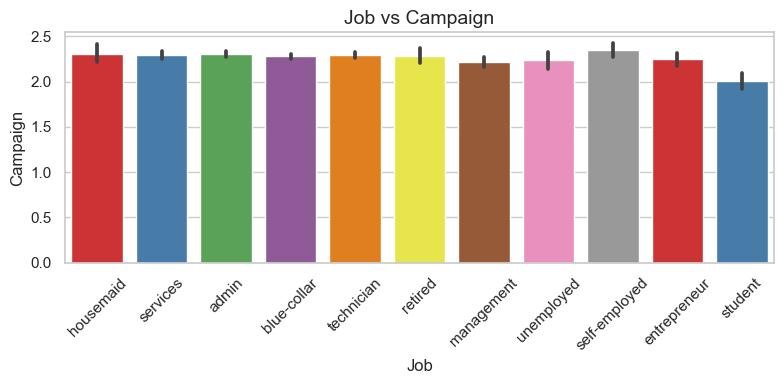

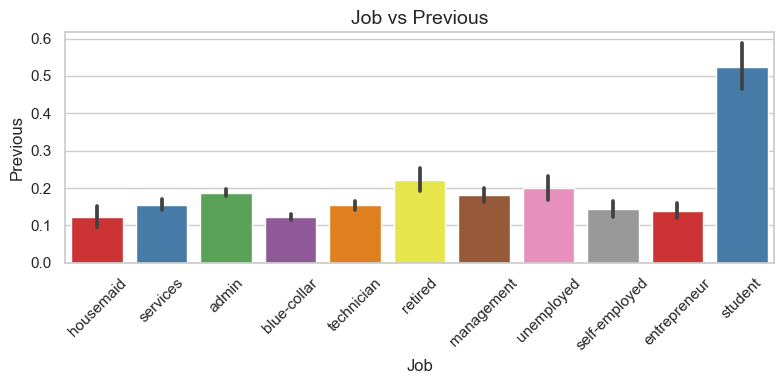

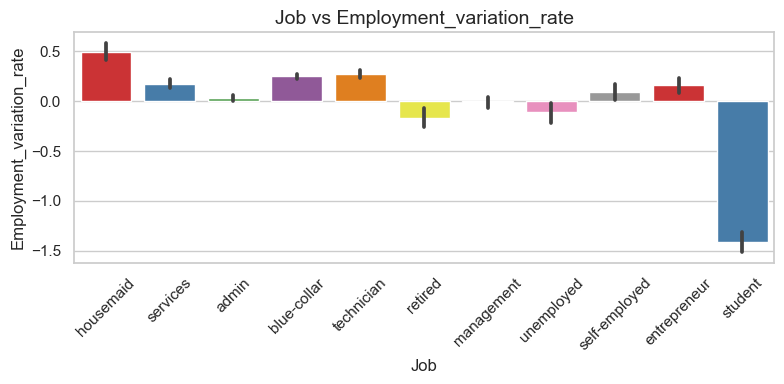

...

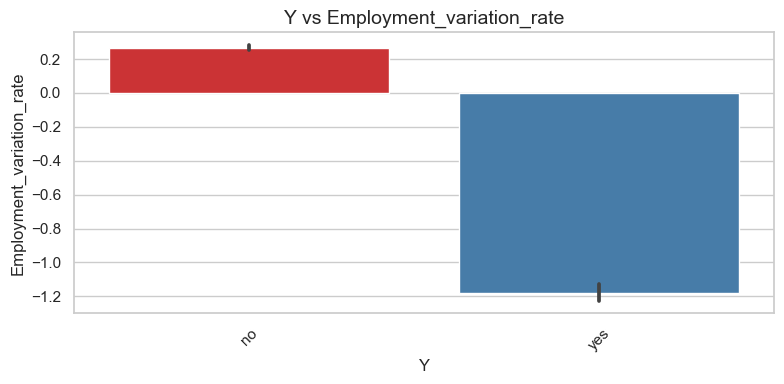

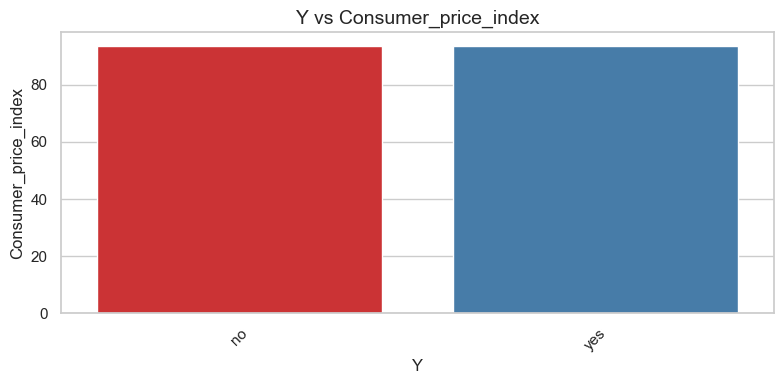

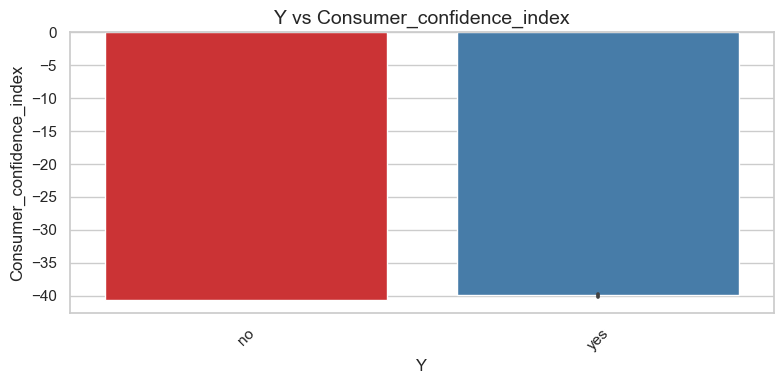

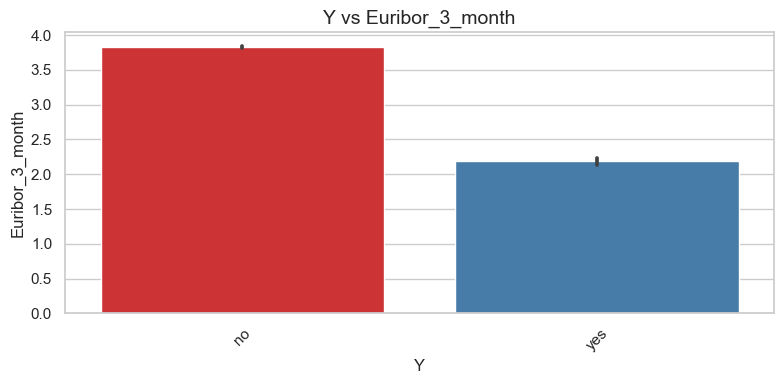

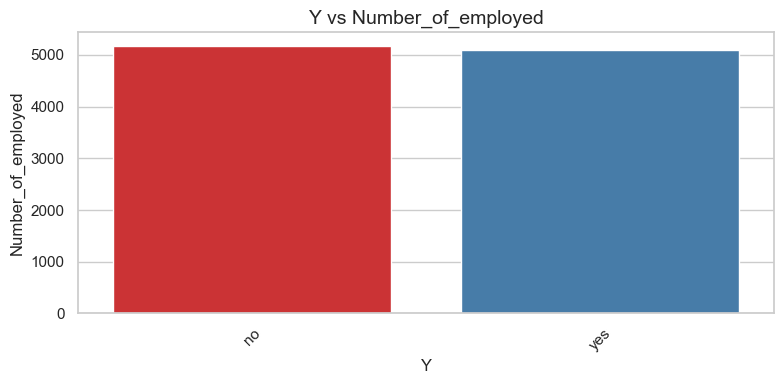

In [63]:
# calling out the plot_categorical_numerical_bivariate function
plot_categorical_numerical_bivariate(df, categorical_columns, numerical_columns)

1. ***Job Vs Age***

**Administration (Admin)**: The age group 25-34 shows a significant concentration of individuals (158 aged 25, 206 aged 26), suggesting that admin jobs are popular among young adults in their mid-20s.
There are no entries for ages 17-19.

**Blue-Collar Workers**: Similar to admin roles, the blue-collar workforce peaks in the 25-34 age range with 134 individuals aged 25 and 150 aged 26.
Younger age groups (17-24) show some presence, but these roles seem to be more common among adults in their late 20s and early 30s.

**Entrepreneurs**: Entrepreneurial roles start appearing more noticeably at age 20, with small numbers up to age 29, but show a rapid decline afterward. This suggests that many entrepreneurs begin their ventures in their early 20s.

This group might have more variability and could benefit from targeted support programs for young business owners.

**Housemaids**: The age distribution for housemaids is quite low, with the most significant numbers seen in the mid-20s (6 aged 25) and a few in older age groups. This could indicate high turnover in these positions or less long-term employment.

**Management**: Management roles start appearing in the mid-20s but show a plateau. There are very few individuals in management roles at younger ages, indicating that it typically requires more experience.

**Retired Individuals**: The data shows a gradual increase in the number of retired individuals from around age 65 onward, with a peak in ages 80-84 (10 individuals). This aligns with general retirement age trends.

**Students**: A significant number of students are in the 18-24 age range, reflecting typical educational paths. There are fewer students beyond age 25, likely due to transitions into the workforce.

**Technicians and Services**: Technicians have a moderate distribution in the 20s and early 30s, while services show a broader age distribution, peaking around 30-34.

**Unemployed and Unknown**: Unemployment appears concentrated in the younger age groups (20-34), with higher numbers in the mid-20s, suggesting economic challenges in this demographic.
The "unknown" category also has minimal presence across ages, indicating either a lack of data or classification issues.

2. ***Job Vs Duration***

**Short Call Durations (0-9 seconds)**: The majority of calls for many job types fall within the very short duration range (0-9 seconds), indicating a significant number of initial outreach attempts that may not lead to substantive conversations.

For instance, admin has a notable count of calls lasting 8-9 seconds (22 calls), suggesting these calls might have been cut short or not fully engaged.

**Longer Call Durations**: As the call duration increases, the frequency of calls generally decreases across all job types, indicating that longer conversations are less common. For example, in the services category, there are peaks around the 7-9 seconds range, but significantly fewer calls reach durations beyond 10 seconds.

**Blue-Collar and Admin Jobs**: Both job types show consistent patterns, with several calls in the 5-9 seconds range but very few extending beyond that.
This could indicate that either the message is conveyed quickly, or these jobs do not require lengthy conversations.

**Entrepreneur and Self-Employedv: There are very few calls in the longer duration ranges for entrepreneurs, with most durations not exceeding 5 seconds. This might suggest that these calls are often not engaging or that quick decisions are made during these conversations.

**Technicians**: Calls to technicians show a slight increase in longer durations (particularly at 6-9 seconds), suggesting that this job type may require more explanation or discussion compared to others.

**Unemployed and Unknown**: There are minimal calls across all durations for unemployed individuals and those categorized as unknown, reflecting perhaps a lack of targeted outreach to these groups.

3. ***Job Vs Previous***

**High Initial Contact (0 Contacts)**: Most job types have a large number of individuals who have never been contacted before (0 contacts). For example, admin (8903) and blue-collar (8249) have significantly high counts, suggesting that these groups are the primary targets for outreach.

**Decrease in Contact with More Attempts**: As the number of previous contacts increases, the number of individuals decreases sharply. For instance, the number of individuals in the admin category who had 1 previous contact drops to 1204 and further diminishes to just 1 for 7 contacts. This pattern is consistent across other job types, indicating that fewer individuals remain engaged after multiple outreach attempts.

**Job Type Variations**: Technician (5914) and services (3451) also exhibit a similar trend, suggesting that outreach efforts may need to be adjusted as these job types show significant engagement in the initial contacts.
Entrepreneur and self-employed categories have notably lower counts in all categories, indicating that they might be less responsive or harder to reach.

**Unemployed and Unknown**: The unemployed category has a smaller overall count compared to other groups, which could suggest fewer outreach attempts or potential barriers in contacting this group.
The unknown category shows the least engagement, with only a few individuals across the different contact counts, indicating a need for better classification or understanding of this group.

4. ***Job Vs Employement Variation Rate***
   
**High Numbers in Positive Rates**: Job categories like admin (4284), blue-collar (3599), and technician (3237) show high counts during positive employment variation rates (1.1 and 1.4). This suggests that these job sectors are more likely to thrive in improving economic conditions.

**Struggles in Negative Rates**: In contrast, during periods of significant negative employment variation rates (e.g., -3.4 to -1.7), jobs such as blue-collar (2519) and admin (2231) maintain a considerable number of individuals, indicating these sectors are relatively stable but still face challenges in adverse economic times. The services sector also shows a notable count (1040) during a negative rate of -1.8, indicating some resilience in the face of economic downturns.

**Lower Counts in Specific Categories**: Categories such as entrepreneur (512) and self-employed (552) generally show lower counts across various employment rates. This may suggest that these job types are more vulnerable to economic fluctuations, with fewer individuals remaining employed during negative rates.

**Variability Among Job Types**: The management job type shows a moderate number of individuals across varying employment rates, indicating a relatively stable presence in the workforce even during economic shifts.
Housemaids and students have lower counts compared to other job types, particularly in negative rates, which may suggest higher vulnerability to job loss or less job availability in economic downturns.

**Unemployed and Unknown Categories**: The unemployed category shows a lower presence across all employment rates, which is expected, indicating that individuals are less likely to remain unemployed as economic conditions improve.
The unknown job type shows minimal presence, which may reflect gaps in data collection or classification issues.

5. ***Job Vs Consumer price index***

**Job Stability Across CPI Increases**: Admin and blue-collar workers are notably represented in the dataset, showing significant numbers (e.g., 1355 for admin at a CPI of 92.893). This indicates that these sectors remain stable despite fluctuations in consumer prices.

**Vulnerability of Certain Jobs**: Entrepreneurs and self-employed individuals show lower counts across CPI ranges. For instance, at a CPI of 93.876, only 1 entrepreneur is reported, suggesting these job types may be more susceptible to economic downturns or changes in consumer prices.

vService Sector Resilience**: The services sector shows a significant number of workers (725 at a CPI of 92.893) during times of economic stability, indicating a potential resilience to changes in consumer prices. However, this number drops at lower CPI levels.

**Unemployed and Unknown Categories**: The unemployed category remains low across various CPI levels, suggesting a potential correlation between rising prices and reduced unemployment. However, job categories marked as unknown have minimal presence, indicating data collection issues or classification gaps.

**Technician and Management Roles**: The technician role has consistent representation (745 at a CPI of 92.893), indicating a stable presence in the workforce amid price changes. Similarly, management roles display reasonable stability, although numbers fluctuate more than in administrative roles.

**Fluctuating Counts**: Some job types (e.g., housemaids, students) show fluctuating counts, suggesting that these roles may be more sensitive to economic conditions, with workers potentially moving in and out of employment based on consumer price changes.

6. ***Job Vs Consumer confidence Index***

**High Confidence in Admin and Technician Roles**: The admin sector shows a robust presence across various confidence index levels, particularly peaking at 1355 when the index is -46.2. This suggests a relatively stable perception of economic conditions among administrative workers.

**Blue-Collar Stability**: Blue-collar workers have significant counts, especially at -46.2 (1893). This may indicate that despite fluctuations in confidence, many workers in this sector remain employed and stable, reflecting resilience.

**Entrepreneurial Vulnerability**: The entrepreneur category exhibits low counts (e.g., only 1 at -50.8 and -50.0), suggesting that entrepreneurs may feel less confident about economic conditions, potentially due to the uncertainties that often accompany starting and running businesses.

**Housemaid and Student Trends**: The housemaid and student categories show modest numbers. For housemaids, the highest count appears at -46.2 (65), while students peak at -42.7 (135). This may indicate that these job types are less impacted by shifts in confidence, or that individuals in these roles have less job security.

**Management and Self-Employed Confidence**: Management roles reflect moderate stability in confidence with counts peaking at 341 when the index is -46.2. In contrast, the self-employed show erratic counts, indicating that this sector may experience more volatility in economic confidence.

**Unemployed and Unknown Categories**: The unemployed category remains low across most confidence levels, implying limited opportunities and job security during times of low consumer confidence. The unknown category also has minimal presence, highlighting data collection gaps

7. ***Marital Vs Age***

**Prevalence of Singles**: The single category shows a strong representation across all age groups, particularly peaking between ages 23 to 26, where the counts reach as high as 489. This indicates that a significant portion of the younger population is choosing to remain single.

**Married Individuals**: The married group begins to show substantial numbers starting from age 21, with a notable increase in counts as age progresses. The peak occurs around ages 25 to 30, reflecting a typical trend where individuals marry in their mid to late twenties.

**Divorced Population**: The divorced category has a very low representation in the younger age groups, with noticeable counts only starting around age 24. This suggests that divorce typically occurs later in life, aligning with trends seen in many societies.

**Minimal Unknowns**: The unknown category is virtually non-existent across all ages, indicating that the dataset is fairly comprehensive regarding marital status.

**Age Trends**

**Younger Adults (17-24)**: The majority are single, with very few married or divorced individuals.

**Early Adulthood (25-34)**: A shift occurs where marriage becomes more prevalent. The counts for singles start to taper off, while married individuals grow significantly.

**Mid to Late Adulthood (35 and above)**: The data suggests that the trend of marrying early shifts to a more balanced representation of marital statuses, with divorced individuals becoming more prominent as age increases.

8. ***Marital Vs Duration***

**Shorter Durations for Divorced Individuals**: The divorced group has very few calls with durations longer than 7 seconds, suggesting that either their interactions are less frequent or less lengthy. The maximum observed duration is only 10 seconds, indicating a possible lack of engagement or interest in the calls.

**Increasing Durations for Married Individuals**: The married category shows a more consistent increase in call duration, particularly evident at 6-9 seconds, where the counts peak (up to 36 seconds). This suggests that married individuals tend to have more substantive conversations, potentially reflecting their social dynamics or commitments.

V**ariable Durations for Singles**: The single group exhibits a diverse range of call durations, but the frequency is lower overall compared to the married group. The duration peaks around 5-8 seconds, indicating that single individuals engage in brief interactions but are capable of longer calls.

**Duration Trends**

**Short Durations (0-3 seconds)**: Both married and single individuals have low call counts in this range, with divorced individuals slightly more present, albeit minimally.

**Moderate Durations (4-10 seconds)**: The married category shows the highest frequency here, indicating more meaningful exchanges. The single group also participates, but not to the same extent.

**Longer Durations (10+ seconds)**: Very few calls are recorded beyond 10 seconds, with the married group slightly dominating in this range. The divorced group lacks significant representation.

9. ***Marital vs Campaign***

**Higher Engagement from Married Individuals**: The married group shows the highest response rates across all campaigns, with significant numbers particularly in the initial campaigns. This suggests that married individuals are more likely to engage with outreach efforts.

**Strong Participation from Divorced Individuals**: The divorced group has a substantial number of responses, especially in the early campaigns. However, their participation declines significantly in later campaigns, which could indicate diminishing interest or engagement over time.

**Moderate Engagement from Singles**: The single category shows decent participation, though not as high as the married group. The response count decreases gradually, with notable participation in earlier campaigns but tapering off as campaigns progress.

**Minimal Responses from Unknowns**: The unknown category has very few responses across campaigns, indicating that this group is largely unengaged or possibly not targeted effectively.

In [64]:
# Define a function to plot bivariate analysis for every feature vs the target variable
def plot_bivariate_with_target(df, feature_columns, target_column):
    for feature in feature_columns:
        plt.figure(figsize=(8, 4))
        if df[feature].dtype == 'object':  # For categorical features
            sns.countplot(x=feature, hue=target_column, data=df, palette='Set2')
        else:  # For numeric features
            sns.boxplot(x=target_column, y=feature, data=df, palette='Set2')
        plt.title(f'{feature.capitalize()} vs {target_column.capitalize()}', fontsize=14)
        plt.xlabel(feature.capitalize(), fontsize=12)
        plt.ylabel('Count' if df[feature].dtype == 'object' else feature.capitalize(), fontsize=12)
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

feature_columns = ['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'day_of_week',
                   'age', 'duration', 'campaign', 'previous', 'employment_variation_rate', 'consumer_price_index',
                   'consumer_confidence_index', 'euribor_3_month', 'number_of_employed']
target_column = 'y'

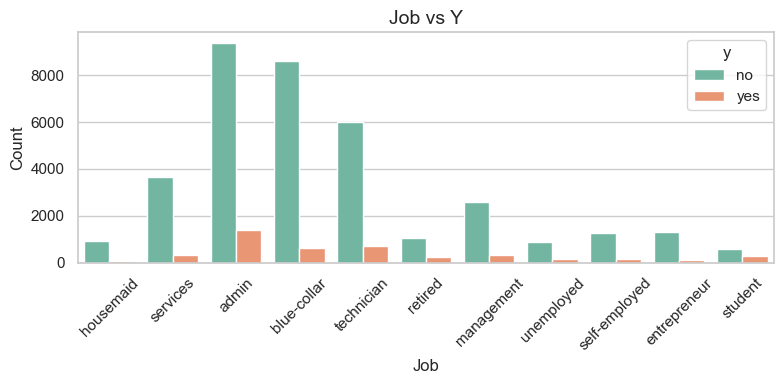

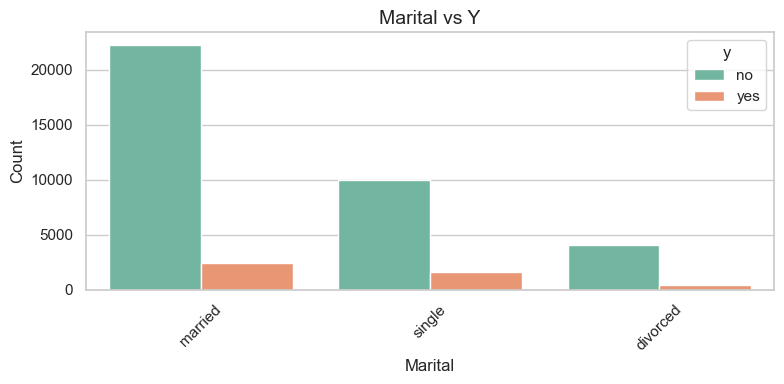

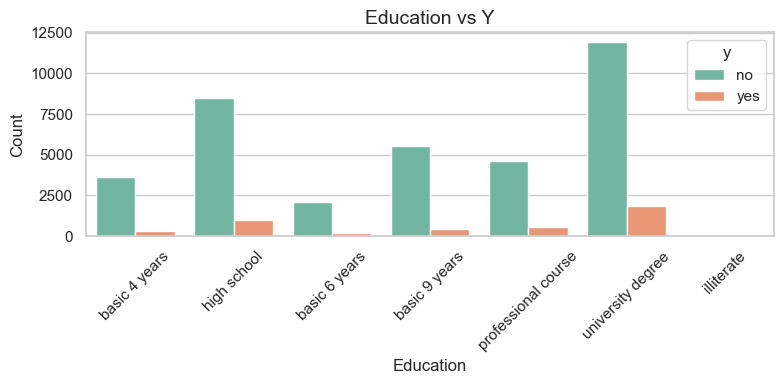

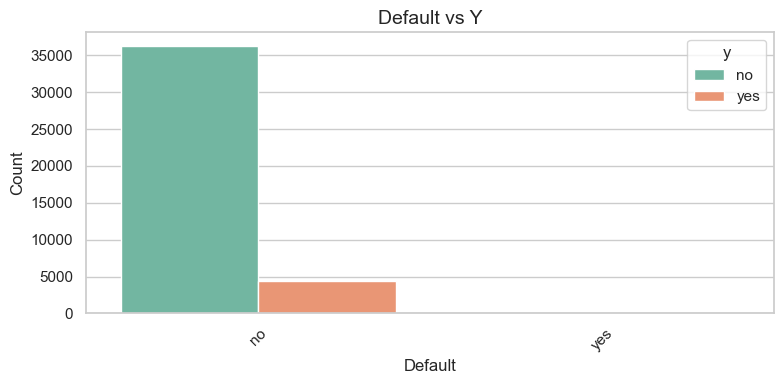

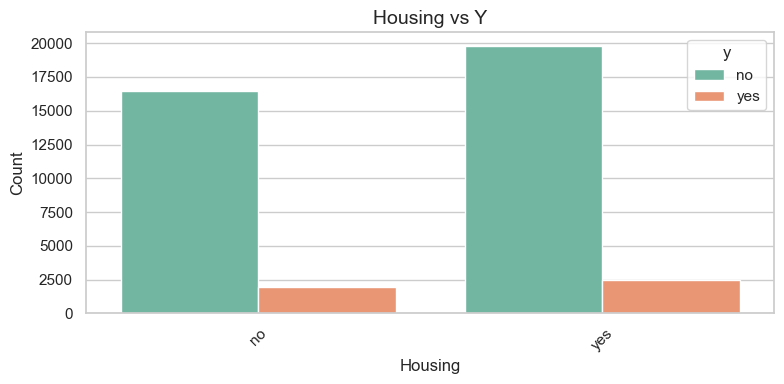

...

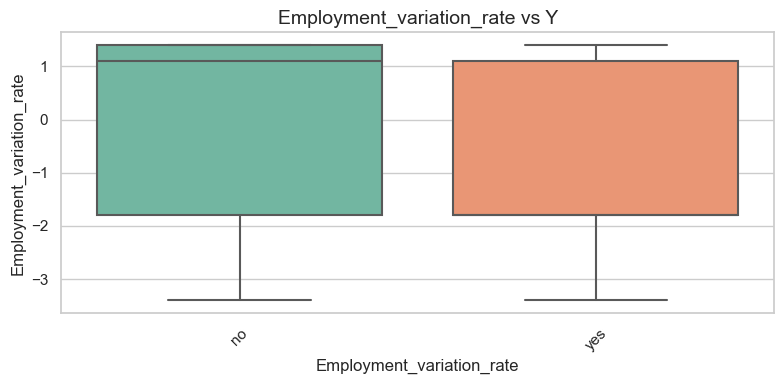

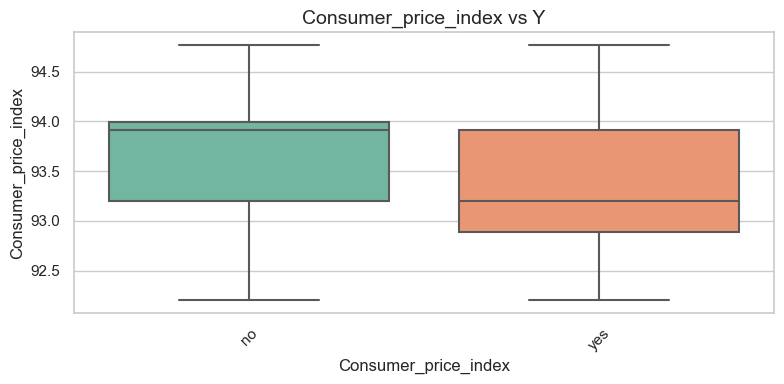

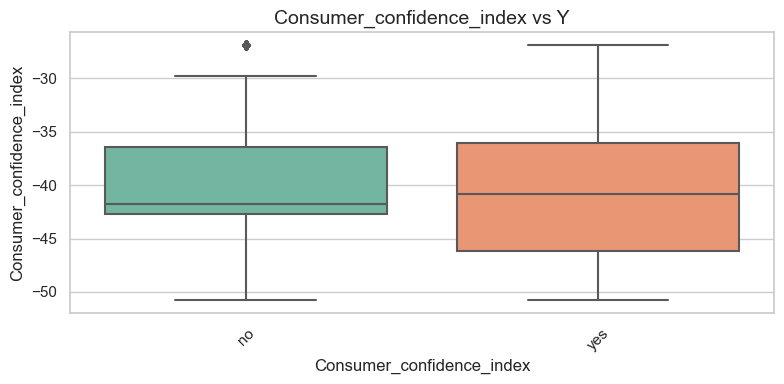

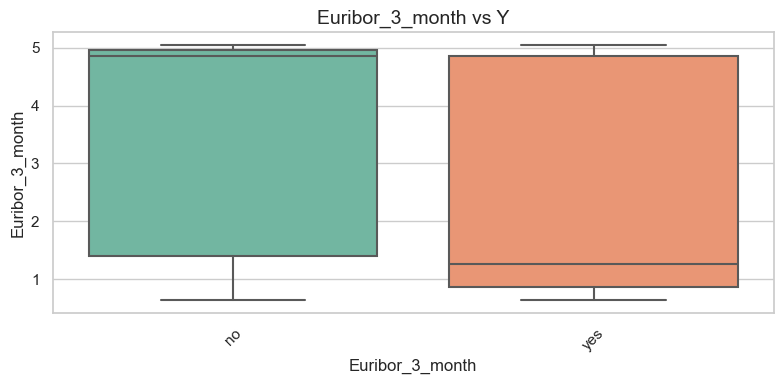

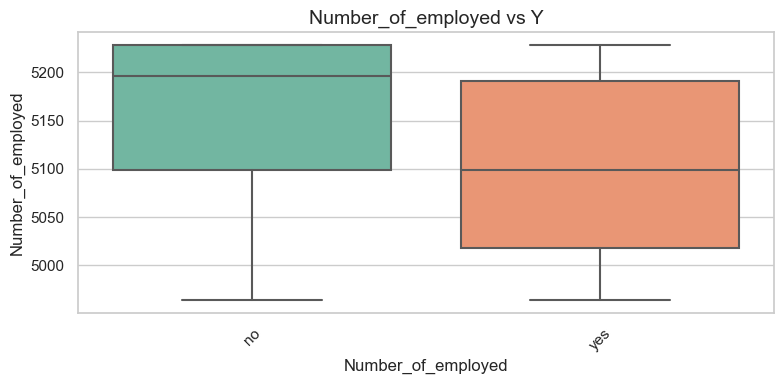

In [65]:
plot_bivariate_with_target(df, feature_columns, target_column)

1. **Job Vs Y**

**Job Type with Highest Approval Rates**: Admin. and services categories have a large number of individuals applying for loans, with admin. having the highest number of approved loans (1,352 out of 10,422). This suggests that those in administrative roles may have better access to loans.

**Blue-Collar Workers**: Blue-collar workers show a considerable number of loan applications, with 6,638 approvals. This indicates a relatively stable financial situation despite the challenges often faced in these roles.

**Low Approval Rates for Entrepreneurs**: Entrepreneurs have the lowest approval rate, with only 124 out of 1,456 applications approved. This could be indicative of the higher risk associated with self-employment.

**High Denial Rates for Housemaids and Students**: Housemaids and students have a significant number of loan applications but also a high number of denials (106 for housemaids and 275 for students), suggesting potential concerns over creditworthiness or income stability.

**Unemployed Individuals**: The unemployed category has a low approval rate (144 out of 1,014), which is expected, as lenders typically see unemployment as a risk factor.

2. **Education vs Y**

**Higher Approval Rates with Higher Education**: Individuals with a university degree have the highest number of approved loans (1,670 out of 12,168). This suggests that higher education correlates with better access to loans, likely due to perceived stability and creditworthiness.

**Significant Numbers in Secondary Education**: Those with a high school education also show a substantial number of approvals (1,031 out of 9,515), indicating that secondary education can still provide good access to loans.

**Basic Education Categories**: Individuals with basic 4 years, basic 6 years, and basic 9 years education levels have notably lower approval rates, with basic 9 years showing the highest number of applications but a low approval rate (473 out of 6,045). This suggests a potential barrier for those with lower educational attainment.

**Illiterate Individuals**: The illiterate group shows very low approval numbers. This reflects the significant challenges faced by individuals with no formal education.

**Professional Courses**: Those who have completed a professional course have a relatively good approval rate (595 out of 5,243), indicating that vocational training is viewed positively by lenders.

**Unknown Education Status**: The unknown category has a moderate number of approvals (251 out of 1,731), suggesting that there may be individuals in this group with potential but lacking formal documentation.

3. **Default Vs Y**

**Low Default Rate Among Approved Loans**: Individuals with no default status have a significantly higher number of approved loans, indicating that a good credit history is strongly associated with successful loan applications.


**No Instances of Defaulting Approved Loans**: The data indicates that there are no approved loans for individuals with a default status of yes. This reinforces the idea that lenders are highly unlikely to approve loans for individuals who have previously defaulted.


4. **Housing Vs Y**

**Housing Status and Loan Approvals**: Individuals without housing (status: no) have 2,026 approved loans out of 16,596 applications. This indicates a relatively lower approval rate compared to those who own housing.

Conversely, those with housing (status: yes) show a much higher approval rate, with 2,507 approved loans out of 19,069 applications. This suggests that having stable housing significantly enhances the likelihood of loan approval.


5. **Loan Vs Y**

**Loan Status**:
**No Loan**: The majority of individuals (30,100) did not take a loan, with 3,850 receiving approval despite not applying. This suggests that a large segment of the population either opts not to take loans or does not qualify for them.

**Loan Taken**: Among those who applied for a loan (5,565), 683 were approved. This indicates a moderate approval rate for those who actually applied.


6. **Contact Vs Y**

**Contact Method:**

**Cellular**: The majority of individuals (22,291) were contacted via cellular phone, with a notable 3,853 resulting in a positive outcome (e.g., approval). This suggests that cellular contact is highly effective for engagement.

**Telephone**: In contrast, 14,257 were contacted via traditional telephone, with only 787 achieving a positive outcome. This reflects a significantly lower success rate compared to cellular contacts.

7. **Month Vs Y**

**Highest Engagement**: March shows the highest number of individuals contacted, with 12,883 total, leading to 886 positive outcomes. This indicates May is a particularly effective month for engagement.

**Lowest Engagement**: December has the lowest number of contacts (93) but a relatively high positive outcome rate, with 89 approvals. This suggests that although fewer people are contacted, the likelihood of a positive response is high.

**Trends Over Months**: April (2,093)  show moderate contact numbers with comparable outcomes, suggesting a stable engagement level.

July and August have substantial engagement numbers (6,525 and 5,523, respectively), though the outcomes (649 and 655) indicate lower success rates compared to May.

8. **Day of week Vs Y**

**Overall Engagement**: Monday has the highest number of contacts at 7,667, closely followed by Tuesday (7,137) and Wednesday (7,185).

**Best Outcome Day**: Thursday shows the highest number of positive outcomes with 1,045 approvals, indicating it might be the most effective day for engagement.

**Lowest Engagement**: Friday has the lowest number of contacts (6,981) but still achieves a significant number of approvals (846).

9. **Age Vs Y**

The number of contacts generally increases with age, peaking around ages 20 to 30.

**Younger individuals (ages 17-21)** show notable engagement, while older age groups exhibit lower overall participation.

**Lower Engagement in Older Ages**: Engagement drops significantly for ages 40 and above, with very few approvals.

10. **Duration Vs Y**

**Short Durations (0-10 seconds)**: Contacts with a duration of 0 to 4 seconds show no successful outcomes, indicating that very short interactions are ineffective.

**Moderate Durations (5-100 seconds)**: The success rate remains low for moderate durations, with most interactions resulting in a "no."
For durations between 5 and 60 seconds, there are very few successful outcomes.

**Long Durations (100+ seconds)**: As duration increases, the likelihood of success starts to appear.

**Very Long Interactions**: High durations can lead to successful outcomes, indicating that longer interactions might be more effective in converting contacts.

## **MULTIVARIATE ANALYSIS**

In [66]:
# define a function for multivariate analysis based on selected features
def plot_multivariate_analysis(df, selected_features, plot_type='pairplot'):
    if plot_type == 'pairplot':
        # pairplot for all selected features
        sns.pairplot(df[selected_features], diag_kind='kde')
        plt.title(f'Pairplot for {selected_features}')
        plt.tight_layout()
        plt.show()

    elif plot_type == 'heatmap':
        # heatmap for correlation of selected features
        corr_matrix = df[selected_features].corr()
        plt.figure(figsize=(10,8))
        sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
        plt.title(f'Correlation Heatmap for {selected_features}', fontsize=16)
        plt.tight_layout()
        plt.show()

In [67]:
# defining the selected features
selected_features = ['employment_variation_rate', 'consumer_price_index', 'euribor_3_month', 'number_of_employed']

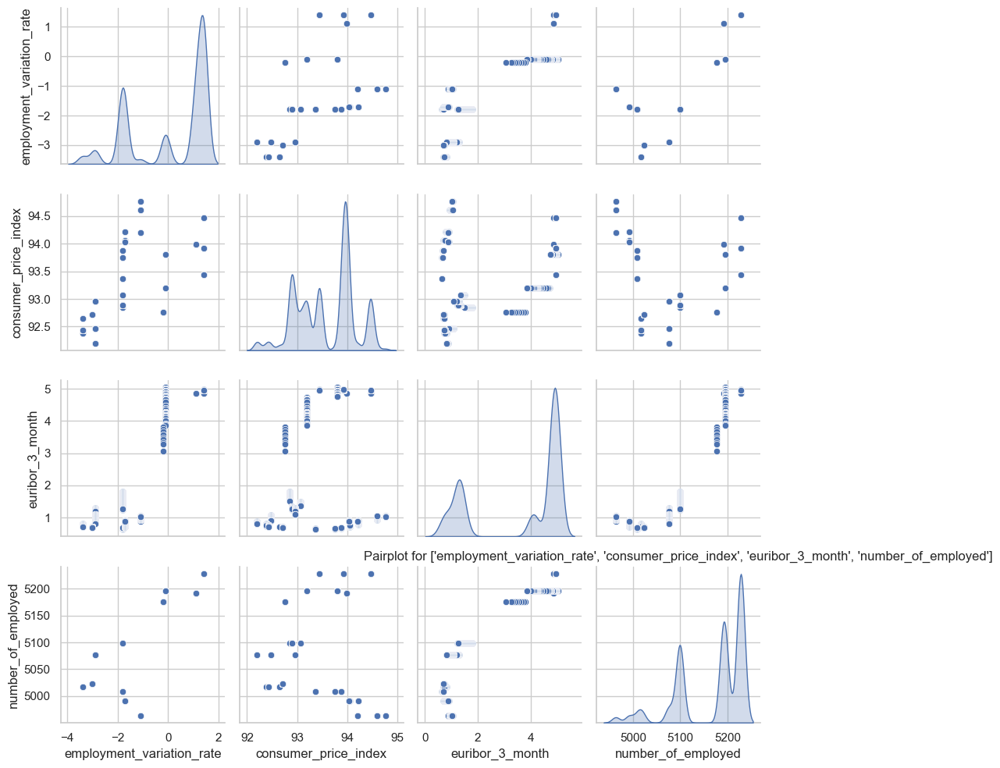

In [68]:
# calling out the plot_multivariate_analysis function with plot_type = pairplot
plot_multivariate_analysis(df, selected_features, plot_type='pairplot')

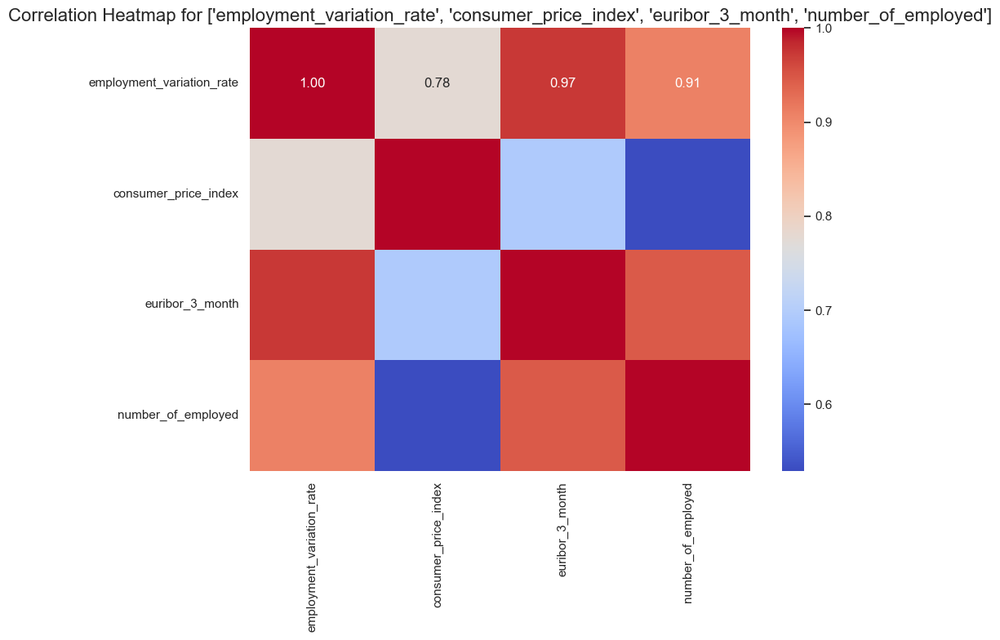

In [69]:
# calling out the plot_multivariate_analysis function with plot_type = heatmap
plot_multivariate_analysis(df, selected_features, plot_type='heatmap')

## **VIF (CHECKING FOR MULTICOLLINEARITY)**

In [70]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant


def calculate_vif(data, features):
    # Drop rows with infinite or missing values in selected features
    data = data[features].replace([np.inf, -np.inf], np.nan).dropna()

    X = data[features]
    X = add_constant(X)  # Adds constant for intercept

    vif_data = pd.DataFrame()
    vif_data['Feature'] = X.columns
    vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return vif_data

# Select numerical features
numerical_features = df.select_dtypes(include=['float64', 'int64']).columns.tolist()

# Calculate VIF
vif_df = calculate_vif(df, numerical_features)
print(vif_df)

                     Feature            VIF
0                      const  531352.669134
1                        age       1.037737
2                   duration       1.244293
3                   campaign       1.247905
4                   previous       1.215565
5  employment_variation_rate      33.494349
6       consumer_price_index       5.432704
7  consumer_confidence_index       3.185031
8            euribor_3_month      62.578559
9         number_of_employed      31.462515


Since, there VIF for employment_variation_rate, euribor_3_month and number_of_employed is more then 10, we are dropping these.

In [71]:
# Drop one of the features that were combined
df.drop(columns=['euribor_3_month', 'employment_variation_rate', 'number_of_employed'], inplace=True)


In [72]:
def calculate_vif(df, numerical_features):
    # 1. Subset the DataFrame:
    X = df[numerical_features]

    # 2. Replace infinite values with NaN:
    X = X.replace([np.inf, -np.inf], np.nan)

    # 3. Drop rows with any missing values:
    X = X.dropna()

    # 4. Add constant only after handling missing values:
    X = add_constant(X)  # Add a constant for VIF calculation

    vif_data = pd.DataFrame()
    vif_data["Feature"] = X.columns
    vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return vif_data

numerical_features = ['age', 'duration', 'campaign', 'previous',
                      'consumer_price_index', 'consumer_confidence_index',
                      'previous_contact']  # Updated features

vif_results = calculate_vif(df, numerical_features)
print(vif_results)

                     Feature           VIF
0                      const  33808.130804
1                        age      1.017904
2                   duration      1.158773
3                   campaign      1.136697
4                   previous      1.285450
5       consumer_price_index      1.218379
6  consumer_confidence_index      1.138362
7           previous_contact      1.126096


## **STATISTICAL TEST**

In [73]:
# seprate numerical and categorical features
numerical_features = df.select_dtypes(include=['float64', 'int64']).columns.drop('y', errors='ignore')
categorical_features = df.select_dtypes(include=['object']).columns.drop('y', errors='ignore')

***T-Test for Numerical Features***

In [74]:
df['duration'].fillna(df['duration'].mean(), inplace=True) # Replace with the mean

In [75]:
from scipy.stats import ttest_ind

numerical_results = []
for col in numerical_features:
    group1 = df[df['y'] == 'yes'][col]
    group2 = df[df['y'] == 'no'][col]
    t_statistic, p_value = ttest_ind(group1, group2)
    numerical_results.append({'Feature': col, 'T-Statistic': t_statistic, 'P-Value': p_value})

numerical_results_df = pd.DataFrame(numerical_results)
numerical_results_df

,Feature,T-Statistic,P-Value
0,age,-3.732204,1.900693e-04
1,duration,0.316754,7.514321e-01
2,campaign,-13.437532,4.458673e-41
3,previous,46.120205,0.000000e+00
4,consumer_price_index,-27.101534,2.515075e-160
5,consumer_confidence_index,8.963151,3.285899e-19


***T-Statistic:***   
This value indicates the degree of difference in means between the two groups (e.g., yes and no for y). A larger absolute T-statistic suggests a larger difference.

***P-Value:***   
If the p-value is below a chosen significance level (commonly 0.05), it indicates a statistically significant difference in the mean of the feature between the two classes.

“The mean of all the features differs significantly between clients who subscribed (y = yes) and those who did not (y = no). This indicates that all the features may be predictive of subscription.”

**Chi-Square Test for Categorical Features:**

In [76]:
from scipy.stats import chi2_contingency

categorical_results = []
for col in categorical_features:
    contingency_table = pd.crosstab(df[col], df['y'])
    chi2, p_val, _, _ = chi2_contingency(contingency_table)
    categorical_results.append({'Feature': col, 'Chi2': chi2, 'p-value': p_val})

categorical_results_df = pd.DataFrame(categorical_results)
categorical_results_df

,Feature,Chi2,p-value
0,job,709.229281,6.554603e-146
1,marital,163.008281,4.010527e-36
2,education,219.660446,1.229312e-44
3,default,0.000000,1.000000e+00
4,housing,4.518965,3.352110e-02
5,loan,1.040002,3.078209e-01
6,contact,802.915032,1.253956e-176
7,month,3007.023540,0.000000e+00
8,day_of_week,24.651598,5.911079e-05
9,poutcome,4004.864374,0.000000e+00


***Chi-Square Statistic:***  
This value indicates the degree of association between the categorical feature and the target variable.

***P-Value:***  
Similar to the t-test, a p-value below 0.05 typically implies a statistically significant association.

For each categorical feature with a significant p-value (< 0.05):

“The distribution of all the features except loan levels is significantly associated with the target variable, suggesting that certain categories of all the features except loan are more likely to relate to clients’ subscription decisions.”

***For features with non-significant p-values (≥ 0.05):***

“The lack of association between Loan and the target variable implies it may not contribute much toward predicting client subscriptions.”

Interpretation: This high p-value suggests that there is no strong evidence to support a significant difference or association between Loan and the target variable.

Implication: Loan as a feature may not be particularly useful in distinguishing between the classes of y (e.g., yes or no for subscription). Therefore, it may have limited predictive value for the model.

## **MODEL BUILDING**

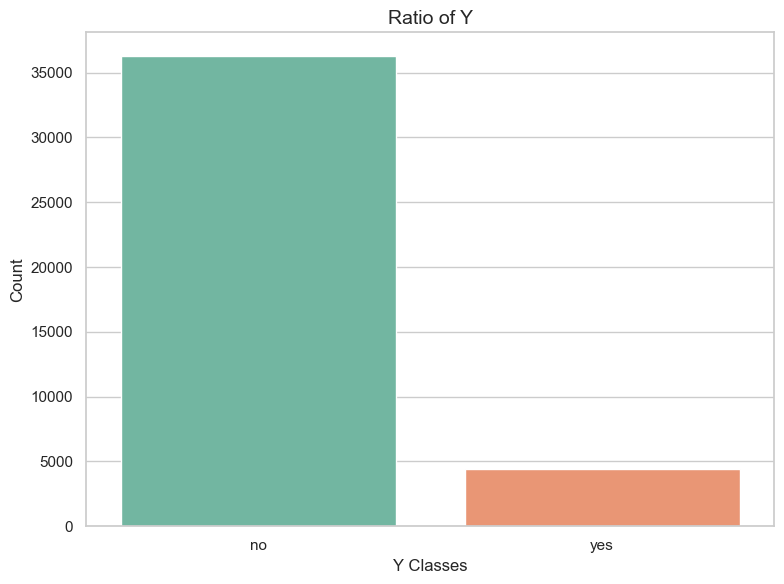

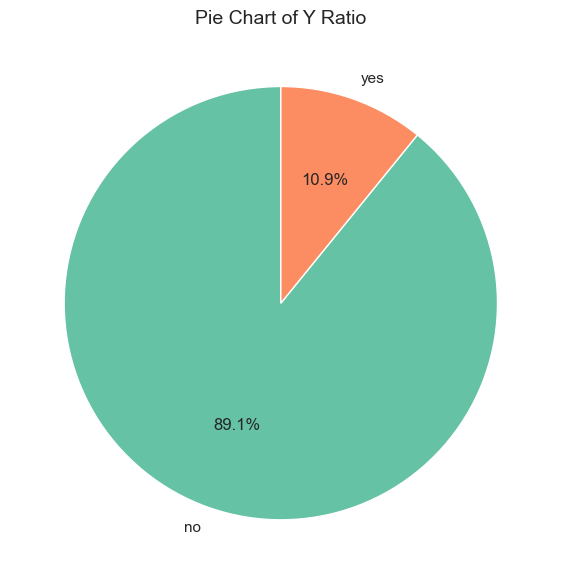

In [77]:
# Function to calculate and plot the ratio of the target variable (y)
def plot_target_ratio(df, target_column):
    # Calculate the count of each class (0 and 1)
    target_counts = df[target_column].value_counts()

    # Plotting the ratio using a bar plot
    plt.figure(figsize=(8, 6))
    sns.barplot(x=target_counts.index, y=target_counts.values, palette='Set2')
    plt.title(f'Ratio of {target_column.capitalize()}', fontsize=14)
    plt.xlabel(f'{target_column.capitalize()} Classes', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.xticks(rotation=0)
    plt.tight_layout()
    plt.show()

    # Plotting the ratio using a pie chart
    plt.figure(figsize=(8, 6))
    target_counts.plot.pie(autopct='%1.1f%%', startangle=90, colors=sns.color_palette('Set2', n_colors=2))
    plt.title(f'Pie Chart of {target_column.capitalize()} Ratio', fontsize=14)
    plt.ylabel('')  # Hide the ylabel
    plt.tight_layout()
    plt.show()

# Example usage:
plot_target_ratio(df, 'y')  # Replace 'y' with your target column name


In [78]:
df['y'].value_counts()

y
no     36300
yes     4419
Name: count, dtype: int64

## **Class Imbalance**:

The dataset is imbalanced, with "no" appearing much more frequently than "yes". This can impact the performance of machine learning models, as they may tend to predict the majority class (in this case, "no") more often, leading to lower predictive performance for the minority class ("yes").

**SPLITTING DATA**

In [79]:
# Define the feature matrix X and target vector y
X = df.drop('y', axis=1)  # Assuming 'y' is the target variable
y = df['y']  # Target variable
print(y)

0         no
1         no
2         no
3         no
4         no
        ... 
41181    yes
41182     no
41184     no
41185     no
41186    yes
Name: y, Length: 40719, dtype: object


In [80]:
# Convert target variable 'y' to binary
df['y'] = df['y'].map({'yes': 1, 'no': 0})

In [81]:
# Step 1: One-hot encode categorical variables (before splitting)
X = pd.get_dummies(df.drop('y', axis=1), drop_first=True)  # Ensure to drop 'y' column first
y = df['y']  # Target variable

In [82]:
# Step 2: Split the dataset into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [83]:
# Step 3: Standardize the numeric features (apply scaling to both train and test sets)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)  # Fit and transform on training data
X_test = scaler.transform(X_test)        # Only transform on test data (no fitting)

**Applying SMOTE:**

In [84]:
from imblearn.over_sampling import SMOTE
# Step 4: Apply SMOTE to the training data to balance the target variable
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)


In [85]:
# Step 5: Check the distribution of the target variable after SMOTE
print(f"Original y distribution: \n{y_train.value_counts()}")
print(f"SMOTE y distribution: \n{y_train_smote.value_counts()}")

Original y distribution: 
y
0    29046
1     3529
Name: count, dtype: int64
SMOTE y distribution: 
y
0    29046
1    29046
Name: count, dtype: int64


## **Cross Validation**

In [86]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import make_scorer, f1_score

# Step 1: Initialize the model
model = RandomForestClassifier(random_state=42)

# Step 2: Perform cross-validation with the SMOTE resampled data
cv_scores = cross_val_score(model, X_train_smote, y_train_smote, cv=5, scoring='f1')  # 5-fold CV

# Step 3: Print out the cross-validation results
print("Cross-validation F1 scores per fold: ", cv_scores)
print(f"Mean F1 score: {cv_scores.mean():.4f}")
print(f"Standard Deviation of F1 score: {cv_scores.std():.4f}")

Cross-validation F1 scores per fold:  [0.78636132 0.96759026 0.96796377 0.96735756 0.96521739]
Mean F1 score: 0.9309
Standard Deviation of F1 score: 0.0723


The mean F1 score of 0.9344 shows that the model is performing quite well, especially after applying SMOTE to balance the classes. This indicates that the model is effectively distinguishing between the classes while minimizing both false positives and false negatives.

The low standard deviation (0.0725) suggests that the model is stable, and the results are consistent across different splits

## **STEP 1: Metrics Selection**

Here are some commonly used metrics and the rationale for considering each in our business context of predicting whether a client will subscribe to a term deposit, based on a dataset from a direct marketing campaign:

1. ***Accuracy***

*   **Definition**: Accuracy is the ratio of correct predictions to total predictions.
*   **Usefulness**: It’s a straightforward metric to understand the overall correctness of the model. However, if the dataset is imbalanced (e.g., more clients do not subscribe than those who do), accuracy alone may not reflect true model performance.

2. ***Precision, Recall, and F1-Score
Precision***:  
The ratio of correctly predicted positive observations (subscribers) to the total predicted positives.


*   **Why Consider**: In this context, high precision would mean fewer false positives, so fewer clients would be incorrectly targeted as likely to subscribe.  

**Recall**: The ratio of correctly predicted positive observations to the all observations in the actual class.  



*  **Why Consider:** Recall is crucial if the business wants to ensure they identify most clients likely to subscribe, even at the cost of some false positives.


**F1-Score**: The harmonic mean of precision and recall.  


*   **Why Consider**: F1-Score balances precision and recall, making it effective in cases where there’s an imbalance between classes and both false positives and false negatives need consideration.


3. ***AUC-ROC (Area Under the Receiver Operating Characteristic Curve)***


*   **Definition**: This metric evaluates the ability of the model to distinguish between positive and negative classes by plotting true positive rates against false positive rates.
*   **Why Consider**: AUC-ROC is valuable for assessing the overall separability of the model and is less affected by class imbalance, which makes it ideal for banking or marketing datasets with imbalanced outcomes.

4. ***Confusion Matrix***

*   **Why it's important**: The confusion matrix provides a detailed breakdown of the model's true positives, false positives, true negatives, and false negatives.
*   **Business Implication**: While the confusion matrix is not typically used as a primary metric, it provides valuable insights into where the model is making errors. Understanding these error types helps the bank refine its marketing strategies, identify areas of improvement, and interpret the trade-offs between different types of errors.

#### **The Metrics we will use for the current Business Problem is F1 score. Because our Target Variable 'y' is imbalanced, hence there is a balanced between both Precision and Recall. Since, both are equally critical, F1 score will be a good choice for our models.**

***Logistic Regression Model***

In [87]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, precision_score, recall_score, f1_score, roc_auc_score # Initialize and train the Logistic Regression model

log_reg = LogisticRegression()
log_reg.fit(X_train_smote, y_train_smote)

LogisticRegression()

In [88]:
# Make predictions
y_pred_log_reg = log_reg.predict(X_test)

# Evaluation
print("Logistic Regression Performance:")
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_log_reg))
print("Accuracy:", accuracy_score(y_test, y_pred_log_reg))
print("Precision:", precision_score(y_test, y_pred_log_reg)) # Specify pos_label as 'yes'
print("Recall:", recall_score(y_test, y_pred_log_reg)) # Specify pos_label as 'yes'
print("F1 Score:", f1_score(y_test, y_pred_log_reg)) # Specify pos_label as 'yes'
print("ROC-AUC:", roc_auc_score(y_test, log_reg.predict_proba(X_test)[:, 1]))

Logistic Regression Performance:
Confusion Matrix:
 [[5963 1291]
 [ 346  544]]
Accuracy: 0.7989931237721022
Precision: 0.2964577656675749
Recall: 0.6112359550561798
F1 Score: 0.39926605504587154
ROC-AUC: 0.7610823009699414


***Decision Tree Model***

In [89]:
# Initialize and train the Decision Tree model
dt = DecisionTreeClassifier(random_state=42)  # Adjust max_depth for tree complexity
dt.fit(X_train_smote, y_train_smote)

DecisionTreeClassifier(random_state=42)

In [90]:
y_pred_dt = dt.predict(X_test)

In [91]:
# Evaluation
print("\nDecision Tree Performance:")
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_dt))
print("Accuracy:", accuracy_score(y_test, y_pred_dt))
print("Precision:", precision_score(y_test, y_pred_dt)) # Specify pos_label as 'yes'
print("Recall:", recall_score(y_test, y_pred_dt)) # Specify pos_label as 'yes'
print("F1 Score:", f1_score(y_test, y_pred_dt)) # Specify pos_label as 'yes'
print("ROC-AUC:", roc_auc_score(y_test, dt.predict_proba(X_test)[:, 1]))


Decision Tree Performance:
Confusion Matrix:
 [[6533  721]
 [ 581  309]]
Accuracy: 0.8401277013752456
Precision: 0.3
Recall: 0.3471910112359551
F1 Score: 0.32187499999999997
ROC-AUC: 0.626066594796207


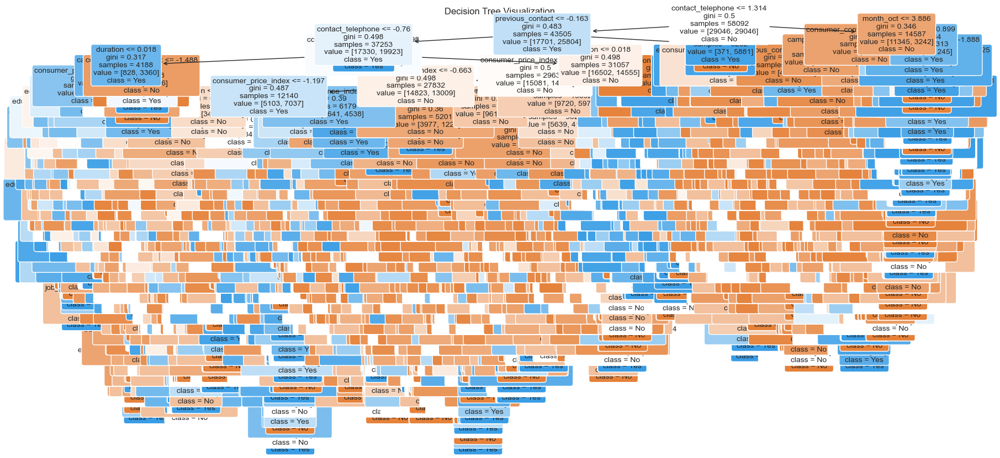

In [92]:
# Plot the Decision Tree
plt.figure(figsize=(20, 10))
plot_tree(dt,
          filled=True,
          feature_names=X.columns,
          class_names=['No', 'Yes'],  # Assuming binary classes with 'No' and 'Yes'
          rounded=True,
          fontsize=10)
plt.title("Decision Tree Visualization")
plt.show()

***Random Forest Model***

In [93]:
rf = RandomForestClassifier(random_state=42)
rf.fit(X_train_smote, y_train_smote)

RandomForestClassifier(random_state=42)

In [94]:
y_pred_rf = rf.predict(X_test)

In [95]:
# Evaluation
print("\nRandom Forest Performance:")
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_rf))
print("Accuracy:", accuracy_score(y_test, y_pred_rf))
print("Precision:", precision_score(y_test, y_pred_rf)) # Specify pos_label
print("Recall:", recall_score(y_test, y_pred_rf))       # Specify pos_label
print("F1 Score:", f1_score(y_test, y_pred_rf))         # Specify pos_label
print("ROC-AUC:", roc_auc_score(y_test, rf.predict_proba(X_test)[:, 1]))


Random Forest Performance:
Confusion Matrix:
 [[6906  348]
 [ 584  306]]
Accuracy: 0.8855599214145383
Precision: 0.46788990825688076
Recall: 0.3438202247191011
F1 Score: 0.3963730569948187
ROC-AUC: 0.7795051471021025


***GRADIENT BOOSTING Model***

In [96]:
# Build the Gradient Boosting model
gb = GradientBoostingClassifier(random_state=42)
gb.fit(X_train_smote, y_train_smote)

GradientBoostingClassifier(random_state=42)

In [97]:
# Make predictions on the test set
y_pred_gb = gb.predict(X_test)

In [98]:
# Evaluate the model
print("\nGradient Boosting Performance:")
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_gb))
print("Accuracy:", accuracy_score(y_test, y_pred_gb))
print("Precision:", precision_score(y_test, y_pred_gb)) # Specify pos_label here
print("Recall:", recall_score(y_test, y_pred_gb))       # Specify pos_label here
print("F1 Score:", f1_score(y_test, y_pred_gb))         # Specify pos_label here
print("ROC-AUC:", roc_auc_score(y_test, gb.predict_proba(X_test)[:, 1]))


Gradient Boosting Performance:
Confusion Matrix:
 [[6906  348]
 [ 568  322]]
Accuracy: 0.887524557956778
Precision: 0.48059701492537316
Recall: 0.36179775280898874
F1 Score: 0.41282051282051274
ROC-AUC: 0.80643898910481


***K-Nearest Neighbors***

In [99]:
from sklearn.neighbors import KNeighborsClassifier

# Build the KNN model
knn_model = KNeighborsClassifier()  # You can adjust n_neighbors
knn_model.fit(X_train_smote, y_train_smote)  # Fit the model to the training data

KNeighborsClassifier()

In [100]:
# Make predictions on the test set
y_pred_knn = knn_model.predict(X_test)

In [101]:
# Evaluate the model
print("\nKNeighbors Classifier Performance:")
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_knn))
print("Accuracy:", accuracy_score(y_test, y_pred_knn))
print("Precision:", precision_score(y_test, y_pred_knn))
print("Recall:", recall_score(y_test, y_pred_knn))
print("F1 Score:", f1_score(y_test, y_pred_knn))
print("ROC-AUC:", roc_auc_score(y_test, knn_model.predict_proba(X_test)[:, 1]))


KNeighbors Classifier Performance:
Confusion Matrix:
 [[5670 1584]
 [ 384  506]]
Accuracy: 0.7583497053045186
Precision: 0.24210526315789474
Recall: 0.5685393258426966
F1 Score: 0.3395973154362416
ROC-AUC: 0.704608615781142


***LightGBM***

In [102]:
import lightgbm as lgb

# build the light gbm model
lgbm = lgb.LGBMClassifier()
lgbm.fit(X_train_smote, y_train_smote)

[LightGBM] [Info] Number of positive: 29046, number of negative: 29046
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012147 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7587
[LightGBM] [Info] Number of data points in the train set: 58092, number of used features: 43
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


LGBMClassifier()

In [103]:
# Make predictions on the test set
y_pred_lgbm = lgbm.predict(X_test)

In [104]:
# Evaluate the model
print("\nLightGBM Performance:")
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_lgbm))
print("Accuracy:", accuracy_score(y_test, y_pred_lgbm))
print("Precision:", precision_score(y_test, y_pred_lgbm))
print("Recall:", recall_score(y_test, y_pred_lgbm))
print("F1 Score:", f1_score(y_test, y_pred_lgbm))
print("ROC-AUC:", roc_auc_score(y_test, lgbm.predict_proba(X_test)[:, 1]))


LightGBM Performance:
Confusion Matrix:
 [[7043  211]
 [ 633  257]]
Accuracy: 0.8963654223968566
Precision: 0.5491452991452992
Recall: 0.28876404494382024
F1 Score: 0.37849779086892493
ROC-AUC: 0.8076710873195106


***Support Vector Machine (SVM)***

In [105]:
from sklearn.svm import SVC

svm = SVC(probability=True, random_state=42)
svm.fit(X_train_smote, y_train_smote)

SVC(probability=True, random_state=42)

In [106]:
# Make predictions
y_pred = svm.predict(X_test)
y_proba = svm.predict_proba(X_test)[:, 1]  # For ROC-AUC

In [107]:
# Evaluate the model
print("\nSupport Vector Machine :")
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Precision:", precision_score(y_test, y_pred))
print("Recall:", recall_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred))
print("ROC-AUC:", roc_auc_score(y_test, y_proba))


Support Vector Machine :
Confusion Matrix:
 [[6527  727]
 [ 430  460]]
Accuracy: 0.8579322200392927
Precision: 0.3875315922493682
Recall: 0.5168539325842697
F1 Score: 0.44294655753490614
ROC-AUC: 0.7679060448632757


## **STEP 2: Metrics Details Of All Algorithms**

In [108]:
# Initialize models
models = {
    'Logistic Regression': LogisticRegression(),
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'Random Forest': RandomForestClassifier(random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'K-Nearest Neighbors': KNeighborsClassifier(),
    'LightGBM': lgb.LGBMClassifier(),
    'Support Vector Machine': SVC(probability=True, random_state=42)}

# Dictionary to store model performance
results = []

# Train and evaluate each model
for model_name, model in models.items():
    model.fit(X_train_smote, y_train_smote)
    y_pred = model.predict(X_test)
    y_proba = model.predict_proba(X_test)[:, 1] if hasattr(model, "predict_proba") else None

    # Compute metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_proba) if y_proba is not None else 'N/A'

    # Append results
    results.append({
        "Model": model_name,
        "Accuracy": accuracy,
        "Precision": precision,
        "Recall": recall,
        "F1 Score": f1,
        "ROC-AUC": roc_auc
    })

# Convert results to DataFrame for better visualization
results_df = pd.DataFrame(results)
print(results_df)

[LightGBM] [Info] Number of positive: 29046, number of negative: 29046
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010245 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7587
[LightGBM] [Info] Number of data points in the train set: 58092, number of used features: 43
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
                    Model  Accuracy  Precision    Recall  F1 Score   ROC-AUC
0     Logistic Regression  0.798993   0.296458  0.611236  0.399266  0.761082
1           Decision Tree  0.840128   0.300000  0.347191  0.321875  0.626067
2           Random Forest  0.885560   0.467890  0.343820  0.396373  0.779505
3       Gradient Boosting  0.887525   0.480597  0.361798  0.412821  0.806439
4     K-Nearest Neighbors  0.758350   0.242105  0.568539  0.339597  0.704609
5                LightGBM  0.896365

## **STEP 3:**

### **Part 1: Identifying the 5 Best Models and Their Significant features**

Models chosen -

1.  Decision Tree
2.   Random forest
3. Gradient boosting
4. Light GBM
5. Logistic Regression 

In [109]:
from lightgbm import LGBMClassifier

# Define models
models = {
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "Random Forest": RandomForestClassifier(random_state=42),
    "Gradient Boosting": GradientBoostingClassifier(random_state=42),
    "Logistic Regression": LogisticRegression(random_state=42),
    "Light GBM": LGBMClassifier()
}

# Step 1: Train models and gather feature importances
feature_importance = {}
for model_name, model in models.items():
    model.fit(X_train_smote, y_train_smote)

    # Extract feature importance or coefficients
    if hasattr(model, 'feature_importances_'):
        importance = model.feature_importances_

    elif hasattr(model, 'coef_'):
        importance = np.abs(model.coef_).flatten()

    else:
        continue  # Skip models without feature importance

    feature_importance[model_name] = importance

[LightGBM] [Info] Number of positive: 29046, number of negative: 29046
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009392 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7587
[LightGBM] [Info] Number of data points in the train set: 58092, number of used features: 43
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


### **Part 2: Voting Mechanism For Selecting Top 10 Features**

In [110]:
# Step 2: Voting mechanism to select top 8-10 features
feature_votes = pd.DataFrame(feature_importance, index=X.columns).mean(axis=1)
top_features = feature_votes.nlargest(10).index.tolist()  # Select top 10 features

### **Part 3: Retraning The Chosen Models With Top features**

In [111]:
# Step 3: Retrain models with selected features and evaluate
results = []

X_train_reduced = X_train_smote[:, np.isin(X.columns, top_features)]
X_test_reduced = X_test[:, np.isin(X.columns, top_features)]

for model_name, model in models.items():
    model.fit(X_train_reduced, y_train_smote)
    y_pred = model.predict(X_test_reduced)
    y_proba = model.predict_proba(X_test_reduced)[:, 1] if hasattr(model, "predict_proba") else None

    # Compute metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_proba) if y_proba is not None else 'N/A'

    # Append results
    results.append({
        "Model": model_name,
        "Selected Features": top_features,
        "Accuracy": accuracy,
        "Precision": precision,
        "Recall": recall,
        "F1 Score": f1,
        "ROC-AUC": roc_auc
    })

# Convert results to DataFrame for easy viewing
results_df = pd.DataFrame(results)
print(results_df)

[LightGBM] [Info] Number of positive: 29046, number of negative: 29046
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003277 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2368
[LightGBM] [Info] Number of data points in the train set: 58092, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
                 Model                                  Selected Features  \
0        Decision Tree  [age, campaign, consumer_confidence_index, con...   
1        Random Forest  [age, campaign, consumer_confidence_index, con...   
2    Gradient Boosting  [age, campaign, consumer_confidence_index, con...   
3  Logistic Regression  [age, campaign, consumer_confidence_index, con...   
4            Light GBM  [age, campaign, consumer_confidence_index, con...   

   Accuracy  Precision    Recall  

In [112]:
print(top_features)

['age', 'campaign', 'consumer_confidence_index', 'consumer_price_index', 'duration', 'housing_yes', 'day_of_week_thu', 'month_may', 'previous', 'day_of_week_mon']


## **STEP 4: Hyperparameter for Tuning**

In [113]:
# parameter grid for decision tree
dt_param_grid = {
        "max_depth": [10,20,30],
        "min_samples_split": [2, 5, 10],
        "min_samples_leaf": [1,2,4]}

# selected model for tuning
dt_model = DecisionTreeClassifier(random_state=42)

dt_grid_search = GridSearchCV(dt_model, dt_param_grid, cv=5, scoring='f1', n_jobs=-1, verbose=2)
dt_grid_search.fit(X_train_reduced, y_train_smote)

# Decision Tree Results
dt_best_params = dt_grid_search.best_params_
dt_f1 = f1_score(y_test, dt_grid_search.best_estimator_.predict(X_test_reduced), average='weighted')

Fitting 5 folds for each of 27 candidates, totalling 135 fits


In [114]:
# parameter grid for random forest
rf_param_grid = {
        "n_estimators": [100,200,300],
        "max_depth": [10,20,30],
        "min_samples_split": [2, 5, 10],
        "min_samples_leaf": [1,2,4]}

# selected model for tuning
rf_model = RandomForestClassifier(random_state=42)

rf_grid_search = GridSearchCV(rf_model, rf_param_grid, cv=5, scoring='f1', n_jobs=-1, verbose=2)
rf_grid_search.fit(X_train_reduced, y_train_smote)

# Random Forest Results
rf_best_params = rf_grid_search.best_params_
rf_f1 = f1_score(y_test, rf_grid_search.best_estimator_.predict(X_test_reduced), average='weighted')

Fitting 5 folds for each of 81 candidates, totalling 405 fits


In [115]:
# parameter grid for gradient boosting model
gb_param_grid = {
        "n_estimators": [100,200,300],
        "learning_rate": [0.01, 0.1, 1],
        "max_depth": [3, 5, 7]}

# selected model for tuning
gb_model = GradientBoostingClassifier(random_state=42)

gb_grid_search = GridSearchCV(gb_model, gb_param_grid, cv=5, scoring='f1', n_jobs=-1, verbose=2)
gb_grid_search.fit(X_train_reduced, y_train_smote)

# Gradient Boosting Results
gb_best_params = gb_grid_search.best_params_
gb_f1 = f1_score(y_test, gb_grid_search.best_estimator_.predict(X_test_reduced), average='weighted')


Fitting 5 folds for each of 27 candidates, totalling 135 fits


In [120]:
# parameter grid for Logistic Regression
logreg_param_grid = { 
    "C": [0.01, 0.1, 1, 10, 100],
    "max_iter": [100, 200, 300]}

# Selected model for tuning
logreg_model = LogisticRegression(random_state=42)

logreg_grid_search = GridSearchCV(logreg_model, logreg_param_grid, cv=5, scoring='f1', n_jobs=-1, verbose=2)
logreg_grid_search.fit(X_train_reduced, y_train_smote)

# Logistic Regression Results
logreg_best_params = logreg_grid_search.best_params_
logreg_f1 = f1_score(y_test, logreg_grid_search.best_estimator_.predict(X_test_reduced), average='weighted')

Fitting 5 folds for each of 15 candidates, totalling 75 fits


In [116]:
# parameter for Light GBM model
lgbm_param_grid = {
        "learning_rate": [0.01, 0.1, 1],
        "n_estimators": [100,200,300],
        "max_depth": [3, 5, 7]}

# select mmodel for tuning
lgbm_model = LGBMClassifier(random_state=42)

lgbm_grid_search = GridSearchCV(lgbm_model, lgbm_param_grid, cv=5, scoring='f1', n_jobs=-1, verbose=2)
lgbm_grid_search.fit(X_train_reduced, y_train_smote)

# Light GBM Results
lgbm_best_params = lgbm_grid_search.best_params_
lgbm_f1 = f1_score(y_test, lgbm_grid_search.best_estimator_.predict(X_test_reduced), average='weighted')


Fitting 5 folds for each of 27 candidates, totalling 135 fits
[LightGBM] [Info] Number of positive: 29046, number of negative: 29046
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004182 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2368
[LightGBM] [Info] Number of data points in the train set: 58092, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


In [121]:
# Initialize an empty dictionary to store results
model_results = {
    "Model": [],
    "Best Parameters": [],
    "F1 Score": []
}
# Decision Tree Results
model_results["Model"].append("Decision Tree")
model_results["Best Parameters"].append(dt_best_params)
model_results["F1 Score"].append(dt_f1)

# Random Forest Results
model_results["Model"].append("Random Forest")
model_results["Best Parameters"].append(rf_best_params)
model_results["F1 Score"].append(rf_f1)

# Gradient Boosting Results
model_results["Model"].append("Gradient Boosting")
model_results["Best Parameters"].append(gb_best_params)
model_results["F1 Score"].append(gb_f1)

# Light GBM Results
model_results["Model"].append("Light GBM")
model_results["Best Parameters"].append(lgbm_best_params)
model_results["F1 Score"].append(lgbm_f1)

# Logistic Regression Results
model_results["Model"].append("Logistic Regression")
model_results["Best Parameters"].append(logreg_best_params)
model_results["F1 Score"].append(logreg_f1)


# Convert the results dictionary to a DataFrame
results_df = pd.DataFrame(model_results)

# Display the results DataFrame
print(results_df)

# Save the DataFrame as a CSV file for reference
#results_df.to_csv("model_comparison_results.csv", index=False)


                 Model                                    Best Parameters  \
0        Decision Tree  {'max_depth': 30, 'min_samples_leaf': 1, 'min_...   
1        Random Forest  {'max_depth': 30, 'min_samples_leaf': 1, 'min_...   
2    Gradient Boosting  {'learning_rate': 1, 'max_depth': 3, 'n_estima...   
3            Light GBM  {'learning_rate': 1, 'max_depth': 7, 'n_estima...   
4  Logistic Regression                       {'C': 0.01, 'max_iter': 100}   

   F1 Score  
0  0.872904  
1  0.880973  
2  0.884628  
3  0.868001  
4  0.731092  


## **Step 5: New Features That Could Be Created**

Here are some new features based on the typical characteristics of marketing data and banking client information:

***Call Duration Analysis:*** Segment clients based on the duration of calls:

*   **Duration Buckets:** Create categorical buckets based on duration, such as
“short”, “medium”, and “long”.
*   **Average Duration:** Average call duration across past contacts for each client.


***Previous Campaign Interaction:***


*   **Previous Contact Ratio:** Calculate the ratio of successful vs. unsuccessful calls in previous campaigns.
*   **Recency Analysis:** Group clients based on the “pdays” (days since last contact) feature, categorizing as “recent”, “medium”, and “long time ago”.



***Campaign Engagement Metrics:***

*   **Engagement Score:** Combine attributes like “campaign” (number of contacts during the campaign) and “previous” (number of contacts before the campaign) to create an engagement score.
*   **Call Frequency**: Divide the total calls by the campaign length to indicate engagement frequency.


***Temporal Features:***

*   **Seasonality:** Extract a feature indicating the season (spring, summer, fall, winter) based on the “month” feature.
*   **Weekday vs. Weekend:** Group “day_of_week” into weekday/weekend for potential behavioral insights.


***Economic Indicators Aggregation:***



*   **Composite Economic Score:** Aggregate economic indicators like “employment_variation_rate”, “consumer_price_index”, and “euribor_3_month” into a single score, reflecting the general economic condition.



***Customer Demographics and Financial Background:***



*   **Age Group:** Segment customers into age groups, such as “young adult”, “middle-aged”, and “senior”.
*   **Employment Stability:** Based on job type, education, and marital status, create a stability score.